In [10]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append('..')

# Imports

In [11]:
import pandas as pd
import numpy as np
import tensorflow as tf

from src import models
from src import experimental_setup

# Experimental setup

In [12]:
mordred = models.DNN_Mordred
sampling_type = 'random'

kfold = experimental_setup.CrossValidator(
    splits = 5, # dont change without re-running data preprocessing
    sampling_type = sampling_type
)

converter = experimental_setup.LD50UnitConverter()

# Deep Ensemble

## Calibration

To run Deep Ensemble uncertainty quantifications, we find the optimal number of ensemble units to employ. Train 30DNN-Mordred models on LDToxDB in the standard way.

In [4]:
# We are only worried about the first fold, no need to iterate through all five

train, test = next(kfold.get_folds('mordred'))

x_train, y_train, smiles_train = train
x_test, y_test, smiles_test = test

y_train = experimental_setup.scaler.fit_transform(y_train)

for ensemble_no in range(30):
    model = mordred()
    model.seed += ensemble_no #increment the seed so each ensemble is a new optimization
    model.fit(x_train.astype(np.float32), y_train)

    y_hat = experimental_setup.scaler.inverse_transform(model.predict(x_test))

    results = pd.DataFrame({
        'smiles': smiles_test.flatten(),
        'prediction_neglogld50': y_hat.flatten(),
        'prediction_mgkg': converter.convert_to_mgkg(y_hat, smiles_test),
        'prediction_epa': converter.convert_to_epa(y_hat, smiles_test),
        'actual_neglogld50': y_test.flatten(),
        'actual_mgkg': converter.convert_to_mgkg(y_test, smiles_test),
        'actual_epa': converter.convert_to_epa(y_test, smiles_test),
    })

    # Save model
    fn = 'dnn_mordred_' + sampling_type + '_ensemble' + str(ensemble_no)
    results.to_csv('../data/deep-ensemble/calibration/%s_predictions.csv' % fn)

Train on 10663 samples
Epoch 1/1000
10663/10663 [==============================] - 2s 171us/sample - loss: 2.9582 - mse: 2.9582 - mae: 1.0083
Epoch 2/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.6236 - mse: 0.6236 - mae: 0.5864
Epoch 3/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.5441 - mse: 0.5441 - mae: 0.5465
Epoch 4/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.5012 - mse: 0.5012 - mae: 0.5228
Epoch 5/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.4404 - mse: 0.4404 - mae: 0.4918
Epoch 6/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.3898 - mse: 0.3898 - mae: 0.4647
Epoch 7/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.3582 - mse: 0.3582 - mae: 0.4461
Epoch 8/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.3399 - mse: 0.3399 - mae: 0.4329
Epoch 9/1000
10663/10663 [======

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0607 - mse: 0.0607 - mae: 0.1734
Epoch 138/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0624 - mse: 0.0624 - mae: 0.1799
Epoch 139/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0564 - mse: 0.0564 - mae: 0.1739
Epoch 140/1000
10663/10663 [==============================] - 1s 59us/sample - loss: 0.0514 - mse: 0.0514 - mae: 0.1651
Epoch 141/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0457 - mse: 0.0457 - mae: 0.1562
Epoch 142/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0516 - mse: 0.0516 - mae: 0.1658
Epoch 143/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0464 - mse: 0.0464 - mae: 0.1598
Epoch 144/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0443 - mse: 0.0443 - mae: 0.1546
Epoch 145/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1236
Epoch 273/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1186
Epoch 274/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1145
Epoch 275/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1251
Epoch 276/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1243
Epoch 277/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1182
Epoch 278/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0277 - mse: 0.0277 - mae: 0.1190
Epoch 279/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1198
Epoch 280/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0313 - mse: 0.0313 - mae: 0.1236
Epoch 341/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1241
Epoch 342/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1208
Epoch 343/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1204
Epoch 344/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1179
Epoch 345/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0333 - mse: 0.0333 - mae: 0.1310
Epoch 346/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1188
Epoch 347/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1287
Epoch 348/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 49us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1012
Epoch 475/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1066
Epoch 476/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0959
Epoch 477/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0962
Epoch 478/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1043
Epoch 479/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0914
Epoch 480/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1033
Epoch 481/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0963
Epoch 482/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0954
Epoch 611/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0984
Epoch 612/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0910
Epoch 613/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0964
Epoch 614/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0930
Epoch 615/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0887
Epoch 616/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0904
Epoch 617/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0822
Epoch 618/1000
10663/10663 [===========================

Epoch 746/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0913
Epoch 747/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0875
Epoch 748/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0896
Epoch 749/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0862
Epoch 750/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1117
Epoch 751/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0899
Epoch 752/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0898
Epoch 753/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0938
Epoch 754/1000
10663/10663 [============

Epoch 882/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0838
Epoch 883/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0868
Epoch 884/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0836
Epoch 885/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0835
Epoch 886/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0828
Epoch 887/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0880
Epoch 888/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0889
Epoch 889/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1057
Epoch 890/1000
10663/10663 [============

10663/10663 [==============================] - 0s 47us/sample - loss: 0.2293 - mse: 0.2293 - mae: 0.3610
Epoch 18/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2327 - mse: 0.2327 - mae: 0.3635
Epoch 19/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1995 - mse: 0.1995 - mae: 0.3357
Epoch 20/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.1997 - mse: 0.1997 - mae: 0.3363
Epoch 21/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.1930 - mse: 0.1930 - mae: 0.3285
Epoch 22/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1917 - mse: 0.1917 - mae: 0.3266
Epoch 23/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1795 - mse: 0.1795 - mae: 0.3171
Epoch 24/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.1736 - mse: 0.1736 - mae: 0.3133
Epoch 25/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 1s 48us/sample - loss: 0.0450 - mse: 0.0450 - mae: 0.1532
Epoch 152/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0461 - mse: 0.0461 - mae: 0.1591
Epoch 153/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0518 - mse: 0.0518 - mae: 0.1694
Epoch 154/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0477 - mse: 0.0477 - mae: 0.1587
Epoch 155/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0449 - mse: 0.0449 - mae: 0.1552
Epoch 156/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0429 - mse: 0.0429 - mae: 0.1492
Epoch 157/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0473 - mse: 0.0473 - mae: 0.1579
Epoch 158/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0401 - mse: 0.0401 - mae: 0.1461
Epoch 159/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1173
Epoch 288/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1072
Epoch 289/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1117
Epoch 290/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0297 - mse: 0.0297 - mae: 0.1225
Epoch 291/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0268 - mse: 0.0268 - mae: 0.1166
Epoch 292/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0307 - mse: 0.0307 - mae: 0.1282
Epoch 293/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1187
Epoch 294/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0293 - mse: 0.0293 - mae: 0.119 - 0s 46us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1200
Epo

Epoch 355/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1051
Epoch 356/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1035
Epoch 357/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1136
Epoch 358/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1124
Epoch 359/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1112
Epoch 360/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1149
Epoch 361/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1193
Epoch 362/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0276 - mse: 0.0276 - mae: 0.11850s - loss: 0.0273 - mse: 0.0273 - mae: 0.

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1076
Epoch 491/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1019
Epoch 492/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0944
Epoch 493/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0962
Epoch 494/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1083
Epoch 495/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0990
Epoch 496/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0882
Epoch 497/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0961
Epoch 498/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.0997
Epoch 627/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0962
Epoch 628/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0948
Epoch 629/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0887
Epoch 630/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0884
Epoch 631/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0934
Epoch 632/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0796
Epoch 633/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0941
Epoch 634/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.0998
Epoch 695/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0848
Epoch 696/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0917
Epoch 697/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0951
Epoch 698/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0970
Epoch 699/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0871
Epoch 700/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0890
Epoch 701/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0934
Epoch 702/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0813
Epoch 830/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0920
Epoch 831/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0856
Epoch 832/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0819
Epoch 833/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0802
Epoch 834/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0881
Epoch 835/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0846
Epoch 836/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0798
Epoch 837/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1074
Epoch 966/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.1004
Epoch 967/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0903
Epoch 968/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0865
Epoch 969/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0850
Epoch 970/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0832
Epoch 971/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0896
Epoch 972/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0832
Epoch 973/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0510 - mse: 0.0510 - mae: 0.1653
Epoch 102/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0531 - mse: 0.0531 - mae: 0.1703
Epoch 103/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0550 - mse: 0.0550 - mae: 0.1737
Epoch 104/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0531 - mse: 0.0531 - mae: 0.1671
Epoch 105/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0649 - mse: 0.0649 - mae: 0.1827
Epoch 106/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0565 - mse: 0.0565 - mae: 0.1735
Epoch 107/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0583 - mse: 0.0583 - mae: 0.1764
Epoch 108/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0544 - mse: 0.0544 - mae: 0.1709
Epoch 109/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1350
Epoch 238/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0319 - mse: 0.0319 - mae: 0.1271
Epoch 239/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1302
Epoch 240/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0357 - mse: 0.0357 - mae: 0.1340
Epoch 241/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0409 - mse: 0.0409 - mae: 0.1411
Epoch 242/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0344 - mse: 0.0344 - mae: 0.1343
Epoch 243/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1309
Epoch 244/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1267
Epoch 245/1000
10663/10663 [===========================

Epoch 372/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0336 - mse: 0.0336 - mae: 0.1307
Epoch 373/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1219
Epoch 374/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1104
Epoch 375/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1074
Epoch 376/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1123
Epoch 377/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0262 - mse: 0.0262 - mae: 0.1152
Epoch 378/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1146
Epoch 379/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1036
Epoch 380/1000
10663/10663 [============

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1095
Epoch 507/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1130
Epoch 508/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1063
Epoch 509/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1024
Epoch 510/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1113
Epoch 511/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1001
Epoch 512/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0926
Epoch 513/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1004
Epoch 514/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0899
Epoch 642/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1308
Epoch 643/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1054
Epoch 644/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.1003
Epoch 645/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0847
Epoch 646/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0876
Epoch 647/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0963
Epoch 648/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0940
Epoch 649/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0791
Epoch 778/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0878
Epoch 779/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0835
Epoch 780/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0854
Epoch 781/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0824
Epoch 782/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0867
Epoch 783/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0853
Epoch 784/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0794
Epoch 785/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0908
Epoch 914/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1215
Epoch 915/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0802
Epoch 916/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0792
Epoch 917/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0844
Epoch 918/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0871
Epoch 919/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0819
Epoch 920/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0769
Epoch 921/1000
10663/10663 [===========================

Epoch 981/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0819
Epoch 982/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1056
Epoch 983/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0752
Epoch 984/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0777
Epoch 985/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0833
Epoch 986/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0777
Epoch 987/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0798
Epoch 988/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0825
Epoch 989/1000
10663/10663 [============

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0428 - mse: 0.0428 - mae: 0.1510
Epoch 118/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0515 - mse: 0.0515 - mae: 0.1639
Epoch 119/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1630
Epoch 120/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0500 - mse: 0.0500 - mae: 0.1641
Epoch 121/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0510 - mse: 0.0510 - mae: 0.1639
Epoch 122/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0496 - mse: 0.0496 - mae: 0.1621
Epoch 123/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0494 - mse: 0.0494 - mae: 0.1609
Epoch 124/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0461 - mse: 0.0461 - mae: 0.1562
Epoch 125/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0309 - mse: 0.0309 - mae: 0.1291
Epoch 186/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0369 - mse: 0.0369 - mae: 0.1420
Epoch 187/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0360 - mse: 0.0360 - mae: 0.1398
Epoch 188/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0345 - mse: 0.0345 - mae: 0.1339
Epoch 189/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0360 - mse: 0.0360 - mae: 0.1354
Epoch 190/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0373 - mse: 0.0373 - mae: 0.1394
Epoch 191/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0370 - mse: 0.0370 - mae: 0.1382
Epoch 192/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0383 - mse: 0.0383 - mae: 0.1428
Epoch 193/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1167
Epoch 254/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1109
Epoch 255/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1128
Epoch 256/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1118
Epoch 257/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1144
Epoch 258/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0262 - mse: 0.0262 - mae: 0.1171
Epoch 259/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0310 - mse: 0.0310 - mae: 0.1270
Epoch 260/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1250
Epoch 261/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.11310s - loss: 0.0224 - mse: 0.0224 - mae: 0
Epoch 388/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1059
Epoch 389/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1156
Epoch 390/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0262 - mse: 0.0262 - mae: 0.1172
Epoch 391/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1050
Epoch 392/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0985
Epoch 393/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0917
Epoch 394/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1055
Epoch 395/1000


10663/10663 [==============================] - 0s 43us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1156
Epoch 456/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1094
Epoch 457/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1067
Epoch 458/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1055
Epoch 459/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1024
Epoch 460/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0911
Epoch 461/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0918
Epoch 462/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0941
Epoch 463/1000
10663/10663 [===========================

Epoch 522/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.1040
Epoch 523/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1033
Epoch 524/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1053
Epoch 525/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1069
Epoch 526/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.09370s - loss: 0.0202 - mse: 0.0202 - mae:
Epoch 527/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0965
Epoch 528/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0981
Epoch 529/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1002
Ep

Epoch 590/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0898
Epoch 591/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0942
Epoch 592/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1058
Epoch 593/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0977
Epoch 594/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0892
Epoch 595/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0951
Epoch 596/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0865
Epoch 597/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0919
Epoch 598/1000
10663/10663 [============

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0952
Epoch 726/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1110
Epoch 727/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0884
Epoch 728/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0956
Epoch 729/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0957
Epoch 730/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1000
Epoch 731/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0875
Epoch 732/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0905
Epoch 733/1000
10663/10663 [===========================

Epoch 793/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0953
Epoch 794/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0883
Epoch 795/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0926
Epoch 796/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0863
Epoch 797/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0829
Epoch 798/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0771
Epoch 799/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0890
Epoch 800/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0847
Epoch 801/1000
10663/10663 [============

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0933
Epoch 930/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0909
Epoch 931/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0812
Epoch 932/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0725
Epoch 933/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0788
Epoch 934/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0780
Epoch 935/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0779
Epoch 936/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0807
Epoch 937/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0704 - mse: 0.0704 - mae: 0.1960
Epoch 65/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0762 - mse: 0.0762 - mae: 0.2050
Epoch 66/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0723 - mse: 0.0723 - mae: 0.1973
Epoch 67/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0724 - mse: 0.0724 - mae: 0.1992
Epoch 68/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0646 - mse: 0.0646 - mae: 0.1892
Epoch 69/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0592 - mse: 0.0592 - mae: 0.1795
Epoch 70/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0609 - mse: 0.0609 - mae: 0.1818
Epoch 71/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0591 - mse: 0.0591 - mae: 0.1811
Epoch 72/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0485 - mse: 0.0485 - mae: 0.1607
Epoch 133/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0407 - mse: 0.0407 - mae: 0.1481
Epoch 134/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0407 - mse: 0.0407 - mae: 0.1485
Epoch 135/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0417 - mse: 0.0417 - mae: 0.1493
Epoch 136/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0473 - mse: 0.0473 - mae: 0.1599
Epoch 137/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0414 - mse: 0.0414 - mae: 0.1476
Epoch 138/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0463 - mse: 0.0463 - mae: 0.1557
Epoch 139/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0406 - mse: 0.0406 - mae: 0.1481
Epoch 140/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0351 - mse: 0.0351 - mae: 0.1387
Epoch 201/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0324 - mse: 0.0324 - mae: 0.1299
Epoch 202/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1317
Epoch 203/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0361 - mse: 0.0361 - mae: 0.1364
Epoch 204/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0317 - mse: 0.0317 - mae: 0.1310
Epoch 205/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1277
Epoch 206/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1274
Epoch 207/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0313 - mse: 0.0313 - mae: 0.1295
Epoch 208/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0333 - mse: 0.0333 - mae: 0.1315
Epoch 269/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0371 - mse: 0.0371 - mae: 0.1338
Epoch 270/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0351 - mse: 0.0351 - mae: 0.1341
Epoch 271/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1208
Epoch 272/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1166
Epoch 273/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1170
Epoch 274/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1182
Epoch 275/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1245
Epoch 276/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.1020
Epoch 403/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1093
Epoch 404/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0968
Epoch 405/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0872
Epoch 406/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0972
Epoch 407/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1008
Epoch 408/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1019
Epoch 409/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1031
Epoch 410/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0897
Epoch 471/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0968
Epoch 472/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0898
Epoch 473/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0953
Epoch 474/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1113
Epoch 475/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1007
Epoch 476/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0932
Epoch 477/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0882
Epoch 478/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0940
Epoch 606/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0938
Epoch 607/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0932
Epoch 608/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0913
Epoch 609/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0928
Epoch 610/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0873
Epoch 611/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.1015
Epoch 612/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0969
Epoch 613/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0892
Epoch 741/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0922
Epoch 742/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0894
Epoch 743/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0953
Epoch 744/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.08990s - loss: 0.0161 - mse: 0.0161 - mae
Epoch 745/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0878
Epoch 746/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0834
Epoch 747/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0781
Epoch 748/1000
106

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0781
Epoch 875/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0806
Epoch 876/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0943
Epoch 877/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1150
Epoch 878/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0929
Epoch 879/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0849
Epoch 880/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0876
Epoch 881/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0897
Epoch 882/1000
10663/10663 [===========================

Epoch 942/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0864
Epoch 943/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0873
Epoch 944/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0857
Epoch 945/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0907
Epoch 946/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0911
Epoch 947/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.08560s - loss: 0.0137 - mse: 0.0137 - mae: 0.084
Epoch 948/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0776
Epoch 949/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0

10663/10663 [==============================] - 0s 44us/sample - loss: 0.3350 - mse: 0.3350 - mae: 0.4340
Epoch 10/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.3171 - mse: 0.3171 - mae: 0.4234
Epoch 11/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2950 - mse: 0.2950 - mae: 0.4075
Epoch 12/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2849 - mse: 0.2849 - mae: 0.4003
Epoch 13/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2586 - mse: 0.2586 - mae: 0.3836
Epoch 14/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2384 - mse: 0.2384 - mae: 0.3656
Epoch 15/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2236 - mse: 0.2236 - mae: 0.3533
Epoch 16/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2241 - mse: 0.2241 - mae: 0.3565
Epoch 17/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1547
Epoch 146/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0435 - mse: 0.0435 - mae: 0.1510
Epoch 147/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1472
Epoch 148/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0451 - mse: 0.0451 - mae: 0.1519
Epoch 149/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0492 - mse: 0.0492 - mae: 0.1608
Epoch 150/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0465 - mse: 0.0465 - mae: 0.1574
Epoch 151/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0432 - mse: 0.0432 - mae: 0.1518
Epoch 152/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0404 - mse: 0.0404 - mae: 0.1455
Epoch 153/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1219
Epoch 281/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0291 - mse: 0.0291 - mae: 0.1226
Epoch 282/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1222
Epoch 283/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1149
Epoch 284/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1122
Epoch 285/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1241
Epoch 286/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0302 - mse: 0.0302 - mae: 0.1257
Epoch 287/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0262 - mse: 0.0262 - mae: 0.1158
Epoch 288/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1067
Epoch 417/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.10450s - loss: 0.0218 - mse: 0.0218 - mae: 0.
Epoch 418/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.10880s - loss: 0.0214 - mse: 0.0214 - mae: 0.
Epoch 419/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0964
Epoch 420/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1048
Epoch 421/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0935
Epoch 422/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1011
Epoch 423/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0206 -

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1042
Epoch 551/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0954
Epoch 552/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0913
Epoch 553/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1053
Epoch 554/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1044
Epoch 555/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1089
Epoch 556/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1007
Epoch 557/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1036
Epoch 558/1000
10663/10663 [===========================

Epoch 618/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0937
Epoch 619/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0869
Epoch 620/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0832
Epoch 621/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0844
Epoch 622/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0918
Epoch 623/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0900
Epoch 624/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0886
Epoch 625/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0854
Epoch 626/1000
10663/10663 [============

Epoch 686/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0941
Epoch 687/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0973
Epoch 688/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0843
Epoch 689/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0916
Epoch 690/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0917
Epoch 691/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0895
Epoch 692/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0795
Epoch 693/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0962
Epoch 694/1000
10663/10663 [============

Epoch 754/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0835
Epoch 755/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0795
Epoch 756/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0776
Epoch 757/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0821
Epoch 758/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0827
Epoch 759/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0762
Epoch 760/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0762
Epoch 761/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0752
Epoch 762/1000
10663/10663 [============

10663/10663 [==============================] - 1s 50us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0841
Epoch 891/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0115 - mse: 0.0115 - mae: 0.075 - 0s 45us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0752
Epoch 892/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0767
Epoch 893/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0864
Epoch 894/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0824
Epoch 895/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0859
Epoch 896/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0805
Epoch 897/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0887
Epo

10663/10663 [==============================] - 0s 41us/sample - loss: 0.1573 - mse: 0.1573 - mae: 0.2961
Epoch 25/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1431 - mse: 0.1431 - mae: 0.2863
Epoch 26/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1342 - mse: 0.1342 - mae: 0.2757
Epoch 27/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1393 - mse: 0.1393 - mae: 0.2808
Epoch 28/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1294 - mse: 0.1294 - mae: 0.2684
Epoch 29/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1274 - mse: 0.1274 - mae: 0.2682
Epoch 30/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1149 - mse: 0.1149 - mae: 0.2534
Epoch 31/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1125 - mse: 0.1125 - mae: 0.2505
Epoch 32/1000
10663/10663 [==============================] - 0

Epoch 93/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1614
Epoch 94/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1658
Epoch 95/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0477 - mse: 0.0477 - mae: 0.1593
Epoch 96/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0487 - mse: 0.0487 - mae: 0.1633
Epoch 97/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0505 - mse: 0.0505 - mae: 0.1651
Epoch 98/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0521 - mse: 0.0521 - mae: 0.1683
Epoch 99/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0529 - mse: 0.0529 - mae: 0.1691
Epoch 100/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0524 - mse: 0.0524 - mae: 0.1701
Epoch 101/1000
10663/10663 [===================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1239
Epoch 229/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0348 - mse: 0.0348 - mae: 0.1341
Epoch 230/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1290
Epoch 231/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0305 - mse: 0.0305 - mae: 0.1280
Epoch 232/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0328 - mse: 0.0328 - mae: 0.1290
Epoch 233/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0334 - mse: 0.0334 - mae: 0.1282
Epoch 234/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0323 - mse: 0.0323 - mae: 0.1296
Epoch 235/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0291 - mse: 0.0291 - mae: 0.1221
Epoch 236/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1182
Epoch 365/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1103
Epoch 366/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1135
Epoch 367/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.1035
Epoch 368/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0950
Epoch 369/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1025
Epoch 370/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1013
Epoch 371/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1034
Epoch 372/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0936
Epoch 501/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0901
Epoch 502/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1223
Epoch 503/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1024
Epoch 504/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0919
Epoch 505/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0934
Epoch 506/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0955
Epoch 507/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0925
Epoch 508/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0877
Epoch 569/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1012
Epoch 570/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0909
Epoch 571/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0875
Epoch 572/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0951
Epoch 573/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0888
Epoch 574/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0892
Epoch 575/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0833
Epoch 576/1000
10663/10663 [===========================

Epoch 704/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0937
Epoch 705/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1053
Epoch 706/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0945
Epoch 707/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0860
Epoch 708/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0805
Epoch 709/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0913
Epoch 710/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0883
Epoch 711/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0878
Epoch 712/1000
10663/10663 [============

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0876
Epoch 839/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0939
Epoch 840/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0833
Epoch 841/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0828
Epoch 842/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0849
Epoch 843/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0845
Epoch 844/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0783
Epoch 845/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0852
Epoch 846/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0863
Epoch 975/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0849
Epoch 976/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0914
Epoch 977/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0909
Epoch 978/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0853
Epoch 979/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0864
Epoch 980/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0852
Epoch 981/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0757
Epoch 982/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0555 - mse: 0.0555 - mae: 0.1723
Epoch 111/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0518 - mse: 0.0518 - mae: 0.1684
Epoch 112/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0551 - mse: 0.0551 - mae: 0.1697
Epoch 113/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0516 - mse: 0.0516 - mae: 0.1677
Epoch 114/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0556 - mse: 0.0556 - mae: 0.1742
Epoch 115/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0517 - mse: 0.0517 - mae: 0.1671
Epoch 116/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0473 - mse: 0.0473 - mae: 0.1575
Epoch 117/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0486 - mse: 0.0486 - mae: 0.1618
Epoch 118/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0428 - mse: 0.0428 - mae: 0.1502
Epoch 179/1000
10663/10663 [==============================] - 1s 53us/sample - loss: 0.0394 - mse: 0.0394 - mae: 0.1431
Epoch 180/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0351 - mse: 0.0351 - mae: 0.13590s - loss: 0.0371 - mse: 0.0371 - mae: 0
Epoch 181/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1355
Epoch 182/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0363 - mse: 0.0363 - mae: 0.1340
Epoch 183/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1328
Epoch 184/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0408 - mse: 0.0408 - mae: 0.1466
Epoch 185/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0361 - mse: 0.0361 - mae: 0.1350
Epoch 186/1000


10663/10663 [==============================] - 0s 47us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1121
Epoch 313/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1170
Epoch 314/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1147
Epoch 315/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0233 - mse: 0.0233 - mae: 0.1100
Epoch 316/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1024
Epoch 317/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1047
Epoch 318/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1116
Epoch 319/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1027
Epoch 320/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0315 - mse: 0.0315 - mae: 0.1241
Epoch 381/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1157
Epoch 382/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1079
Epoch 383/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1125
Epoch 384/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1167
Epoch 385/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0273 - mse: 0.0273 - mae: 0.1166
Epoch 386/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1123
Epoch 387/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1088
Epoch 388/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0967
Epoch 449/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0976
Epoch 450/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0980
Epoch 451/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1008
Epoch 452/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.0983
Epoch 453/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0255 - mse: 0.0255 - mae: 0.1135
Epoch 454/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0980
Epoch 455/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0947
Epoch 456/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1008
Epoch 582/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0960
Epoch 583/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.0999
Epoch 584/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1001
Epoch 585/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1036
Epoch 586/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1050
Epoch 587/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0967
Epoch 588/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0940
Epoch 589/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 47us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0786
Epoch 717/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0862
Epoch 718/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0999
Epoch 719/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0869
Epoch 720/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0831
Epoch 721/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0820
Epoch 722/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0902
Epoch 723/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0886
Epoch 724/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0809
Epoch 852/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0841
Epoch 853/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0878
Epoch 854/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0858
Epoch 855/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0890
Epoch 856/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0924
Epoch 857/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1031
Epoch 858/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0898
Epoch 859/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0776
Epoch 920/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0924
Epoch 921/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0900
Epoch 922/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0837
Epoch 923/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0777
Epoch 924/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0800
Epoch 925/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0794
Epoch 926/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0806
Epoch 927/1000
10663/10663 [===========================

Epoch 987/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0111 - mse: 0.0111 - mae: 0.0725
Epoch 988/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0843
Epoch 989/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0791
Epoch 990/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.08410s - loss: 0.0116 - mse: 0.0116 - mae: 0
Epoch 991/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0961
Epoch 992/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0948
Epoch 993/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0782
Epoch 994/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0747


10663/10663 [==============================] - 0s 45us/sample - loss: 0.0532 - mse: 0.0532 - mae: 0.1699
Epoch 122/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0632 - mse: 0.0632 - mae: 0.1777
Epoch 123/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0558 - mse: 0.0558 - mae: 0.1701
Epoch 124/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0569 - mse: 0.0569 - mae: 0.1717
Epoch 125/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1600
Epoch 126/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0461 - mse: 0.0461 - mae: 0.1574
Epoch 127/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0529 - mse: 0.0529 - mae: 0.1697
Epoch 128/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0547 - mse: 0.0547 - mae: 0.1691
Epoch 129/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1213
Epoch 257/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0310 - mse: 0.0310 - mae: 0.1271
Epoch 258/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0322 - mse: 0.0322 - mae: 0.1297
Epoch 259/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1295
Epoch 260/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0282 - mse: 0.0282 - mae: 0.1213
Epoch 261/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1259
Epoch 262/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0366 - mse: 0.0366 - mae: 0.1365
Epoch 263/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0330 - mse: 0.0330 - mae: 0.1305
Epoch 264/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1117
Epoch 325/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1090
Epoch 326/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1086
Epoch 327/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1111
Epoch 328/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1191
Epoch 329/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1066
Epoch 330/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1132
Epoch 331/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1057
Epoch 332/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0917
Epoch 461/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1084
Epoch 462/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1167
Epoch 463/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1199
Epoch 464/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1122
Epoch 465/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0240 - mse: 0.0240 - mae: 0.1093
Epoch 466/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1021
Epoch 467/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1008
Epoch 468/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 48us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0888
Epoch 529/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0888
Epoch 530/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0889
Epoch 531/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0928
Epoch 532/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0958
Epoch 533/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0853
Epoch 534/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1024
Epoch 535/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0970
Epoch 536/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0932
Epoch 597/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0882
Epoch 598/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0964
Epoch 599/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1022
Epoch 600/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0868
Epoch 601/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0942
Epoch 602/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0979
Epoch 603/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0857
Epoch 604/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0908
Epoch 731/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0892
Epoch 732/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0872
Epoch 733/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0873
Epoch 734/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.08550s - loss: 0.0157 - mse: 0.0157 - mae: 0.
Epoch 735/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1051
Epoch 736/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0970
Epoch 737/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0980
Epoch 738/1000

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0863
Epoch 866/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0796
Epoch 867/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0798
Epoch 868/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0859
Epoch 869/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0859
Epoch 870/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0798
Epoch 871/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0799
Epoch 872/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0801
Epoch 873/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0838
Epoch 1000/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0772
Train on 10663 samples
Epoch 1/1000
10663/10663 [==============================] - 2s 171us/sample - loss: 2.7175 - mse: 2.7175 - mae: 0.9760
Epoch 2/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.6201 - mse: 0.6201 - mae: 0.5856
Epoch 3/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.5360 - mse: 0.5360 - mae: 0.5426
Epoch 4/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.4701 - mse: 0.4701 - mae: 0.5086
Epoch 5/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.4282 - mse: 0.4282 - mae: 0.4895
Epoch 6/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.3936 - mse: 0.3936 - mae: 0.4663
Epoch 7/1000
10663/10663 [================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1566
Epoch 136/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0435 - mse: 0.0435 - mae: 0.1500
Epoch 137/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1527
Epoch 138/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1511
Epoch 139/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0431 - mse: 0.0431 - mae: 0.1526
Epoch 140/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0443 - mse: 0.0443 - mae: 0.1531
Epoch 141/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0391 - mse: 0.0391 - mae: 0.1460
Epoch 142/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0438 - mse: 0.0438 - mae: 0.1497
Epoch 143/1000
10663/10663 [===========================

Epoch 203/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1291
Epoch 204/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0315 - mse: 0.0315 - mae: 0.1265
Epoch 205/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0315 - mse: 0.0315 - mae: 0.1271
Epoch 206/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1296
Epoch 207/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0313 - mse: 0.0313 - mae: 0.1273
Epoch 208/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1337
Epoch 209/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0329 - mse: 0.0329 - mae: 0.1325
Epoch 210/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1307
Epoch 211/1000
10663/10663 [============

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1086
Epoch 339/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1139
Epoch 340/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1142
Epoch 341/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1191
Epoch 342/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1118
Epoch 343/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1072
Epoch 344/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.0966
Epoch 345/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1073
Epoch 346/1000
10663/10663 [===========================

Epoch 406/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0897
Epoch 407/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0970
Epoch 408/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0906
Epoch 409/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1031
Epoch 410/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1082
Epoch 411/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.09410s - loss: 0.0160 - mse: 0.0160 - mae:
Epoch 412/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1021
Epoch 413/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1022
Ep

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0918
Epoch 541/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0875
Epoch 542/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0898
Epoch 543/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0909
Epoch 544/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0959
Epoch 545/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0958
Epoch 546/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0966
Epoch 547/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0889
Epoch 548/1000
10663/10663 [===========================

Epoch 608/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0954
Epoch 609/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0863
Epoch 610/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0870
Epoch 611/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0893
Epoch 612/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0868
Epoch 613/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0874
Epoch 614/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0799
Epoch 615/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0819
Epoch 616/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0819
Epoch 744/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0859
Epoch 745/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0873
Epoch 746/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0812
Epoch 747/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0853
Epoch 748/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0885
Epoch 749/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1056
Epoch 750/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0866
Epoch 751/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0796
Epoch 880/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0835
Epoch 881/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0830
Epoch 882/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0812
Epoch 883/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0967
Epoch 884/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0952
Epoch 885/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0950
Epoch 886/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0874
Epoch 887/1000
10663/10663 [===========================

Epoch 15/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2337 - mse: 0.2337 - mae: 0.3601
Epoch 16/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2295 - mse: 0.2295 - mae: 0.3579
Epoch 17/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2231 - mse: 0.2231 - mae: 0.3535
Epoch 18/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1997 - mse: 0.1997 - mae: 0.3335
Epoch 19/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1913 - mse: 0.1913 - mae: 0.3292
Epoch 20/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1952 - mse: 0.1952 - mae: 0.3324
Epoch 21/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1729 - mse: 0.1729 - mae: 0.3123
Epoch 22/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1691 - mse: 0.1691 - mae: 0.3093
Epoch 23/1000
10663/10663 [=====================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0543 - mse: 0.0543 - mae: 0.1672
Epoch 151/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1523
Epoch 152/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0411 - mse: 0.0411 - mae: 0.1476
Epoch 153/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0394 - mse: 0.0394 - mae: 0.1447
Epoch 154/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0447 - mse: 0.0447 - mae: 0.1538
Epoch 155/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0455 - mse: 0.0455 - mae: 0.1535
Epoch 156/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1510
Epoch 157/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0389 - mse: 0.0389 - mae: 0.1410
Epoch 158/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0313 - mse: 0.0313 - mae: 0.1208
Epoch 286/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0357 - mse: 0.0357 - mae: 0.1315
Epoch 287/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0417 - mse: 0.0417 - mae: 0.1503
Epoch 288/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1228
Epoch 289/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0330 - mse: 0.0330 - mae: 0.1308
Epoch 290/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1178
Epoch 291/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1154
Epoch 292/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1233
Epoch 293/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.0974
Epoch 421/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1039
Epoch 422/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0958
Epoch 423/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1009
Epoch 424/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0989
Epoch 425/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1002
Epoch 426/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1131
Epoch 427/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1134
Epoch 428/1000
10663/10663 [===========================

Epoch 488/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1033
Epoch 489/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0970
Epoch 490/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1005
Epoch 491/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1004
Epoch 492/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0957
Epoch 493/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.1004
Epoch 494/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0859
Epoch 495/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0844
Epoch 496/1000
10663/10663 [============

Epoch 556/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1065
Epoch 557/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0928
Epoch 558/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0872
Epoch 559/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0999
Epoch 560/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0972
Epoch 561/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0910
Epoch 562/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0896
Epoch 563/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0927
Epoch 564/1000
10663/10663 [============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0836
Epoch 692/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0892
Epoch 693/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0831
Epoch 694/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.08730s - loss: 0.0124 - mse: 0.0124 - mae:
Epoch 695/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0829
Epoch 696/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0904
Epoch 697/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0902
Epoch 698/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0890
Epoch 699/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0870
Epoch 760/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0752
Epoch 761/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0845
Epoch 762/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0834
Epoch 763/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0782
Epoch 764/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0917
Epoch 765/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0877
Epoch 766/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0823
Epoch 767/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0838
Epoch 828/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0847
Epoch 829/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0858
Epoch 830/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0951
Epoch 831/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1011
Epoch 832/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0981
Epoch 833/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0952
Epoch 834/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0903
Epoch 835/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0826
Epoch 964/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0985
Epoch 965/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1032
Epoch 966/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0966
Epoch 967/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0776
Epoch 968/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0895
Epoch 969/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0809
Epoch 970/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0856
Epoch 971/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0591 - mse: 0.0591 - mae: 0.1760
Epoch 99/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0620 - mse: 0.0620 - mae: 0.1811
Epoch 100/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0581 - mse: 0.0581 - mae: 0.1765
Epoch 101/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0581 - mse: 0.0581 - mae: 0.1775
Epoch 102/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0532 - mse: 0.0532 - mae: 0.1696
Epoch 103/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0456 - mse: 0.0456 - mae: 0.1582
Epoch 104/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0495 - mse: 0.0495 - mae: 0.1657
Epoch 105/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0434 - mse: 0.0434 - mae: 0.1520
Epoch 106/1000
10663/10663 [============================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1213
Epoch 233/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1184
Epoch 234/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0323 - mse: 0.0323 - mae: 0.1272
Epoch 235/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1221
Epoch 236/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0323 - mse: 0.0323 - mae: 0.1267
Epoch 237/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1276
Epoch 238/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1238
Epoch 239/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1225
Epoch 240/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1045
Epoch 301/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1067
Epoch 302/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0240 - mse: 0.0240 - mae: 0.1106
Epoch 303/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1098
Epoch 304/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1085
Epoch 305/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1167
Epoch 306/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1056
Epoch 307/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1106
Epoch 308/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1010
Epoch 437/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0983
Epoch 438/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1002
Epoch 439/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1012
Epoch 440/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1032
Epoch 441/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0982
Epoch 442/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0956
Epoch 443/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1168
Epoch 444/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1057
Epoch 572/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0974
Epoch 573/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.1010
Epoch 574/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1013
Epoch 575/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1051
Epoch 576/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0933
Epoch 577/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0829
Epoch 578/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1029
Epoch 579/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0845
Epoch 708/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0880
Epoch 709/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0917
Epoch 710/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.08010s - loss: 0.0099 - mse: 0.0099 - mae:
Epoch 711/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0926
Epoch 712/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0806
Epoch 713/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0844
Epoch 714/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0902
Epoch 715/1000
10

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0850
Epoch 843/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0845
Epoch 844/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0872
Epoch 845/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0798
Epoch 846/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0900
Epoch 847/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0837
Epoch 848/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0853
Epoch 849/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0772
Epoch 850/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0950
Epoch 979/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0953
Epoch 980/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.08670s - loss: 0.0197 - mse: 0.0197 - mae
Epoch 981/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0835
Epoch 982/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0763
Epoch 983/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0817
Epoch 984/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0852
Epoch 985/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0780
Epoch 986/1000
106

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1504
Epoch 114/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0443 - mse: 0.0443 - mae: 0.1545
Epoch 115/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0437 - mse: 0.0437 - mae: 0.1549
Epoch 116/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1524
Epoch 117/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0469 - mse: 0.0469 - mae: 0.1576
Epoch 118/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0451 - mse: 0.0451 - mae: 0.1576
Epoch 119/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0457 - mse: 0.0457 - mae: 0.1560
Epoch 120/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0418 - mse: 0.0418 - mae: 0.1485
Epoch 121/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1377
Epoch 248/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1232
Epoch 249/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1232
Epoch 250/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1130
Epoch 251/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1236
Epoch 252/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1232
Epoch 253/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1180
Epoch 254/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0277 - mse: 0.0277 - mae: 0.1230
Epoch 255/1000
10663/10663 [===========================

Epoch 315/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1021
Epoch 316/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1081
Epoch 317/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1056
Epoch 318/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1092
Epoch 319/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1067
Epoch 320/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1102
Epoch 321/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1122
Epoch 322/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1165
Epoch 323/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0924
Epoch 451/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1002
Epoch 452/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.0964
Epoch 453/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0980
Epoch 454/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0969
Epoch 455/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0902
Epoch 456/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0939
Epoch 457/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0943
Epoch 458/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0887
Epoch 586/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0821
Epoch 587/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0825
Epoch 588/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0828
Epoch 589/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0853
Epoch 590/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0924
Epoch 591/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0900
Epoch 592/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0840
Epoch 593/1000
10663/10663 [===========================

Epoch 720/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0813
Epoch 721/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0960
Epoch 722/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0818
Epoch 723/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0869
Epoch 724/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0845
Epoch 725/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0828
Epoch 726/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0782
Epoch 727/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0940
Epoch 728/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0839
Epoch 855/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0802
Epoch 856/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0770
Epoch 857/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0839
Epoch 858/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0789
Epoch 859/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0761
Epoch 860/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1018
Epoch 861/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0964
Epoch 862/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0810
Epoch 923/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0756
Epoch 924/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0731
Epoch 925/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0798
Epoch 926/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0848
Epoch 927/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0813
Epoch 928/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0751
Epoch 929/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0903
Epoch 930/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0581 - mse: 0.0581 - mae: 0.1793
Epoch 59/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0609 - mse: 0.0609 - mae: 0.1826
Epoch 60/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0567 - mse: 0.0567 - mae: 0.1765
Epoch 61/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0625 - mse: 0.0625 - mae: 0.1837
Epoch 62/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0645 - mse: 0.0645 - mae: 0.1872
Epoch 63/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0687 - mse: 0.0687 - mae: 0.1942
Epoch 64/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0659 - mse: 0.0659 - mae: 0.1899
Epoch 65/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0607 - mse: 0.0607 - mae: 0.1824
Epoch 66/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 1s 49us/sample - loss: 0.0394 - mse: 0.0394 - mae: 0.1457
Epoch 195/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0352 - mse: 0.0352 - mae: 0.1370
Epoch 196/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0384 - mse: 0.0384 - mae: 0.1429
Epoch 197/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0378 - mse: 0.0378 - mae: 0.1427
Epoch 198/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1323
Epoch 199/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0322 - mse: 0.0322 - mae: 0.1304
Epoch 200/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0343 - mse: 0.0343 - mae: 0.1347
Epoch 201/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0339 - mse: 0.0339 - mae: 0.1347
Epoch 202/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1105
Epoch 330/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1168
Epoch 331/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1036
Epoch 332/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.0989
Epoch 333/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1000
Epoch 334/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1161
Epoch 335/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0251 - mse: 0.0251 - mae: 0.1135
Epoch 336/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1021
Epoch 337/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0904
Epoch 465/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0961
Epoch 466/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0947
Epoch 467/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0970
Epoch 468/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.09480s - loss: 0.0157 - mse: 0.0157 - mae: 
Epoch 469/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1009
Epoch 470/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0944
Epoch 471/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0966
Epoch 472/1000
1

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0868
Epoch 600/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0846
Epoch 601/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0998
Epoch 602/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0962
Epoch 603/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0974
Epoch 604/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0969
Epoch 605/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1021
Epoch 606/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1072
Epoch 607/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0966
Epoch 668/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0899
Epoch 669/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0853
Epoch 670/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0830
Epoch 671/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0898
Epoch 672/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0930
Epoch 673/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0794
Epoch 674/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0861
Epoch 675/1000
10663/10663 [===========================

Epoch 735/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0742
Epoch 736/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0769
Epoch 737/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0802
Epoch 738/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0953
Epoch 739/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1012
Epoch 740/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0956
Epoch 741/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0918
Epoch 742/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0160 - mse: 0.0160 - mae: 0.093 - 0s 44us/sample - loss: 0.0159 - mse: 0.0159 - 

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0855
Epoch 871/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0838
Epoch 872/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0958
Epoch 873/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0995
Epoch 874/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0851
Epoch 875/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0806
Epoch 876/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0843
Epoch 877/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0832
Epoch 878/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.4448 - mse: 0.4448 - mae: 0.4945
Epoch 6/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.4468 - mse: 0.4468 - mae: 0.4912
Epoch 7/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.3683 - mse: 0.3683 - mae: 0.4493
Epoch 8/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.3409 - mse: 0.3409 - mae: 0.4337
Epoch 9/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.3164 - mse: 0.3164 - mae: 0.4200
Epoch 10/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.3052 - mse: 0.3052 - mae: 0.4103
Epoch 11/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.3075 - mse: 0.3075 - mae: 0.4131
Epoch 12/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.2786 - mse: 0.2786 - mae: 0.3935
Epoch 13/1000
10663/10663 [==============================] - 0s 45

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1638
Epoch 142/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0561 - mse: 0.0561 - mae: 0.1712
Epoch 143/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0520 - mse: 0.0520 - mae: 0.1664
Epoch 144/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0508 - mse: 0.0508 - mae: 0.1652
Epoch 145/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0462 - mse: 0.0462 - mae: 0.1561
Epoch 146/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1580
Epoch 147/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0412 - mse: 0.0412 - mae: 0.1483
Epoch 148/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0379 - mse: 0.0379 - mae: 0.1423
Epoch 149/1000
10663/10663 [===========================

Epoch 209/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0480 - mse: 0.0480 - mae: 0.1562
Epoch 210/1000
10663/10663 [==============================] - 1s 51us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1461
Epoch 211/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0409 - mse: 0.0409 - mae: 0.1466
Epoch 212/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0400 - mse: 0.0400 - mae: 0.1443
Epoch 213/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0391 - mse: 0.0391 - mae: 0.1411
Epoch 214/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0332 - mse: 0.0332 - mae: 0.1335
Epoch 215/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0333 - mse: 0.0333 - mae: 0.1320
Epoch 216/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1201
Epoch 217/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1128
Epoch 346/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0377 - mse: 0.0377 - mae: 0.1254
Epoch 347/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0407 - mse: 0.0407 - mae: 0.1431
Epoch 348/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0376 - mse: 0.0376 - mae: 0.1372
Epoch 349/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1282
Epoch 350/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1231
Epoch 351/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1113
Epoch 352/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0269 - mse: 0.0269 - mae: 0.1182
Epoch 353/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1047
Epoch 481/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1038
Epoch 482/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1059
Epoch 483/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0959
Epoch 484/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0984
Epoch 485/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1107
Epoch 486/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1010
Epoch 487/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1089
Epoch 488/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0923
Epoch 616/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0949
Epoch 617/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0914
Epoch 618/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0854
Epoch 619/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0946
Epoch 620/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1045
Epoch 621/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0977
Epoch 622/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0977
Epoch 623/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0817
Epoch 748/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0916
Epoch 749/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1032
Epoch 750/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0938
Epoch 751/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0902
Epoch 752/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0857
Epoch 753/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0938
Epoch 754/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0837
Epoch 755/1000
10663/10663 [===========================

Epoch 815/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0936
Epoch 816/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0855
Epoch 817/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0945
Epoch 818/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0849
Epoch 819/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0845
Epoch 820/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0825
Epoch 821/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0819
Epoch 822/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0875
Epoch 823/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0820
Epoch 951/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0779
Epoch 952/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0835
Epoch 953/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0879
Epoch 954/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0856
Epoch 955/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0862
Epoch 956/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0789
Epoch 957/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0814
Epoch 958/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0546 - mse: 0.0546 - mae: 0.1733
Epoch 87/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0598 - mse: 0.0598 - mae: 0.1801
Epoch 88/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0558 - mse: 0.0558 - mae: 0.1733
Epoch 89/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0512 - mse: 0.0512 - mae: 0.1671
Epoch 90/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0556 - mse: 0.0556 - mae: 0.1751
Epoch 91/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0577 - mse: 0.0577 - mae: 0.1784
Epoch 92/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0568 - mse: 0.0568 - mae: 0.1764
Epoch 93/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0525 - mse: 0.0525 - mae: 0.1672
Epoch 94/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0366 - mse: 0.0366 - mae: 0.1407
Epoch 223/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0335 - mse: 0.0335 - mae: 0.1359
Epoch 224/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1295
Epoch 225/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0305 - mse: 0.0305 - mae: 0.1263
Epoch 226/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1298
Epoch 227/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0352 - mse: 0.0352 - mae: 0.1389
Epoch 228/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0397 - mse: 0.0397 - mae: 0.143 - 0s 44us/sample - loss: 0.0400 - mse: 0.0400 - mae: 0.1444
Epoch 229/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0362 - mse: 0.0362 - mae: 0.1355
Epo

Epoch 290/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1167
Epoch 291/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1082
Epoch 292/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0268 - mse: 0.0268 - mae: 0.1176
Epoch 293/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1137
Epoch 294/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1271
Epoch 295/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1144
Epoch 296/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0301 - mse: 0.0301 - mae: 0.1272
Epoch 297/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0270 - mse: 0.0270 - mae: 0.1189
Epoch 298/1000
10663/10663 [============

Epoch 358/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1284
Epoch 359/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0265 - mse: 0.0265 - mae: 0.1149
Epoch 360/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1147
Epoch 361/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1021
Epoch 362/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1060
Epoch 363/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1032
Epoch 364/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1137
Epoch 365/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0285 - mse: 0.0285 - mae: 0.1249
Epoch 366/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0990
Epoch 494/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0958
Epoch 495/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1019
Epoch 496/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0924
Epoch 497/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0902
Epoch 498/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0964
Epoch 499/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1101
Epoch 500/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0989
Epoch 501/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0860
Epoch 629/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0902
Epoch 630/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1093
Epoch 631/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1033
Epoch 632/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0913
Epoch 633/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0852
Epoch 634/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0918
Epoch 635/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1006
Epoch 636/1000
10663/10663 [===========================

Epoch 763/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0824
Epoch 764/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0926
Epoch 765/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0861
Epoch 766/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0765
Epoch 767/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0757
Epoch 768/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0962
Epoch 769/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0847
Epoch 770/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0897
Epoch 771/1000
10663/10663 [============

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0800
Epoch 899/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0834
Epoch 900/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0875
Epoch 901/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.09790s - loss: 0.0141 - mse: 0.0141 - mae:
Epoch 902/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0797
Epoch 903/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0815
Epoch 904/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0773
Epoch 905/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0891
Epoch 906/1000
10

10663/10663 [==============================] - 0s 44us/sample - loss: 0.1198 - mse: 0.1198 - mae: 0.2591
Epoch 33/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.1210 - mse: 0.1210 - mae: 0.2598
Epoch 34/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1151 - mse: 0.1151 - mae: 0.2521
Epoch 35/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1253 - mse: 0.1253 - mae: 0.2634
Epoch 36/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1254 - mse: 0.1254 - mae: 0.2628
Epoch 37/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.1208 - mse: 0.1208 - mae: 0.2577
Epoch 38/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.1124 - mse: 0.1124 - mae: 0.2490
Epoch 39/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.1036 - mse: 0.1036 - mae: 0.2400
Epoch 40/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1329
Epoch 168/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0359 - mse: 0.0359 - mae: 0.1383
Epoch 169/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0333 - mse: 0.0333 - mae: 0.1308
Epoch 170/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1315
Epoch 171/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0329 - mse: 0.0329 - mae: 0.1319
Epoch 172/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0367 - mse: 0.0367 - mae: 0.1395
Epoch 173/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0368 - mse: 0.0368 - mae: 0.1391
Epoch 174/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0396 - mse: 0.0396 - mae: 0.1446
Epoch 175/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1062
Epoch 303/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1081
Epoch 304/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1112
Epoch 305/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1182
Epoch 306/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0255 - mse: 0.0255 - mae: 0.1136
Epoch 307/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1151
Epoch 308/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1209
Epoch 309/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1124
Epoch 310/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0984
Epoch 438/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0933
Epoch 439/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1012
Epoch 440/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1045
Epoch 441/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0947
Epoch 442/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1011
Epoch 443/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.0988
Epoch 444/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1067
Epoch 445/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0919
Epoch 506/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0837
Epoch 507/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1040
Epoch 508/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0907
Epoch 509/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0923
Epoch 510/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0924
Epoch 511/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0873
Epoch 512/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0879
Epoch 513/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1035
Epoch 641/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0919
Epoch 642/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0863
Epoch 643/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0832
Epoch 644/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0927
Epoch 645/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0823
Epoch 646/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0911
Epoch 647/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0856
Epoch 648/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 48us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0915
Epoch 775/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0897
Epoch 776/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0813
Epoch 777/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0870
Epoch 778/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0855
Epoch 779/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0969
Epoch 780/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0967
Epoch 781/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0886
Epoch 782/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0900
Epoch 843/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0897
Epoch 844/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0851
Epoch 845/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0864
Epoch 846/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0880
Epoch 847/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0958
Epoch 848/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0832
Epoch 849/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0725
Epoch 850/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 50us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0800
Epoch 978/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0742
Epoch 979/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0862
Epoch 980/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0760
Epoch 981/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0789
Epoch 982/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0800
Epoch 983/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0797
Epoch 984/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0750
Epoch 985/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0501 - mse: 0.0501 - mae: 0.1631
Epoch 114/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0448 - mse: 0.0448 - mae: 0.1561
Epoch 115/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0435 - mse: 0.0435 - mae: 0.1540
Epoch 116/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0477 - mse: 0.0477 - mae: 0.1606
Epoch 117/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0481 - mse: 0.0481 - mae: 0.1611
Epoch 118/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0547 - mse: 0.0547 - mae: 0.1660
Epoch 119/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0552 - mse: 0.0552 - mae: 0.1699
Epoch 120/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0492 - mse: 0.0492 - mae: 0.1636
Epoch 121/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0398 - mse: 0.0398 - mae: 0.1435
Epoch 182/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0409 - mse: 0.0409 - mae: 0.1500
Epoch 183/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0384 - mse: 0.0384 - mae: 0.1443
Epoch 184/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1318
Epoch 185/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1303
Epoch 186/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0339 - mse: 0.0339 - mae: 0.1321
Epoch 187/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1300
Epoch 188/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0357 - mse: 0.0357 - mae: 0.1347
Epoch 189/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1101
Epoch 317/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1139
Epoch 318/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1178
Epoch 319/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1088
Epoch 320/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1045
Epoch 321/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1090
Epoch 322/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1105
Epoch 323/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1074
Epoch 324/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0285 - mse: 0.0285 - mae: 0.1194
Epoch 385/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0270 - mse: 0.0270 - mae: 0.1144
Epoch 386/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0280 - mse: 0.0280 - mae: 0.1178
Epoch 387/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1129
Epoch 388/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1008
Epoch 389/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0974
Epoch 390/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1063
Epoch 391/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0989
Epoch 392/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.10310s - loss: 0.0123 - mse: 0.0123 - mae:
Epoch 521/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0963
Epoch 522/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1061
Epoch 523/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1112
Epoch 524/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1088
Epoch 525/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1110
Epoch 526/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1101
Epoch 527/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1107
Epoch 528/1000
10

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0823
Epoch 656/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1011
Epoch 657/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0895
Epoch 658/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0864
Epoch 659/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0930
Epoch 660/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0838
Epoch 661/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0814
Epoch 662/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0866
Epoch 663/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0861
Epoch 724/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0890
Epoch 725/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0879
Epoch 726/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0823
Epoch 727/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0844
Epoch 728/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0795
Epoch 729/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0969
Epoch 730/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0885
Epoch 731/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0888
Epoch 860/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0789
Epoch 861/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0794
Epoch 862/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0839
Epoch 863/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0815
Epoch 864/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0870
Epoch 865/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0939
Epoch 866/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0819
Epoch 867/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0778
Epoch 994/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0853
Epoch 995/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0815
Epoch 996/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0832
Epoch 997/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0829
Epoch 998/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0777
Epoch 999/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0777
Epoch 1000/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0802
Train on 10663 samples
Epoch 1/1000
10663/10663 [=====

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0453 - mse: 0.0453 - mae: 0.1572
Epoch 129/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1542
Epoch 130/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0534 - mse: 0.0534 - mae: 0.1685
Epoch 131/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0483 - mse: 0.0483 - mae: 0.1624
Epoch 132/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0503 - mse: 0.0503 - mae: 0.1657
Epoch 133/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0437 - mse: 0.0437 - mae: 0.1515
Epoch 134/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0444 - mse: 0.0444 - mae: 0.1541
Epoch 135/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0424 - mse: 0.0424 - mae: 0.1503
Epoch 136/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0265 - mse: 0.0265 - mae: 0.1164
Epoch 264/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0291 - mse: 0.0291 - mae: 0.1204
Epoch 265/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1208
Epoch 266/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0302 - mse: 0.0302 - mae: 0.1224
Epoch 267/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1237
Epoch 268/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1224
Epoch 269/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1213
Epoch 270/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0286 - mse: 0.0286 - mae: 0.1186
Epoch 271/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1252
Epoch 332/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1143
Epoch 333/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1122
Epoch 334/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0280 - mse: 0.0280 - mae: 0.1217
Epoch 335/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1076
Epoch 336/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1068
Epoch 337/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1050
Epoch 338/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0269 - mse: 0.0269 - mae: 0.1156
Epoch 339/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1164
Epoch 467/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1207
Epoch 468/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1113
Epoch 469/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1122
Epoch 470/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1074
Epoch 471/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0976
Epoch 472/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1032
Epoch 473/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1018
Epoch 474/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0853
Epoch 603/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0886
Epoch 604/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0972
Epoch 605/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0988
Epoch 606/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0891
Epoch 607/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1022
Epoch 608/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0877
Epoch 609/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.0992
Epoch 610/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0829
Epoch 671/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0757
Epoch 672/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0793
Epoch 673/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0793
Epoch 674/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0835
Epoch 675/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0850
Epoch 676/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0948
Epoch 677/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0889
Epoch 678/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0902
Epoch 807/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0814
Epoch 808/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0793
Epoch 809/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0816
Epoch 810/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0841
Epoch 811/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0810
Epoch 812/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0887
Epoch 813/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0915
Epoch 814/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0850
Epoch 942/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0822
Epoch 943/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0758
Epoch 944/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0818
Epoch 945/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0868
Epoch 946/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0789
Epoch 947/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0795
Epoch 948/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0829
Epoch 949/1000
10663/10663 [===========================

Epoch 78/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0724 - mse: 0.0724 - mae: 0.1978
Epoch 79/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0671 - mse: 0.0671 - mae: 0.1927
Epoch 80/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0672 - mse: 0.0672 - mae: 0.1924
Epoch 81/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0577 - mse: 0.0577 - mae: 0.1785
Epoch 82/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0603 - mse: 0.0603 - mae: 0.1838
Epoch 83/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0603 - mse: 0.0603 - mae: 0.1833
Epoch 84/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0541 - mse: 0.0541 - mae: 0.1744
Epoch 85/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0558 - mse: 0.0558 - mae: 0.1761
Epoch 86/1000
10663/10663 [=====================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0342 - mse: 0.0342 - mae: 0.1329
Epoch 214/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0339 - mse: 0.0339 - mae: 0.1323
Epoch 215/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0323 - mse: 0.0323 - mae: 0.1312
Epoch 216/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1222
Epoch 217/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0334 - mse: 0.0334 - mae: 0.1350
Epoch 218/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0306 - mse: 0.0306 - mae: 0.1239
Epoch 219/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0380 - mse: 0.0380 - mae: 0.1377
Epoch 220/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1296
Epoch 221/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0285 - mse: 0.0285 - mae: 0.1192
Epoch 350/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1199
Epoch 351/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.11080s - loss: 0.0236 - mse: 0.0236 - mae:
Epoch 352/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1034
Epoch 353/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1111
Epoch 354/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1203
Epoch 355/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1148
Epoch 356/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1174
Epoch 357/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0979
Epoch 484/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1029
Epoch 485/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0884
Epoch 486/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0975
Epoch 487/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.1011
Epoch 488/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0935
Epoch 489/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0997
Epoch 490/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1061
Epoch 491/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0942
Epoch 552/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0953
Epoch 553/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0945
Epoch 554/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0920
Epoch 555/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0901
Epoch 556/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1002
Epoch 557/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.1007
Epoch 558/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.09080s - loss: 0.0154 - mse: 0.0154 - mae: 
Epoch 559/1000
1

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0877
Epoch 686/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0920
Epoch 687/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0924
Epoch 688/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1048
Epoch 689/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0862
Epoch 690/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0923
Epoch 691/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0861
Epoch 692/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0879
Epoch 693/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0797
Epoch 821/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0889
Epoch 822/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0916
Epoch 823/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0850
Epoch 824/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0901
Epoch 825/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0978
Epoch 826/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.1043
Epoch 827/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0917
Epoch 828/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0891
Epoch 889/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0824
Epoch 890/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0891
Epoch 891/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0914
Epoch 892/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0843
Epoch 893/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0900
Epoch 894/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0864
Epoch 895/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0768
Epoch 896/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0798
Epoch 957/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1076
Epoch 958/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0903
Epoch 959/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0845
Epoch 960/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0800
Epoch 961/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0818
Epoch 962/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0781
Epoch 963/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0831
Epoch 964/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0531 - mse: 0.0531 - mae: 0.1733
Epoch 93/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0520 - mse: 0.0520 - mae: 0.1691
Epoch 94/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0525 - mse: 0.0525 - mae: 0.1695
Epoch 95/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0520 - mse: 0.0520 - mae: 0.1693
Epoch 96/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0534 - mse: 0.0534 - mae: 0.1688
Epoch 97/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0596 - mse: 0.0596 - mae: 0.1762
Epoch 98/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0621 - mse: 0.0621 - mae: 0.1839
Epoch 99/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0612 - mse: 0.0612 - mae: 0.1822
Epoch 100/1000
10663/10663 [==============================] - 

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0382 - mse: 0.0382 - mae: 0.1399
Epoch 228/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0339 - mse: 0.0339 - mae: 0.1339
Epoch 229/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1279
Epoch 230/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1255
Epoch 231/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0368 - mse: 0.0368 - mae: 0.1326
Epoch 232/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1307
Epoch 233/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1251
Epoch 234/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1170
Epoch 235/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 49us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1114
Epoch 363/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1164
Epoch 364/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0991
Epoch 365/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1048
Epoch 366/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0973
Epoch 367/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0944
Epoch 368/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0932
Epoch 369/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1103
Epoch 370/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0984
Epoch 498/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0881
Epoch 499/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0923
Epoch 500/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0880
Epoch 501/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1031
Epoch 502/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1003
Epoch 503/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1054
Epoch 504/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.0990
Epoch 505/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0949
Epoch 632/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0941
Epoch 633/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0913
Epoch 634/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0924
Epoch 635/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0916
Epoch 636/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0944
Epoch 637/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0843
Epoch 638/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0900
Epoch 639/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0765
Epoch 767/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.07770s - loss: 0.0122 - mse: 0.0122 - mae: 0.076
Epoch 768/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0816
Epoch 769/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0810
Epoch 770/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0824
Epoch 771/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0871
Epoch 772/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0848
Epoch 773/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0856
Epoch 774/1

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0827
Epoch 901/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0935
Epoch 902/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0949
Epoch 903/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0820
Epoch 904/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0765
Epoch 905/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0859
Epoch 906/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0885
Epoch 907/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0834
Epoch 908/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0893
Epoch 969/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0879
Epoch 970/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0802
Epoch 971/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0860
Epoch 972/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0786
Epoch 973/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0811
Epoch 974/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0797
Epoch 975/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0944
Epoch 976/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 48us/sample - loss: 0.0550 - mse: 0.0550 - mae: 0.1721
Epoch 105/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0535 - mse: 0.0535 - mae: 0.1711
Epoch 106/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0507 - mse: 0.0507 - mae: 0.1651
Epoch 107/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1544
Epoch 108/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0498 - mse: 0.0498 - mae: 0.1639
Epoch 109/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0532 - mse: 0.0532 - mae: 0.1717
Epoch 110/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0536 - mse: 0.0536 - mae: 0.1700
Epoch 111/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0502 - mse: 0.0502 - mae: 0.1655
Epoch 112/1000
10663/10663 [===========================

Epoch 239/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0453 - mse: 0.0453 - mae: 0.1525
Epoch 240/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0391 - mse: 0.0391 - mae: 0.1408
Epoch 241/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0395 - mse: 0.0395 - mae: 0.1425
Epoch 242/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0355 - mse: 0.0355 - mae: 0.1352
Epoch 243/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0315 - mse: 0.0315 - mae: 0.1291
Epoch 244/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1296
Epoch 245/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1250
Epoch 246/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1206
Epoch 247/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1015
Epoch 374/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1098
Epoch 375/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1130
Epoch 376/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1085
Epoch 377/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1069
Epoch 378/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1027
Epoch 379/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1039
Epoch 380/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1028
Epoch 381/1000
10663/10663 [===========================

Epoch 509/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0821
Epoch 510/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0926
Epoch 511/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0936
Epoch 512/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0872
Epoch 513/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0889
Epoch 514/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0850
Epoch 515/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0881
Epoch 516/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0926
Epoch 517/1000
10663/10663 [============

Epoch 577/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0984
Epoch 578/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0923
Epoch 579/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0871
Epoch 580/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0948
Epoch 581/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0937
Epoch 582/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0953
Epoch 583/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0939
Epoch 584/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1002
Epoch 585/1000
10663/10663 [============

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0861
Epoch 713/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0952
Epoch 714/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0926
Epoch 715/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0886
Epoch 716/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.0976
Epoch 717/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0901
Epoch 718/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0901
Epoch 719/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0961
Epoch 720/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0906
Epoch 848/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0892
Epoch 849/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0906
Epoch 850/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0780
Epoch 851/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0806
Epoch 852/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0923
Epoch 853/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0770
Epoch 854/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0909
Epoch 855/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0842
Epoch 984/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0773
Epoch 985/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0770
Epoch 986/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0748
Epoch 987/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0772
Epoch 988/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0767
Epoch 989/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0818
Epoch 990/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0756
Epoch 991/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0480 - mse: 0.0480 - mae: 0.1628
Epoch 119/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1542
Epoch 120/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0471 - mse: 0.0471 - mae: 0.1605
Epoch 121/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0454 - mse: 0.0454 - mae: 0.1566
Epoch 122/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0423 - mse: 0.0423 - mae: 0.1509
Epoch 123/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0447 - mse: 0.0447 - mae: 0.1559
Epoch 124/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0519 - mse: 0.0519 - mae: 0.1679
Epoch 125/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0566 - mse: 0.0566 - mae: 0.1691
Epoch 126/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0330 - mse: 0.0330 - mae: 0.1309
Epoch 254/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1234
Epoch 255/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0270 - mse: 0.0270 - mae: 0.1186
Epoch 256/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1122
Epoch 257/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1149
Epoch 258/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1241
Epoch 259/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1129
Epoch 260/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0346 - mse: 0.0346 - mae: 0.1346
Epoch 261/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1074
Epoch 389/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1049
Epoch 390/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1138
Epoch 391/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1099
Epoch 392/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1075
Epoch 393/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1054
Epoch 394/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.0958
Epoch 395/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1074
Epoch 396/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0952
Epoch 523/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1030
Epoch 524/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1004
Epoch 525/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0880
Epoch 526/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0871
Epoch 527/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0937
Epoch 528/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1020
Epoch 529/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1013
Epoch 530/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0928
Epoch 657/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0896
Epoch 658/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0854
Epoch 659/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0877
Epoch 660/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0958
Epoch 661/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0891
Epoch 662/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0868
Epoch 663/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0882
Epoch 664/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.1003
Epoch 793/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0942
Epoch 794/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0852
Epoch 795/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0872
Epoch 796/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0880
Epoch 797/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0952
Epoch 798/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0832
Epoch 799/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0917
Epoch 800/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0790
Epoch 928/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0819
Epoch 929/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1003
Epoch 930/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1034
Epoch 931/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0810
Epoch 932/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0868
Epoch 933/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0831
Epoch 934/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0784
Epoch 935/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0709 - mse: 0.0709 - mae: 0.1988
Epoch 64/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0687 - mse: 0.0687 - mae: 0.1940
Epoch 65/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0686 - mse: 0.0686 - mae: 0.1943
Epoch 66/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0740 - mse: 0.0740 - mae: 0.2009
Epoch 67/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0786 - mse: 0.0786 - mae: 0.20830s - loss: 0.0780 - mse: 0.0780 - mae
Epoch 68/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0724 - mse: 0.0724 - mae: 0.1983
Epoch 69/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0671 - mse: 0.0671 - mae: 0.1950
Epoch 70/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0722 - mse: 0.0722 - mae: 0.1971
Epoch 71/1000
10663/10663

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0417 - mse: 0.0417 - mae: 0.1441
Epoch 198/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1495
Epoch 199/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0373 - mse: 0.0373 - mae: 0.1380
Epoch 200/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0395 - mse: 0.0395 - mae: 0.1438
Epoch 201/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0350 - mse: 0.0350 - mae: 0.1352
Epoch 202/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0346 - mse: 0.0346 - mae: 0.1339
Epoch 203/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0342 - mse: 0.0342 - mae: 0.1342
Epoch 204/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0389 - mse: 0.0389 - mae: 0.1413
Epoch 205/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0305 - mse: 0.0305 - mae: 0.1281
Epoch 333/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0307 - mse: 0.0307 - mae: 0.1240
Epoch 334/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1060
Epoch 335/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1169
Epoch 336/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0345 - mse: 0.0345 - mae: 0.1320
Epoch 337/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1194
Epoch 338/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1191
Epoch 339/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0297 - mse: 0.0297 - mae: 0.1251
Epoch 340/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0975
Epoch 469/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0974
Epoch 470/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1048
Epoch 471/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1023
Epoch 472/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1042
Epoch 473/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0953
Epoch 474/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.1016
Epoch 475/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0966
Epoch 476/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0930
Epoch 604/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0911
Epoch 605/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0903
Epoch 606/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0962
Epoch 607/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0906
Epoch 608/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0889
Epoch 609/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0872
Epoch 610/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0924
Epoch 611/1000
10663/10663 [===========================

Epoch 671/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0887
Epoch 672/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0962
Epoch 673/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0932
Epoch 674/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0851
Epoch 675/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0897
Epoch 676/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0864
Epoch 677/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0938
Epoch 678/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0898
Epoch 679/1000
10663/10663 [============

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0943
Epoch 807/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0950
Epoch 808/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0844
Epoch 809/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0951
Epoch 810/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0852
Epoch 811/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0831
Epoch 812/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0984
Epoch 813/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0813
Epoch 814/1000
10663/10663 [===========================

Epoch 874/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0827
Epoch 875/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0801
Epoch 876/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0850
Epoch 877/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0933
Epoch 878/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0843
Epoch 879/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0783
Epoch 880/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0877
Epoch 881/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0869
Epoch 882/1000
10663/10663 [============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.3505 - mse: 0.3505 - mae: 0.4352
Epoch 9/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.3248 - mse: 0.3248 - mae: 0.4204
Epoch 10/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.3173 - mse: 0.3173 - mae: 0.4164
Epoch 11/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2849 - mse: 0.2849 - mae: 0.3952
Epoch 12/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2990 - mse: 0.2990 - mae: 0.3977
Epoch 13/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2722 - mse: 0.2722 - mae: 0.3870
Epoch 14/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2418 - mse: 0.2418 - mae: 0.3664
Epoch 15/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2293 - mse: 0.2293 - mae: 0.3560
Epoch 16/1000
10663/10663 [==============================] - 0s

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0419 - mse: 0.0419 - mae: 0.1493
Epoch 145/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0402 - mse: 0.0402 - mae: 0.1454
Epoch 146/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0458 - mse: 0.0458 - mae: 0.1586
Epoch 147/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1509
Epoch 148/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0436 - mse: 0.0436 - mae: 0.1503
Epoch 149/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0480 - mse: 0.0480 - mae: 0.1617
Epoch 150/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0462 - mse: 0.0462 - mae: 0.1567
Epoch 151/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0413 - mse: 0.0413 - mae: 0.1473
Epoch 152/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1248
Epoch 279/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0316 - mse: 0.0316 - mae: 0.1274
Epoch 280/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1125
Epoch 281/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0302 - mse: 0.0302 - mae: 0.1243
Epoch 282/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0335 - mse: 0.0335 - mae: 0.1333
Epoch 283/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1239
Epoch 284/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1218
Epoch 285/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1124
Epoch 286/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0958
Epoch 414/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0957
Epoch 415/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1111
Epoch 416/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1070
Epoch 417/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1184
Epoch 418/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1044
Epoch 419/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0943
Epoch 420/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1029
Epoch 421/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0885
Epoch 548/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0932
Epoch 549/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0916
Epoch 550/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0882
Epoch 551/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0904
Epoch 552/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0977
Epoch 553/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1006
Epoch 554/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0847
Epoch 555/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 51us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0829
Epoch 682/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0908
Epoch 683/1000
10663/10663 [==============================] - 1s 51us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0904
Epoch 684/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0886
Epoch 685/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0823
Epoch 686/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0825
Epoch 687/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0898
Epoch 688/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0841
Epoch 689/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0783
Epoch 816/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0770
Epoch 817/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0871
Epoch 818/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0957
Epoch 819/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0935
Epoch 820/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0887
Epoch 821/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0799
Epoch 822/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0764
Epoch 823/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0795
Epoch 950/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0834
Epoch 951/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0797
Epoch 952/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0841
Epoch 953/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0866
Epoch 954/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0796
Epoch 955/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0831
Epoch 956/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0821
Epoch 957/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.2237 - mse: 0.2237 - mae: 0.3536
Epoch 18/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.2219 - mse: 0.2219 - mae: 0.3512
Epoch 19/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.2159 - mse: 0.2159 - mae: 0.3497
Epoch 20/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.1988 - mse: 0.1988 - mae: 0.3363
Epoch 21/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1900 - mse: 0.1900 - mae: 0.3286
Epoch 22/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.1882 - mse: 0.1882 - mae: 0.3243
Epoch 23/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.1826 - mse: 0.1826 - mae: 0.3210
Epoch 24/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1559 - mse: 0.1559 - mae: 0.2974
Epoch 25/1000
10663/10663 [==============================] - 1

Epoch 86/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0522 - mse: 0.0522 - mae: 0.1675
Epoch 87/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0590 - mse: 0.0590 - mae: 0.1799
Epoch 88/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0559 - mse: 0.0559 - mae: 0.1754
Epoch 89/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0498 - mse: 0.0498 - mae: 0.1653
Epoch 90/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0523 - mse: 0.0523 - mae: 0.1686
Epoch 91/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0553 - mse: 0.0553 - mae: 0.1730
Epoch 92/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0627 - mse: 0.0627 - mae: 0.1847
Epoch 93/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1652
Epoch 94/1000
10663/10663 [=====================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0406 - mse: 0.0406 - mae: 0.1407
Epoch 223/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0438 - mse: 0.0438 - mae: 0.1459
Epoch 224/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0537 - mse: 0.0537 - mae: 0.1612
Epoch 225/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0473 - mse: 0.0473 - mae: 0.1572
Epoch 226/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0425 - mse: 0.0425 - mae: 0.1467
Epoch 227/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0430 - mse: 0.0430 - mae: 0.1521
Epoch 228/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0363 - mse: 0.0363 - mae: 0.1372
Epoch 229/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1340
Epoch 230/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1127
Epoch 358/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1035
Epoch 359/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1127
Epoch 360/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1067
Epoch 361/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1051
Epoch 362/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1082
Epoch 363/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1017
Epoch 364/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1105
Epoch 365/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1062
Epoch 493/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0937
Epoch 494/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0893
Epoch 495/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0887
Epoch 496/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1088
Epoch 497/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0968
Epoch 498/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0879
Epoch 499/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0922
Epoch 500/1000
10663/10663 [===========================

Epoch 560/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0866
Epoch 561/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0843
Epoch 562/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0912
Epoch 563/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0917
Epoch 564/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0865
Epoch 565/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0885
Epoch 566/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0887
Epoch 567/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0870
Epoch 568/1000
10663/10663 [============

Epoch 628/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0879
Epoch 629/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0942
Epoch 630/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0876
Epoch 631/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0920
Epoch 632/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0891
Epoch 633/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0928
Epoch 634/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0981
Epoch 635/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0815
Epoch 636/1000
10663/10663 [============

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0823
Epoch 763/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0901
Epoch 764/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0803
Epoch 765/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0841
Epoch 766/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0796
Epoch 767/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0894
Epoch 768/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0807
Epoch 769/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0974
Epoch 770/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.08150s - loss: 0.0141 - mse: 0.0141 - mae: 0.0
Epoch 897/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0866
Epoch 898/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0803
Epoch 899/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0867
Epoch 900/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0787
Epoch 901/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.08540s - loss: 0.0107 - mse: 0.0107 - mae
Epoch 902/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0737
Epoch 903/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0136 - ms

10663/10663 [==============================] - 0s 46us/sample - loss: 0.1160 - mse: 0.1160 - mae: 0.2554
Epoch 32/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.1127 - mse: 0.1127 - mae: 0.2533
Epoch 33/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.1142 - mse: 0.1142 - mae: 0.2566
Epoch 34/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1027 - mse: 0.1027 - mae: 0.2398
Epoch 35/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1051 - mse: 0.1051 - mae: 0.2418
Epoch 36/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.1043 - mse: 0.1043 - mae: 0.2407
Epoch 37/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0934 - mse: 0.0934 - mae: 0.2288
Epoch 38/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.1031 - mse: 0.1031 - mae: 0.2370
Epoch 39/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1428
Epoch 166/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0388 - mse: 0.0388 - mae: 0.1427
Epoch 167/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0377 - mse: 0.0377 - mae: 0.1424
Epoch 168/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0356 - mse: 0.0356 - mae: 0.1377
Epoch 169/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0332 - mse: 0.0332 - mae: 0.1318
Epoch 170/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0331 - mse: 0.0331 - mae: 0.1311
Epoch 171/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0329 - mse: 0.0329 - mae: 0.1317
Epoch 172/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0344 - mse: 0.0344 - mae: 0.1336
Epoch 173/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1304
Epoch 233/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0277 - mse: 0.0277 - mae: 0.1200
Epoch 234/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0301 - mse: 0.0301 - mae: 0.1249
Epoch 235/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0269 - mse: 0.0269 - mae: 0.1185
Epoch 236/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1256
Epoch 237/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0282 - mse: 0.0282 - mae: 0.1184
Epoch 238/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1280
Epoch 239/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0308 - mse: 0.0308 - mae: 0.1266
Epoch 240/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1069
Epoch 369/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1084
Epoch 370/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1095
Epoch 371/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.10080s - loss: 0.0199 - mse: 0.0199 - mae: 0.0
Epoch 372/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1006
Epoch 373/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1009
Epoch 374/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1011
Epoch 375/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1140
Epoch 376/100

10663/10663 [==============================] - 1s 49us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0905
Epoch 501/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0975
Epoch 502/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0914
Epoch 503/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0919
Epoch 504/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0918
Epoch 505/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1076
Epoch 506/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.10450s - loss: 0.0203 - mse: 0.0203 - mae: 0. - ETA: 0s - loss: 0.0203 - mse: 0.0203 - mae: 0.104
Epoch 507/1000
10663/10663 [==============================] - 0s 47us/sample - los

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0910
Epoch 636/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1101
Epoch 637/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0983
Epoch 638/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0916
Epoch 639/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0931
Epoch 640/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0890
Epoch 641/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0995
Epoch 642/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1027
Epoch 643/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0787
Epoch 770/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0831
Epoch 771/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0883
Epoch 772/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0841
Epoch 773/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0834
Epoch 774/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0919
Epoch 775/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0861
Epoch 776/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0893
Epoch 777/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0919
Epoch 905/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0864
Epoch 906/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0891
Epoch 907/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0873
Epoch 908/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0806
Epoch 909/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0829
Epoch 910/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0859
Epoch 911/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0827
Epoch 912/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0111 - mse: 0.0111 - mae: 0.0740
Epoch 973/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0800
Epoch 974/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0839
Epoch 975/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0880
Epoch 976/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0897
Epoch 977/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0832
Epoch 978/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0826
Epoch 979/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0740
Epoch 980/1000
10663/10663 [===========================

Epoch 108/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0587 - mse: 0.0587 - mae: 0.1779
Epoch 109/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0557 - mse: 0.0557 - mae: 0.17380s - loss: 0.0498 - mse: 0.0498 - mae
Epoch 110/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0451 - mse: 0.0451 - mae: 0.1550
Epoch 111/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0503 - mse: 0.0503 - mae: 0.1622
Epoch 112/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0478 - mse: 0.0478 - mae: 0.1607
Epoch 113/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1602
Epoch 114/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0491 - mse: 0.0491 - mae: 0.1650
Epoch 115/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0519 - mse: 0.0519 - mae: 0.1662
Epo

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0315 - mse: 0.0315 - mae: 0.1302
Epoch 243/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0310 - mse: 0.0310 - mae: 0.1267
Epoch 244/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0300 - mse: 0.0300 - mae: 0.1247
Epoch 245/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1201
Epoch 246/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1261
Epoch 247/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1194
Epoch 248/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0276 - mse: 0.0276 - mae: 0.1212
Epoch 249/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0292 - mse: 0.0292 - mae: 0.1263
Epoch 250/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0998
Epoch 378/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1075
Epoch 379/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1035
Epoch 380/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1002
Epoch 381/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1088
Epoch 382/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1080
Epoch 383/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1062
Epoch 384/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1087
Epoch 385/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0934
Epoch 512/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0967
Epoch 513/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1002
Epoch 514/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0912
Epoch 515/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0962
Epoch 516/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0869
Epoch 517/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1028
Epoch 518/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0957
Epoch 519/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0834
Epoch 648/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0825
Epoch 649/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0813
Epoch 650/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0832
Epoch 651/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1021
Epoch 652/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0934
Epoch 653/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0892
Epoch 654/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.08680s - loss: 0.0112 - mse: 0.0112 - mae
Epoch 655/1000
106

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1059
Epoch 716/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0276 - mse: 0.0276 - mae: 0.1164
Epoch 717/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1074
Epoch 718/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0965
Epoch 719/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1025
Epoch 720/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1024
Epoch 721/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1007
Epoch 722/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0926
Epoch 723/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0803
Epoch 784/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0818
Epoch 785/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0108 - mse: 0.0108 - mae: 0.0728
Epoch 786/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0848
Epoch 787/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0809
Epoch 788/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0982
Epoch 789/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0894
Epoch 790/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0895
Epoch 791/1000
10663/10663 [===========================

Epoch 851/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0873
Epoch 852/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0869
Epoch 853/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0857
Epoch 854/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0855
Epoch 855/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0902
Epoch 856/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0911
Epoch 857/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0857
Epoch 858/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0817
Epoch 859/1000
10663/10663 [============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0745
Epoch 987/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0821
Epoch 988/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0905
Epoch 989/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0935
Epoch 990/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0911
Epoch 991/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0908
Epoch 992/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0739
Epoch 993/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0784
Epoch 994/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0859 - mse: 0.0859 - mae: 0.2166
Epoch 55/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0813 - mse: 0.0813 - mae: 0.2145
Epoch 56/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0782 - mse: 0.0782 - mae: 0.206 - 0s 41us/sample - loss: 0.0786 - mse: 0.0786 - mae: 0.2074
Epoch 57/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0718 - mse: 0.0718 - mae: 0.1995
Epoch 58/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0651 - mse: 0.0651 - mae: 0.1902
Epoch 59/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0713 - mse: 0.0713 - mae: 0.1982
Epoch 60/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0737 - mse: 0.0737 - mae: 0.2034
Epoch 61/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0678 - mse: 0.0678 - mae: 0.1924
Epoch 62/1

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0338 - mse: 0.0338 - mae: 0.1333
Epoch 191/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1241
Epoch 192/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1289
Epoch 193/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0377 - mse: 0.0377 - mae: 0.1398
Epoch 194/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0328 - mse: 0.0328 - mae: 0.1315
Epoch 195/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1271
Epoch 196/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1238
Epoch 197/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0301 - mse: 0.0301 - mae: 0.1253
Epoch 198/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1146
Epoch 327/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1100
Epoch 328/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0270 - mse: 0.0270 - mae: 0.1196
Epoch 329/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1057
Epoch 330/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1109
Epoch 331/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1174
Epoch 332/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0308 - mse: 0.0308 - mae: 0.1200
Epoch 333/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0322 - mse: 0.0322 - mae: 0.1241
Epoch 334/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.0975
Epoch 463/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1091
Epoch 464/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0943
Epoch 465/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0914
Epoch 466/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0938
Epoch 467/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0898
Epoch 468/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0985
Epoch 469/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0943
Epoch 470/1000
10663/10663 [===========================

Epoch 530/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0880
Epoch 531/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0888
Epoch 532/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0904
Epoch 533/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0922
Epoch 534/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0988
Epoch 535/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0927
Epoch 536/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0971
Epoch 537/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1001
Epoch 538/1000
10663/10663 [============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0920
Epoch 667/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0967
Epoch 668/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1038
Epoch 669/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0888
Epoch 670/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1167
Epoch 671/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1036
Epoch 672/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0911
Epoch 673/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0838
Epoch 674/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0803
Epoch 802/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0790
Epoch 803/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0949
Epoch 804/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0871
Epoch 805/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0848
Epoch 806/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1043
Epoch 807/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0805
Epoch 808/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0981
Epoch 809/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0795
Epoch 937/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0811
Epoch 938/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0898
Epoch 939/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0983
Epoch 940/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1081
Epoch 941/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0946
Epoch 942/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0900
Epoch 943/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0966
Epoch 944/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0712 - mse: 0.0712 - mae: 0.1998
Epoch 73/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0648 - mse: 0.0648 - mae: 0.1892
Epoch 74/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0634 - mse: 0.0634 - mae: 0.1886
Epoch 75/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0615 - mse: 0.0615 - mae: 0.1846
Epoch 76/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0660 - mse: 0.0660 - mae: 0.1904
Epoch 77/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0668 - mse: 0.0668 - mae: 0.1916
Epoch 78/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0651 - mse: 0.0651 - mae: 0.1893
Epoch 79/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0641 - mse: 0.0641 - mae: 0.1884
Epoch 80/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0361 - mse: 0.0361 - mae: 0.1395
Epoch 209/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0355 - mse: 0.0355 - mae: 0.1371
Epoch 210/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1274
Epoch 211/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0345 - mse: 0.0345 - mae: 0.1333
Epoch 212/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0322 - mse: 0.0322 - mae: 0.1303
Epoch 213/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0319 - mse: 0.0319 - mae: 0.1305
Epoch 214/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1260
Epoch 215/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0300 - mse: 0.0300 - mae: 0.1256
Epoch 216/1000
10663/10663 [===========================

Epoch 276/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1291
Epoch 277/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0335 - mse: 0.0335 - mae: 0.1323
Epoch 278/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0301 - mse: 0.0301 - mae: 0.1235
Epoch 279/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1266
Epoch 280/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1269
Epoch 281/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0277 - mse: 0.0277 - mae: 0.1204
Epoch 282/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1108
Epoch 283/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0273 - mse: 0.0273 - mae: 0.1203
Epoch 284/1000
10663/10663 [============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1011
Epoch 412/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1034
Epoch 413/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1134
Epoch 414/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1035
Epoch 415/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0940
Epoch 416/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0934
Epoch 417/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1059
Epoch 418/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1139
Epoch 419/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0958
Epoch 480/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.0999
Epoch 481/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1024
Epoch 482/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0953
Epoch 483/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0233 - mse: 0.0233 - mae: 0.1045
Epoch 484/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1242
Epoch 485/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1232
Epoch 486/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1060
Epoch 487/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0985
Epoch 548/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0921
Epoch 549/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0970
Epoch 550/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0915
Epoch 551/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0925
Epoch 552/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1032
Epoch 553/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0944
Epoch 554/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0920
Epoch 555/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0896
Epoch 684/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0857
Epoch 685/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0880
Epoch 686/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0929
Epoch 687/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0817
Epoch 688/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0750
Epoch 689/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0834
Epoch 690/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0937
Epoch 691/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0795
Epoch 819/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0822
Epoch 820/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0882
Epoch 821/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1057
Epoch 822/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1174
Epoch 823/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0940
Epoch 824/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0846
Epoch 825/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0770
Epoch 826/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0892
Epoch 955/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1100
Epoch 956/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0812
Epoch 957/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0883
Epoch 958/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0819
Epoch 959/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0852
Epoch 960/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0797
Epoch 961/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0825
Epoch 962/1000
10663/10663 [===========================

Now visualize results and anticipate metric convergence as the number of ensembles increase. We should see the performance metric *improve* and *level off*.

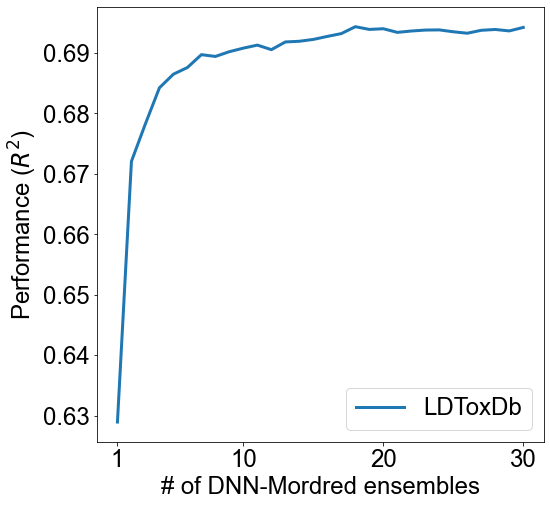

In [6]:
from glob import glob
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

results_files = glob('../data/deep-ensemble/calibration/*_predictions.csv')

# Stores results of **ALL** ensemble predictions
running_results = pd.DataFrame()

# Stores R2 metric vs # of models
ensemble_results = pd.DataFrame(columns=('n_models','r2'))

for n_models, file in enumerate(results_files):
    result = pd.read_csv(file)
    
    running_results = running_results.append(result[['smiles', 'actual_neglogld50', 'prediction_neglogld50']])
    ensemble_outcome = running_results.pivot_table(index=['smiles'])
    
    actual = ensemble_outcome['actual_neglogld50']
    pred = ensemble_outcome['prediction_neglogld50']
    
    ensemble_results = ensemble_results.append({
        'n_models': n_models+1,
        'r2': r2_score(actual, pred)
    }, ignore_index=True)
    
plt.rc('font', weight='normal', size=24, family='Arial')

fig, ax = plt.subplots(figsize=(8,8), dpi=72, facecolor='white')

ax.plot(ensemble_results['n_models'], ensemble_results['r2'], linewidth=3, label='LDToxDb')
ax.set_xlabel('# of DNN-Mordred ensembles')
ax.set_ylabel('Performance ($R^2$)')
ax.set_xticks([1,10,20,30])
ax.legend()

We resolve at $N=10$

## Application to Transfer-DNN-Mordred

Now create 10 DNN-Mordred models for each fold and transfer-learn each model as done in the transfer learning step of the workflow (see <a href="transfer-learning.ipynb">transfer learning notebook</a>). This will be done in two steps and two separate code blocks for organization and convenience. First, train each DNN-Mordred model and save the checkpoint. Then load, each checkpoint and apply the transfer step.

In [15]:
# Train all DNN-Mordred base models to create checkpoints

for ensemble_no in range(10):
    for fold_no, (train, test) in enumerate(kfold.get_folds('mordred')):
        x_train, y_train, smiles_train = train
        x_test, y_test, smiles_test = test

        y_train = experimental_setup.scaler.fit_transform(y_train)

        model = mordred()
        model.seed += ensemble_no #increment the seed so each ensemble is a new optimization
        model.fit(x_train.astype(np.float32), y_train)
    
        #save model
        fn = 'dnn_mordred' + str(fold_no) + '_' + sampling_type + '_ensemble' + str(ensemble_no)
        model.save_weights('../data/deep-ensemble/base-models/%s.chkpt' % fn)

Train on 10663 samples
Epoch 1/1000
10663/10663 [==============================] - 2s 178us/sample - loss: 2.9582 - mse: 2.9582 - mae: 1.0083
Epoch 2/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.6236 - mse: 0.6236 - mae: 0.5864
Epoch 3/1000
10663/10663 [==============================] - 1s 53us/sample - loss: 0.5441 - mse: 0.5441 - mae: 0.5465
Epoch 4/1000
10663/10663 [==============================] - 1s 53us/sample - loss: 0.5012 - mse: 0.5012 - mae: 0.5228
Epoch 5/1000
10663/10663 [==============================] - 1s 53us/sample - loss: 0.4404 - mse: 0.4404 - mae: 0.4918
Epoch 6/1000
10663/10663 [==============================] - 1s 56us/sample - loss: 0.3898 - mse: 0.3898 - mae: 0.4647
Epoch 7/1000
10663/10663 [==============================] - 1s 53us/sample - loss: 0.3582 - mse: 0.3582 - mae: 0.4461
Epoch 8/1000
10663/10663 [==============================] - 1s 52us/sample - loss: 0.3399 - mse: 0.3399 - mae: 0.4329
Epoch 9/1000
10663/10663 [======

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0505 - mse: 0.0505 - mae: 0.1646
Epoch 136/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0548 - mse: 0.0548 - mae: 0.1654
Epoch 137/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0607 - mse: 0.0607 - mae: 0.1734
Epoch 138/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0624 - mse: 0.0624 - mae: 0.1799
Epoch 139/1000
10663/10663 [==============================] - 1s 63us/sample - loss: 0.0564 - mse: 0.0564 - mae: 0.17390s - loss: 0.0597 - mse: 0.0597 - mae
Epoch 140/1000
10663/10663 [==============================] - 1s 55us/sample - loss: 0.0514 - mse: 0.0514 - mae: 0.1651
Epoch 141/1000
10663/10663 [==============================] - 1s 57us/sample - loss: 0.0457 - mse: 0.0457 - mae: 0.1562
Epoch 142/1000
10663/10663 [==============================] - 1s 67us/sample - loss: 0.0516 - mse: 0.0516 - mae: 0.16580s - loss: 0.0427 -

10663/10663 [==============================] - 1s 56us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1183
Epoch 269/1000
10663/10663 [==============================] - 1s 57us/sample - loss: 0.0273 - mse: 0.0273 - mae: 0.1181
Epoch 270/1000
10663/10663 [==============================] - 1s 56us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1157
Epoch 271/1000
10663/10663 [==============================] - 1s 57us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1190
Epoch 272/1000
10663/10663 [==============================] - 1s 56us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1236
Epoch 273/1000
10663/10663 [==============================] - 1s 58us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1186
Epoch 274/1000
10663/10663 [==============================] - 1s 57us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1145
Epoch 275/1000
10663/10663 [==============================] - 1s 55us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1251
Epoch 276/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 56us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1040
Epoch 402/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1078
Epoch 403/1000
10663/10663 [==============================] - 1s 59us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0989
Epoch 404/1000
10663/10663 [==============================] - 1s 55us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1106
Epoch 405/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1207
Epoch 406/1000
10663/10663 [==============================] - 1s 57us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1127
Epoch 407/1000
10663/10663 [==============================] - 1s 51us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1012
Epoch 408/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1048
Epoch 409/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 54us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1092
Epoch 470/1000
10663/10663 [==============================] - 1s 52us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1047
Epoch 471/1000
10663/10663 [==============================] - 1s 52us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1060
Epoch 472/1000
10663/10663 [==============================] - 1s 52us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0936
Epoch 473/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0969
Epoch 474/1000
10663/10663 [==============================] - 1s 52us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1012
Epoch 475/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1066
Epoch 476/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0959
Epoch 477/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 49us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0995
Epoch 605/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1036
Epoch 606/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0930
Epoch 607/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0859
Epoch 608/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1035
Epoch 609/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1036
Epoch 610/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0954
Epoch 611/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0984
Epoch 612/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0868
Epoch 740/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0830
Epoch 741/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0975
Epoch 742/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1028
Epoch 743/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0911
Epoch 744/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1066
Epoch 745/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1074
Epoch 746/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0913
Epoch 747/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0951
Epoch 808/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0786
Epoch 809/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0872
Epoch 810/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0853
Epoch 811/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0807
Epoch 812/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0954
Epoch 813/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0876
Epoch 814/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0887
Epoch 815/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 51us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0822
Epoch 942/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0784
Epoch 943/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0834
Epoch 944/1000
10663/10663 [==============================] - 1s 52us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0886
Epoch 945/1000
10663/10663 [==============================] - 1s 51us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0872
Epoch 946/1000
10663/10663 [==============================] - 1s 52us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0851
Epoch 947/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0790
Epoch 948/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0757
Epoch 949/1000
10663/10663 [===========================

Epoch 76/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0621 - mse: 0.0621 - mae: 0.1829
Epoch 77/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0662 - mse: 0.0662 - mae: 0.1895
Epoch 78/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0632 - mse: 0.0632 - mae: 0.1868
Epoch 79/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0581 - mse: 0.0581 - mae: 0.1767
Epoch 80/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0635 - mse: 0.0635 - mae: 0.1859
Epoch 81/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0613 - mse: 0.0613 - mae: 0.1845
Epoch 82/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0621 - mse: 0.0621 - mae: 0.1873
Epoch 83/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0595 - mse: 0.0595 - mae: 0.1812
Epoch 84/1000
10663/10663 [=====================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0384 - mse: 0.0384 - mae: 0.1412
Epoch 211/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0389 - mse: 0.0389 - mae: 0.1429
Epoch 212/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0350 - mse: 0.0350 - mae: 0.1383
Epoch 213/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1295
Epoch 214/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0301 - mse: 0.0301 - mae: 0.1254
Epoch 215/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1288
Epoch 216/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1351
Epoch 217/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0341 - mse: 0.0341 - mae: 0.1362
Epoch 218/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1205
Epoch 346/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0315 - mse: 0.0315 - mae: 0.1252
Epoch 347/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1156
Epoch 348/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1120
Epoch 349/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1063
Epoch 350/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1138
Epoch 351/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1171
Epoch 352/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0269 - mse: 0.0269 - mae: 0.1145
Epoch 353/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1132
Epoch 480/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1092
Epoch 481/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0963
Epoch 482/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1010
Epoch 483/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0907
Epoch 484/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0950
Epoch 485/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0936
Epoch 486/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1039
Epoch 487/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0951
Epoch 615/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.09170s - loss: 0.0161 - mse: 0.0161 - mae: 0.0
Epoch 616/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0977
Epoch 617/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0943
Epoch 618/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.1011
Epoch 619/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0926
Epoch 620/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0965
Epoch 621/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.1011
Epoch 622/100

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0891
Epoch 750/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0875
Epoch 751/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0884
Epoch 752/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0900
Epoch 753/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0877
Epoch 754/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0923
Epoch 755/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0893
Epoch 756/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0935
Epoch 757/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0958
Epoch 818/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0869
Epoch 819/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0812
Epoch 820/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0769
Epoch 821/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0897
Epoch 822/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0891
Epoch 823/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0933
Epoch 824/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0828
Epoch 825/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0837
Epoch 886/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0765
Epoch 887/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0858
Epoch 888/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.09330s - loss: 0.0167 - mse: 0.0167 - mae: 0.09
Epoch 889/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0810
Epoch 890/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0909
Epoch 891/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0857
Epoch 892/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0874
Epoch 893/10

10663/10663 [==============================] - 0s 40us/sample - loss: 0.1651 - mse: 0.1651 - mae: 0.3082
Epoch 21/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.1637 - mse: 0.1637 - mae: 0.30780s - loss: 0.1638 - mse: 0.1638 - mae: 0.308
Epoch 22/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.1576 - mse: 0.1576 - mae: 0.2990
Epoch 23/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.1563 - mse: 0.1563 - mae: 0.2977
Epoch 24/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.1463 - mse: 0.1463 - mae: 0.2885
Epoch 25/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.1436 - mse: 0.1436 - mae: 0.2849
Epoch 26/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.1437 - mse: 0.1437 - mae: 0.2868
Epoch 27/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1278 - mse: 0.1278 - mae: 0.2700
Epoch 28/1000
1066

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0354 - mse: 0.0354 - mae: 0.1363
Epoch 155/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0367 - mse: 0.0367 - mae: 0.1429
Epoch 156/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0351 - mse: 0.0351 - mae: 0.1385
Epoch 157/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0406 - mse: 0.0406 - mae: 0.1503
Epoch 158/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0405 - mse: 0.0405 - mae: 0.1492
Epoch 159/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0365 - mse: 0.0365 - mae: 0.1421
Epoch 160/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0368 - mse: 0.0368 - mae: 0.1433
Epoch 161/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0383 - mse: 0.0383 - mae: 0.1491
Epoch 162/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1228
Epoch 289/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0297 - mse: 0.0297 - mae: 0.1212
Epoch 290/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0358 - mse: 0.0358 - mae: 0.1389
Epoch 291/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0350 - mse: 0.0350 - mae: 0.1350
Epoch 292/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1300
Epoch 293/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1185
Epoch 294/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1259
Epoch 295/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1264
Epoch 296/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1037
Epoch 422/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0932
Epoch 423/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0989
Epoch 424/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0944
Epoch 425/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1061
Epoch 426/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0884
Epoch 427/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.1054
Epoch 428/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0958
Epoch 429/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0959
Epoch 556/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0852
Epoch 557/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0924
Epoch 558/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0855
Epoch 559/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0957
Epoch 560/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0869
Epoch 561/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0901
Epoch 562/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0901
Epoch 563/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0754
Epoch 692/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0827
Epoch 693/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0903
Epoch 694/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0830
Epoch 695/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0817
Epoch 696/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0813
Epoch 697/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0831
Epoch 698/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0860
Epoch 699/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0822
Epoch 826/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0787
Epoch 827/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0811
Epoch 828/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0834
Epoch 829/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0827
Epoch 830/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0109 - mse: 0.0109 - mae: 0.0786
Epoch 831/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0107 - mse: 0.0107 - mae: 0.0742
Epoch 832/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0136 - mse: 0.0136 - mae: 0.086 - 0s 39us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0844
Epo

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0782
Epoch 960/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0097 - mse: 0.0097 - mae: 0.0718
Epoch 961/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0793
Epoch 962/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0799
Epoch 963/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0790
Epoch 964/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0102 - mse: 0.0102 - mae: 0.0739
Epoch 965/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0870
Epoch 966/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0830
Epoch 967/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0585 - mse: 0.0585 - mae: 0.1747
Epoch 95/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0538 - mse: 0.0538 - mae: 0.1685
Epoch 96/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0572 - mse: 0.0572 - mae: 0.1766
Epoch 97/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0573 - mse: 0.0573 - mae: 0.1763
Epoch 98/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0532 - mse: 0.0532 - mae: 0.1708
Epoch 99/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0502 - mse: 0.0502 - mae: 0.1669
Epoch 100/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0481 - mse: 0.0481 - mae: 0.1611
Epoch 101/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0509 - mse: 0.0509 - mae: 0.1637
Epoch 102/1000
10663/10663 [==============================] 

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0314 - mse: 0.0314 - mae: 0.1260
Epoch 230/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1312
Epoch 231/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.12890s - loss: 0.0274 - mse: 0.0274 - mae:
Epoch 232/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0322 - mse: 0.0322 - mae: 0.1314
Epoch 233/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1296
Epoch 234/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0316 - mse: 0.0316 - mae: 0.13130s - loss: 0.0351 - mse: 0.0351 - mae: 0
Epoch 235/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0269 - mse: 0.0269 - mae: 0.1182
Epoch 236/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0246 - mse

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1137
Epoch 364/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1126
Epoch 365/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1038
Epoch 366/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1003
Epoch 367/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0972
Epoch 368/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1075
Epoch 369/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0981
Epoch 370/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1078
Epoch 371/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1053
Epoch 432/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0926
Epoch 433/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1003
Epoch 434/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0954
Epoch 435/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.10530s - loss: 0.0236 - mse: 0.0236 - mae:
Epoch 436/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0999
Epoch 437/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0967
Epoch 438/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0957
Epoch 439/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1023
Epoch 567/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0954
Epoch 568/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0984
Epoch 569/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1032
Epoch 570/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0954
Epoch 571/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0841
Epoch 572/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0919
Epoch 573/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0870
Epoch 574/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1029
Epoch 703/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0943
Epoch 704/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0878
Epoch 705/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0892
Epoch 706/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0849
Epoch 707/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0857
Epoch 708/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0921
Epoch 709/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0797
Epoch 710/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0882
Epoch 771/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0869
Epoch 772/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0940
Epoch 773/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0887
Epoch 774/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0873
Epoch 775/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0847
Epoch 776/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0941
Epoch 777/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0804
Epoch 778/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0786
Epoch 839/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0823
Epoch 840/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0814
Epoch 841/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0866
Epoch 842/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0853
Epoch 843/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0835
Epoch 844/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0839
Epoch 845/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0805
Epoch 846/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0834
Epoch 907/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0822
Epoch 908/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0845
Epoch 909/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0793
Epoch 910/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0849
Epoch 911/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0923
Epoch 912/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0897
Epoch 913/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0943
Epoch 914/1000
10663/10663 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.1019 - mse: 0.1019 - mae: 0.2401
Epoch 41/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.1020 - mse: 0.1020 - mae: 0.2407
Epoch 42/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0974 - mse: 0.0974 - mae: 0.2330
Epoch 43/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0951 - mse: 0.0951 - mae: 0.2319
Epoch 44/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0968 - mse: 0.0968 - mae: 0.2323
Epoch 45/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0946 - mse: 0.0946 - mae: 0.2296
Epoch 46/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0944 - mse: 0.0944 - mae: 0.2315
Epoch 47/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0904 - mse: 0.0904 - mae: 0.2247
Epoch 48/1000
10664/10664 [==============================] - 0

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0439 - mse: 0.0439 - mae: 0.1533
Epoch 177/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0464 - mse: 0.0464 - mae: 0.1570
Epoch 178/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0488 - mse: 0.0488 - mae: 0.1634
Epoch 179/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0437 - mse: 0.0437 - mae: 0.1506
Epoch 180/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0449 - mse: 0.0449 - mae: 0.1532
Epoch 181/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0395 - mse: 0.0395 - mae: 0.1434
Epoch 182/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0408 - mse: 0.0408 - mae: 0.1487
Epoch 183/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0369 - mse: 0.0369 - mae: 0.1389
Epoch 184/1000
10664/10664 [===========================

Epoch 310/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1179
Epoch 311/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1118
Epoch 312/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0276 - mse: 0.0276 - mae: 0.1220
Epoch 313/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1111
Epoch 314/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1150
Epoch 315/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1118
Epoch 316/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1104
Epoch 317/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1163
Epoch 318/1000
10664/10664 [============

10664/10664 [==============================] - 0s 39us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1046
Epoch 447/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0952
Epoch 448/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1010
Epoch 449/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0972
Epoch 450/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1126
Epoch 451/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1013
Epoch 452/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0963
Epoch 453/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0969
Epoch 454/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 39us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0950
Epoch 582/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1087
Epoch 583/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0960
Epoch 584/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1026
Epoch 585/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0961
Epoch 586/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1012
Epoch 587/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0969
Epoch 588/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0930
Epoch 589/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 39us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0912
Epoch 717/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1110
Epoch 718/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1024
Epoch 719/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1005
Epoch 720/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0940
Epoch 721/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0984
Epoch 722/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0893
Epoch 723/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0857
Epoch 724/1000
10664/10664 [===========================

Epoch 784/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0864
Epoch 785/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0884
Epoch 786/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0920
Epoch 787/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0856
Epoch 788/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0894
Epoch 789/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0942
Epoch 790/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1028
Epoch 791/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0822
Epoch 792/1000
10664/10664 [============

10664/10664 [==============================] - 0s 39us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.10610s - loss: 0.0196 - mse: 0.0196 - mae: 0
Epoch 919/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0852
Epoch 920/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0841
Epoch 921/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0797
Epoch 922/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0753
Epoch 923/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0913
Epoch 924/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0929
Epoch 925/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0823
Epoch 926/1000


10664/10664 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0847
Epoch 987/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0862
Epoch 988/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.08430s - loss: 0.0146 - mse: 0.0146 - mae: 0
Epoch 989/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0883
Epoch 990/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0823
Epoch 991/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0805
Epoch 992/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0909
Epoch 993/1000
10664/10664 [==============================] - 0s 39us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0875
Epoch 994/1000


10663/10663 [==============================] - 0s 41us/sample - loss: 0.0860 - mse: 0.0860 - mae: 0.2197
Epoch 55/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0797 - mse: 0.0797 - mae: 0.2108
Epoch 56/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0806 - mse: 0.0806 - mae: 0.21010s - loss: 0.0714 - mse: 0.0714 - mae:
Epoch 57/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0856 - mse: 0.0856 - mae: 0.2154
Epoch 58/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0789 - mse: 0.0789 - mae: 0.2078
Epoch 59/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0794 - mse: 0.0794 - mae: 0.2087
Epoch 60/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0720 - mse: 0.0720 - mae: 0.1989
Epoch 61/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0700 - mse: 0.0700 - mae: 0.1960
Epoch 62/1000
10663/1066

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0362 - mse: 0.0362 - mae: 0.1379
Epoch 190/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0423 - mse: 0.0423 - mae: 0.1521
Epoch 191/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0435 - mse: 0.0435 - mae: 0.1499
Epoch 192/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0352 - mse: 0.0352 - mae: 0.1354
Epoch 193/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0404 - mse: 0.0404 - mae: 0.1421
Epoch 194/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0419 - mse: 0.0419 - mae: 0.1473
Epoch 195/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0407 - mse: 0.0407 - mae: 0.1452
Epoch 196/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0495 - mse: 0.0495 - mae: 0.1554
Epoch 197/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0332 - mse: 0.0332 - mae: 0.1310
Epoch 324/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1235
Epoch 325/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1173
Epoch 326/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1133
Epoch 327/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1090
Epoch 328/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1086
Epoch 329/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1133
Epoch 330/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1055
Epoch 331/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1003
Epoch 459/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0959
Epoch 460/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1064
Epoch 461/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1058
Epoch 462/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1010
Epoch 463/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1054
Epoch 464/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1119
Epoch 465/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0975
Epoch 466/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0913
Epoch 527/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0968
Epoch 528/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0894
Epoch 529/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0973
Epoch 530/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0905
Epoch 531/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0856
Epoch 532/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0982
Epoch 533/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0934
Epoch 534/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0919
Epoch 663/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1032
Epoch 664/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1075
Epoch 665/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0890
Epoch 666/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0886
Epoch 667/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0863
Epoch 668/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0812
Epoch 669/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0880
Epoch 670/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0883
Epoch 798/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0861
Epoch 799/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0826
Epoch 800/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0987
Epoch 801/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0842
Epoch 802/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0845
Epoch 803/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0755
Epoch 804/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0845
Epoch 805/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0811
Epoch 932/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0785
Epoch 933/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0111 - mse: 0.0111 - mae: 0.0742
Epoch 934/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0728
Epoch 935/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0783
Epoch 936/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0744
Epoch 937/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0789
Epoch 938/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0887
Epoch 939/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0780
Epoch 1000/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0827
Train on 10663 samples
Epoch 1/1000
10663/10663 [==============================] - 2s 162us/sample - loss: 3.4899 - mse: 3.4899 - mae: 1.0430
Epoch 2/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.6348 - mse: 0.6348 - mae: 0.5942
Epoch 3/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.5671 - mse: 0.5671 - mae: 0.5636
Epoch 4/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.5125 - mse: 0.5125 - mae: 0.5302
Epoch 5/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.4673 - mse: 0.4673 - mae: 0.5078
Epoch 6/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.4164 - mse: 0.4164 - mae: 0.4842
Epoch 7/1000
10663/10663 [================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0450 - mse: 0.0450 - mae: 0.1583
Epoch 136/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0430 - mse: 0.0430 - mae: 0.1533
Epoch 137/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0440 - mse: 0.0440 - mae: 0.1550
Epoch 138/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0377 - mse: 0.0377 - mae: 0.1437
Epoch 139/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0413 - mse: 0.0413 - mae: 0.1503
Epoch 140/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0437 - mse: 0.0437 - mae: 0.1550
Epoch 141/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0414 - mse: 0.0414 - mae: 0.1498
Epoch 142/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0425 - mse: 0.0425 - mae: 0.1522
Epoch 143/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1210
Epoch 272/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0285 - mse: 0.0285 - mae: 0.1196
Epoch 273/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1193
Epoch 274/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0296 - mse: 0.0296 - mae: 0.1235
Epoch 275/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0308 - mse: 0.0308 - mae: 0.1244
Epoch 276/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1272
Epoch 277/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0302 - mse: 0.0302 - mae: 0.1249
Epoch 278/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0366 - mse: 0.0366 - mae: 0.1392
Epoch 279/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1105
Epoch 340/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1202
Epoch 341/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0270 - mse: 0.0270 - mae: 0.1187
Epoch 342/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1114
Epoch 343/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1135
Epoch 344/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1187
Epoch 345/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1020
Epoch 346/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1041
Epoch 347/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1089
Epoch 408/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1046
Epoch 409/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1048
Epoch 410/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1107
Epoch 411/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1024
Epoch 412/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1072
Epoch 413/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1110
Epoch 414/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1064
Epoch 415/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0985
Epoch 543/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0996
Epoch 544/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0880
Epoch 545/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0955
Epoch 546/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.09420s - loss: 0.0131 - mse: 0.0131 - mae: 
Epoch 547/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0883
Epoch 548/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1024
Epoch 549/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0973
Epoch 550/1000
1

Epoch 677/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0897
Epoch 678/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0856
Epoch 679/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0846
Epoch 680/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0919
Epoch 681/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0849
Epoch 682/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0877
Epoch 683/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0904
Epoch 684/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0922
Epoch 685/1000
10663/10663 [============

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0852
Epoch 813/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0811
Epoch 814/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0870
Epoch 815/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0867
Epoch 816/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0856
Epoch 817/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0854
Epoch 818/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0906
Epoch 819/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0960
Epoch 820/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0876
Epoch 881/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0825
Epoch 882/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0788
Epoch 883/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0793
Epoch 884/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0824
Epoch 885/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0860
Epoch 886/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0851
Epoch 887/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0859
Epoch 888/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.2301 - mse: 0.2301 - mae: 0.3596
Epoch 17/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.2317 - mse: 0.2317 - mae: 0.3649
Epoch 18/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.2161 - mse: 0.2161 - mae: 0.3483
Epoch 19/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.2098 - mse: 0.2098 - mae: 0.3444
Epoch 20/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.2003 - mse: 0.2003 - mae: 0.3362
Epoch 21/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1817 - mse: 0.1817 - mae: 0.3227
Epoch 22/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1787 - mse: 0.1787 - mae: 0.3192
Epoch 23/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1903 - mse: 0.1903 - mae: 0.3297
Epoch 24/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0396 - mse: 0.0396 - mae: 0.1482
Epoch 152/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1510
Epoch 153/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0445 - mse: 0.0445 - mae: 0.1543
Epoch 154/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0423 - mse: 0.0423 - mae: 0.1518
Epoch 155/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0402 - mse: 0.0402 - mae: 0.1512
Epoch 156/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0378 - mse: 0.0378 - mae: 0.1445
Epoch 157/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0432 - mse: 0.0432 - mae: 0.1547
Epoch 158/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0369 - mse: 0.0369 - mae: 0.1421
Epoch 159/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1276
Epoch 220/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1263
Epoch 221/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0490 - mse: 0.0490 - mae: 0.1569
Epoch 222/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0569 - mse: 0.0569 - mae: 0.1699
Epoch 223/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0576 - mse: 0.0576 - mae: 0.1721
Epoch 224/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0591 - mse: 0.0591 - mae: 0.1730
Epoch 225/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0575 - mse: 0.0575 - mae: 0.1719
Epoch 226/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0534 - mse: 0.0534 - mae: 0.1695
Epoch 227/1000
10663/10663 [===========================

Epoch 287/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1332
Epoch 288/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1249
Epoch 289/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1213
Epoch 290/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0273 - mse: 0.0273 - mae: 0.1222
Epoch 291/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1286
Epoch 292/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0280 - mse: 0.0280 - mae: 0.1261
Epoch 293/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0355 - mse: 0.0355 - mae: 0.1342
Epoch 294/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0319 - mse: 0.0319 - mae: 0.1303
Epoch 295/1000
10663/10663 [============

Epoch 355/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1084
Epoch 356/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1058
Epoch 357/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1051
Epoch 358/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1244
Epoch 359/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1187
Epoch 360/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1071
Epoch 361/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1240
Epoch 362/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0233 - mse: 0.0233 - mae: 0.1136
Epoch 363/1000
10663/10663 [============

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.09170s - loss: 0.0152 - mse: 0.0152 - mae: 0.0
Epoch 492/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0949
Epoch 493/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.1018
Epoch 494/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1117
Epoch 495/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.1034
Epoch 496/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1043
Epoch 497/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0965
Epoch 498/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0969
Epoch 499/100

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0928
Epoch 560/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0916
Epoch 561/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0971
Epoch 562/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0887
Epoch 563/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0899
Epoch 564/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0986
Epoch 565/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0934
Epoch 566/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1057
Epoch 567/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0855
Epoch 628/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0908
Epoch 629/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0915
Epoch 630/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0914
Epoch 631/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0964
Epoch 632/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0921
Epoch 633/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0947
Epoch 634/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0824
Epoch 635/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0873
Epoch 696/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0876
Epoch 697/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0902
Epoch 698/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0905
Epoch 699/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0893
Epoch 700/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.1000
Epoch 701/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0943
Epoch 702/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0902
Epoch 703/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0926
Epoch 762/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0866
Epoch 763/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0804
Epoch 764/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0903
Epoch 765/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0868
Epoch 766/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0854
Epoch 767/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0833
Epoch 768/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.08620s - loss: 0.0137 - mse: 0.0137 - mae: 0.086
Epoch 769/1

10663/10663 [==============================] - 0s 39us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0820
Epoch 830/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0825
Epoch 831/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0831
Epoch 832/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0896
Epoch 833/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0879
Epoch 834/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0791
Epoch 835/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0099 - mse: 0.0099 - mae: 0.0722
Epoch 836/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0780
Epoch 837/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0877
Epoch 898/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0947
Epoch 899/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0908
Epoch 900/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0831
Epoch 901/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0101 - mse: 0.0101 - mae: 0.0738
Epoch 902/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0103 - mse: 0.0103 - mae: 0.0751
Epoch 903/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0786
Epoch 904/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0107 - mse: 0.0107 - mae: 0.0760
Epoch 905/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.1332 - mse: 0.1332 - mae: 0.2725
Epoch 33/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1276 - mse: 0.1276 - mae: 0.2677
Epoch 34/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1336 - mse: 0.1336 - mae: 0.2738
Epoch 35/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1209 - mse: 0.1209 - mae: 0.2592
Epoch 36/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1169 - mse: 0.1169 - mae: 0.2567
Epoch 37/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1155 - mse: 0.1155 - mae: 0.2552
Epoch 38/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1110 - mse: 0.1110 - mae: 0.2493
Epoch 39/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1064 - mse: 0.1064 - mae: 0.2425
Epoch 40/1000
10663/10663 [==============================] - 0

Epoch 101/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0542 - mse: 0.0542 - mae: 0.1715
Epoch 102/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0516 - mse: 0.0516 - mae: 0.1667
Epoch 103/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0523 - mse: 0.0523 - mae: 0.1684
Epoch 104/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0551 - mse: 0.0551 - mae: 0.1737
Epoch 105/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0594 - mse: 0.0594 - mae: 0.1772
Epoch 106/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0574 - mse: 0.0574 - mae: 0.1765
Epoch 107/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0555 - mse: 0.0555 - mae: 0.1714
Epoch 108/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0574 - mse: 0.0574 - mae: 0.1772
Epoch 109/1000
10663/10663 [============

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0447 - mse: 0.0447 - mae: 0.1533
Epoch 238/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0390 - mse: 0.0390 - mae: 0.1445
Epoch 239/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0448 - mse: 0.0448 - mae: 0.1507
Epoch 240/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0445 - mse: 0.0445 - mae: 0.1508
Epoch 241/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0398 - mse: 0.0398 - mae: 0.1399
Epoch 242/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1297
Epoch 243/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.12270s - loss: 0.0291 - mse: 0.0291 - mae: 
Epoch 244/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0292 - mse: 0.0292 - mae: 0.1246
Epoch 245/1000
1

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0330 - mse: 0.0330 - mae: 0.1307
Epoch 306/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1190
Epoch 307/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1277
Epoch 308/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0333 - mse: 0.0333 - mae: 0.1306
Epoch 309/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0324 - mse: 0.0324 - mae: 0.1278
Epoch 310/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1277
Epoch 311/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0297 - mse: 0.0297 - mae: 0.1229
Epoch 312/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1318
Epoch 313/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0269 - mse: 0.0269 - mae: 0.1197
Epoch 374/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1089
Epoch 375/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1226
Epoch 376/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1182
Epoch 377/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1085
Epoch 378/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1202
Epoch 379/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0313 - mse: 0.0313 - mae: 0.1277
Epoch 380/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0270 - mse: 0.0270 - mae: 0.1140
Epoch 381/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.0946
Epoch 510/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1049
Epoch 511/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1079
Epoch 512/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1083
Epoch 513/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1027
Epoch 514/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0995
Epoch 515/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1116
Epoch 516/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1086
Epoch 517/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0883
Epoch 645/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0909
Epoch 646/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.1033
Epoch 647/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0971
Epoch 648/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0838
Epoch 649/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0809
Epoch 650/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0845
Epoch 651/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0874
Epoch 652/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0801
Epoch 781/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0882
Epoch 782/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0751
Epoch 783/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0818
Epoch 784/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0948
Epoch 785/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0997
Epoch 786/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1079
Epoch 787/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0974
Epoch 788/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0852
Epoch 916/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0857
Epoch 917/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0895
Epoch 918/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0777
Epoch 919/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0853
Epoch 920/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0910
Epoch 921/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0808
Epoch 922/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0822
Epoch 923/1000
10663/10663 [===========================

10664/10664 [==============================] - 0s 43us/sample - loss: 0.0818 - mse: 0.0818 - mae: 0.2148
Epoch 52/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0783 - mse: 0.0783 - mae: 0.2065
Epoch 53/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0775 - mse: 0.0775 - mae: 0.2084
Epoch 54/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0766 - mse: 0.0766 - mae: 0.2090
Epoch 55/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0729 - mse: 0.0729 - mae: 0.2024
Epoch 56/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0689 - mse: 0.0689 - mae: 0.1959
Epoch 57/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0773 - mse: 0.0773 - mae: 0.2097
Epoch 58/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0706 - mse: 0.0706 - mae: 0.1992
Epoch 59/1000
10664/10664 [==============================] - 0

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0378 - mse: 0.0378 - mae: 0.1399
Epoch 187/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0340 - mse: 0.0340 - mae: 0.1328
Epoch 188/1000
10664/10664 [==============================] - 0s 45us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1484
Epoch 189/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0431 - mse: 0.0431 - mae: 0.1494
Epoch 190/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0396 - mse: 0.0396 - mae: 0.1452
Epoch 191/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0437 - mse: 0.0437 - mae: 0.1547
Epoch 192/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0388 - mse: 0.0388 - mae: 0.1382
Epoch 193/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1371
Epoch 194/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1048
Epoch 322/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1039
Epoch 323/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0255 - mse: 0.0255 - mae: 0.1158
Epoch 324/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1084
Epoch 325/1000
10664/10664 [==============================] - 0s 45us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1164
Epoch 326/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1169
Epoch 327/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1113
Epoch 328/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1001
Epoch 329/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1038
Epoch 457/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.10650s - loss: 0.0233 - mse: 0.0233 - mae:
Epoch 458/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0940
Epoch 459/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0993
Epoch 460/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0984
Epoch 461/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0968
Epoch 462/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0970
Epoch 463/1000
10664/10664 [==============================] - 0s 44us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1065
Epoch 464/1000
10

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1060
Epoch 524/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0997
Epoch 525/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0931
Epoch 526/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0941
Epoch 527/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0942
Epoch 528/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0923
Epoch 529/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0953
Epoch 530/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1032
Epoch 531/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1008
Epoch 592/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.0995
Epoch 593/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0990
Epoch 594/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0972
Epoch 595/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0912
Epoch 596/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0948
Epoch 597/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0969
Epoch 598/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0955
Epoch 599/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0952
Epoch 727/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.09110s - loss: 0.0166 - mse: 0.0166 - mae: 
Epoch 728/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0955
Epoch 729/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0909
Epoch 730/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0866
Epoch 731/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1015
Epoch 732/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0890
Epoch 733/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0960
Epoch 734/1000
1

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.07900s - loss: 0.0141 - mse: 0.0141 - mae: 
Epoch 861/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0934
Epoch 862/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0855
Epoch 863/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0938
Epoch 864/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0891
Epoch 865/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0835
Epoch 866/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0822
Epoch 867/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0861
Epoch 868/1000
1

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0816
Epoch 929/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0830
Epoch 930/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0892
Epoch 931/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0834
Epoch 932/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0853
Epoch 933/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0876
Epoch 934/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0776
Epoch 935/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0870
Epoch 936/1000
10664/10664 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0768 - mse: 0.0768 - mae: 0.2016
Epoch 65/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0778 - mse: 0.0778 - mae: 0.2072
Epoch 66/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0686 - mse: 0.0686 - mae: 0.1935
Epoch 67/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0745 - mse: 0.0745 - mae: 0.2009
Epoch 68/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0693 - mse: 0.0693 - mae: 0.1931
Epoch 69/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0641 - mse: 0.0641 - mae: 0.1884
Epoch 70/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0688 - mse: 0.0688 - mae: 0.1940
Epoch 71/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0680 - mse: 0.0680 - mae: 0.1918
Epoch 72/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1283
Epoch 201/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.12430s - loss: 0.0295 - mse: 0.0295 - mae: 
Epoch 202/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1299
Epoch 203/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0323 - mse: 0.0323 - mae: 0.1295
Epoch 204/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0412 - mse: 0.0412 - mae: 0.1405
Epoch 205/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0404 - mse: 0.0404 - mae: 0.1434
Epoch 206/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0385 - mse: 0.0385 - mae: 0.1397
Epoch 207/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0484 - mse: 0.0484 - mae: 0.1597
Epoch 208/1000
1

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0367 - mse: 0.0367 - mae: 0.1336
Epoch 335/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1220
Epoch 336/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1154
Epoch 337/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1103
Epoch 338/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1078
Epoch 339/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1087
Epoch 340/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1156
Epoch 341/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1100
Epoch 342/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0979
Epoch 403/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1049
Epoch 404/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.0995
Epoch 405/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1065
Epoch 406/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.0999
Epoch 407/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1023
Epoch 408/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1089
Epoch 409/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1135
Epoch 410/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0975
Epoch 539/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0900
Epoch 540/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1031
Epoch 541/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0966
Epoch 542/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0949
Epoch 543/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0959
Epoch 544/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0907
Epoch 545/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0960
Epoch 546/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1163
Epoch 607/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1082
Epoch 608/1000
10663/10663 [==============================] - 0s 39us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0960
Epoch 609/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.0960
Epoch 610/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0938
Epoch 611/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.0981
Epoch 612/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.09100s - loss: 0.0141 - mse: 0.0141 - mae: 0.
Epoch 613/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0914
Epoch 614/1000

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0958
Epoch 742/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0924
Epoch 743/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0863
Epoch 744/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0818
Epoch 745/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0837
Epoch 746/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0921
Epoch 747/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0900
Epoch 748/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.0995
Epoch 749/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0924
Epoch 810/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0854
Epoch 811/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0819
Epoch 812/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0775
Epoch 813/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0825
Epoch 814/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0903
Epoch 815/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0862
Epoch 816/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0855
Epoch 817/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0895
Epoch 878/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0822
Epoch 879/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0912
Epoch 880/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0853
Epoch 881/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0876
Epoch 882/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.07790s - loss: 0.0122 - mse: 0.0122 - mae: 0.07
Epoch 883/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0801
Epoch 884/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0795
Epoch 885/10

10663/10663 [==============================] - 0s 40us/sample - loss: 0.2768 - mse: 0.2768 - mae: 0.3945
Epoch 13/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.2764 - mse: 0.2764 - mae: 0.3945
Epoch 14/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2697 - mse: 0.2697 - mae: 0.3898
Epoch 15/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2391 - mse: 0.2391 - mae: 0.3681
Epoch 16/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2339 - mse: 0.2339 - mae: 0.3638
Epoch 17/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2247 - mse: 0.2247 - mae: 0.3533
Epoch 18/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2073 - mse: 0.2073 - mae: 0.3421
Epoch 19/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1998 - mse: 0.1998 - mae: 0.3372
Epoch 20/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0432 - mse: 0.0432 - mae: 0.1494
Epoch 149/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0452 - mse: 0.0452 - mae: 0.1504
Epoch 150/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0419 - mse: 0.0419 - mae: 0.1478
Epoch 151/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1499
Epoch 152/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0426 - mse: 0.0426 - mae: 0.1495
Epoch 153/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0399 - mse: 0.0399 - mae: 0.1427
Epoch 154/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0375 - mse: 0.0375 - mae: 0.1394
Epoch 155/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0420 - mse: 0.0420 - mae: 0.1484
Epoch 156/1000
10663/10663 [===========================

Epoch 284/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1105
Epoch 285/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1067
Epoch 286/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1174
Epoch 287/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1173
Epoch 288/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1159
Epoch 289/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1117
Epoch 290/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1116
Epoch 291/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1114
Epoch 292/1000
10663/10663 [============

Epoch 352/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1051
Epoch 353/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1046
Epoch 354/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1070
Epoch 355/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1087
Epoch 356/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1083
Epoch 357/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1088
Epoch 358/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1186
Epoch 359/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1065
Epoch 360/1000
10663/10663 [============

Epoch 420/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1037
Epoch 421/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0954
Epoch 422/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.0979
Epoch 423/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1034
Epoch 424/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0997
Epoch 425/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0989
Epoch 426/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0971
Epoch 427/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0972
Epoch 428/1000
10663/10663 [============

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1139
Epoch 556/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0962
Epoch 557/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0991
Epoch 558/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0996
Epoch 559/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.0959
Epoch 560/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1094
Epoch 561/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.0969
Epoch 562/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1098
Epoch 563/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0849
Epoch 624/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0947
Epoch 625/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0911
Epoch 626/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0805
Epoch 627/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0828
Epoch 628/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0870
Epoch 629/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0813
Epoch 630/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0840
Epoch 631/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.0938
Epoch 692/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.0973
Epoch 693/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0978
Epoch 694/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0909
Epoch 695/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0896
Epoch 696/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1015
Epoch 697/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0805
Epoch 698/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0844
Epoch 699/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0859
Epoch 828/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0765
Epoch 829/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0887
Epoch 830/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.07970s - loss: 0.0149 - mse: 0.0149 - mae: 0
Epoch 831/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0833
Epoch 832/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0971
Epoch 833/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0969
Epoch 834/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0892
Epoch 835/1000


10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0862
Epoch 896/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0821
Epoch 897/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0778
Epoch 898/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0896
Epoch 899/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1010
Epoch 900/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0820
Epoch 901/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0851
Epoch 902/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0796
Epoch 903/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.1403 - mse: 0.1403 - mae: 0.2827
Epoch 32/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1390 - mse: 0.1390 - mae: 0.2798
Epoch 33/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1326 - mse: 0.1326 - mae: 0.2758
Epoch 34/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1319 - mse: 0.1319 - mae: 0.2716
Epoch 35/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1299 - mse: 0.1299 - mae: 0.2737
Epoch 36/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1192 - mse: 0.1192 - mae: 0.2589
Epoch 37/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1181 - mse: 0.1181 - mae: 0.2586
Epoch 38/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.1204 - mse: 0.1204 - mae: 0.2612
Epoch 39/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0483 - mse: 0.0483 - mae: 0.1634
Epoch 167/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0487 - mse: 0.0487 - mae: 0.1641
Epoch 168/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0477 - mse: 0.0477 - mae: 0.1615
Epoch 169/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0393 - mse: 0.0393 - mae: 0.1475
Epoch 170/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1474
Epoch 171/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0385 - mse: 0.0385 - mae: 0.1453
Epoch 172/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0406 - mse: 0.0406 - mae: 0.1487
Epoch 173/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0362 - mse: 0.0362 - mae: 0.1409
Epoch 174/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1211
Epoch 302/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1242
Epoch 303/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1231
Epoch 304/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0317 - mse: 0.0317 - mae: 0.1339
Epoch 305/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0292 - mse: 0.0292 - mae: 0.1246
Epoch 306/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1119
Epoch 307/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1239
Epoch 308/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0296 - mse: 0.0296 - mae: 0.1253
Epoch 309/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1035
Epoch 370/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.1003
Epoch 371/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.1003
Epoch 372/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.1004
Epoch 373/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1210
Epoch 374/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0979
Epoch 375/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0984
Epoch 376/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1104
Epoch 377/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0898
Epoch 506/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0919
Epoch 507/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0977
Epoch 508/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0962
Epoch 509/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0884
Epoch 510/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0843
Epoch 511/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0901
Epoch 512/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0905
Epoch 513/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0894
Epoch 641/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0946
Epoch 642/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0961
Epoch 643/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0855
Epoch 644/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0791
Epoch 645/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0851
Epoch 646/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0882
Epoch 647/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0781
Epoch 648/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0800
Epoch 709/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0836
Epoch 710/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0940
Epoch 711/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0866
Epoch 712/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0879
Epoch 713/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0954
Epoch 714/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0917
Epoch 715/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0865
Epoch 716/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0883
Epoch 845/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0865
Epoch 846/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0096 - mse: 0.0096 - mae: 0.0710
Epoch 847/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0863
Epoch 848/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0808
Epoch 849/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0904
Epoch 850/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0787
Epoch 851/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0796
Epoch 852/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0831
Epoch 979/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0834
Epoch 980/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0945
Epoch 981/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0871
Epoch 982/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0919
Epoch 983/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0844
Epoch 984/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0757
Epoch 985/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0797
Epoch 986/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0449 - mse: 0.0449 - mae: 0.1559
Epoch 115/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0439 - mse: 0.0439 - mae: 0.1517
Epoch 116/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1535
Epoch 117/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0574 - mse: 0.0574 - mae: 0.1766
Epoch 118/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0471 - mse: 0.0471 - mae: 0.1616
Epoch 119/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0456 - mse: 0.0456 - mae: 0.1581
Epoch 120/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0459 - mse: 0.0459 - mae: 0.1579
Epoch 121/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1537
Epoch 122/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0407 - mse: 0.0407 - mae: 0.1440
Epoch 183/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0413 - mse: 0.0413 - mae: 0.1471
Epoch 184/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0409 - mse: 0.0409 - mae: 0.1468
Epoch 185/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0369 - mse: 0.0369 - mae: 0.1404
Epoch 186/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1304
Epoch 187/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0345 - mse: 0.0345 - mae: 0.1363
Epoch 188/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0352 - mse: 0.0352 - mae: 0.1347
Epoch 189/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0355 - mse: 0.0355 - mae: 0.1351
Epoch 190/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1063
Epoch 319/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0305 - mse: 0.0305 - mae: 0.1251
Epoch 320/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1268
Epoch 321/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1209
Epoch 322/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1118
Epoch 323/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0251 - mse: 0.0251 - mae: 0.1131
Epoch 324/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1119
Epoch 325/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0276 - mse: 0.0276 - mae: 0.1190
Epoch 326/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1003
Epoch 455/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0893
Epoch 456/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1008
Epoch 457/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.0998
Epoch 458/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0979
Epoch 459/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1004
Epoch 460/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1051
Epoch 461/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0857
Epoch 462/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0906
Epoch 589/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0912
Epoch 590/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0909
Epoch 591/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0928
Epoch 592/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0934
Epoch 593/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0879
Epoch 594/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0796
Epoch 595/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0878
Epoch 596/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0995
Epoch 725/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0849
Epoch 726/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0860
Epoch 727/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0897
Epoch 728/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0802
Epoch 729/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0856
Epoch 730/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0877
Epoch 731/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1034
Epoch 732/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0787
Epoch 861/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0811
Epoch 862/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0812
Epoch 863/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0818
Epoch 864/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0794
Epoch 865/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0867
Epoch 866/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0840
Epoch 867/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0809
Epoch 868/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0980
Epoch 929/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0879
Epoch 930/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0890
Epoch 931/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0882
Epoch 932/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0848
Epoch 933/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0837
Epoch 934/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0725
Epoch 935/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0804
Epoch 936/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0767
Epoch 997/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0770
Epoch 998/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0865
Epoch 999/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0820
Epoch 1000/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0888
Train on 10664 samples
Epoch 1/1000
10664/10664 [==============================] - 2s 149us/sample - loss: 3.5324 - mse: 3.5324 - mae: 1.0929
Epoch 2/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.6712 - mse: 0.6712 - mae: 0.6148
Epoch 3/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.5885 - mse: 0.5885 - mae: 0.5715
Epoch 4/1000
10664/10664 [==========

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0464 - mse: 0.0464 - mae: 0.1567
Epoch 133/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0468 - mse: 0.0468 - mae: 0.1604
Epoch 134/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1566
Epoch 135/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1512
Epoch 136/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1520
Epoch 137/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0460 - mse: 0.0460 - mae: 0.1578
Epoch 138/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0411 - mse: 0.0411 - mae: 0.1488
Epoch 139/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0447 - mse: 0.0447 - mae: 0.1552
Epoch 140/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0310 - mse: 0.0310 - mae: 0.1297
Epoch 201/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0286 - mse: 0.0286 - mae: 0.1220
Epoch 202/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0308 - mse: 0.0308 - mae: 0.1285
Epoch 203/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0318 - mse: 0.0318 - mae: 0.1308
Epoch 204/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0282 - mse: 0.0282 - mae: 0.1202
Epoch 205/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0314 - mse: 0.0314 - mae: 0.12900s - loss: 0.0332 - mse: 0.0332 - mae
Epoch 206/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0297 - mse: 0.0297 - mae: 0.1255
Epoch 207/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0338 - mse: 0.0338 - mae: 0.1333
Epoch 208/1000
106

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0408 - mse: 0.0408 - mae: 0.1405
Epoch 336/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0435 - mse: 0.0435 - mae: 0.1490
Epoch 337/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1334
Epoch 338/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0418 - mse: 0.0418 - mae: 0.1459
Epoch 339/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1354
Epoch 340/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0285 - mse: 0.0285 - mae: 0.1235
Epoch 341/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1128
Epoch 342/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1149
Epoch 343/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1038
Epoch 404/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0990
Epoch 405/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1095
Epoch 406/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1032
Epoch 407/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1097
Epoch 408/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1134
Epoch 409/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1115
Epoch 410/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1074
Epoch 411/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0934
Epoch 540/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0936
Epoch 541/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1028
Epoch 542/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0958
Epoch 543/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0895
Epoch 544/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0964
Epoch 545/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1022
Epoch 546/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0974
Epoch 547/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0966
Epoch 608/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0959
Epoch 609/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0962
Epoch 610/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1287
Epoch 611/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0973
Epoch 612/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1011
Epoch 613/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1001
Epoch 614/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1033
Epoch 615/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0794
Epoch 676/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0779
Epoch 677/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0763
Epoch 678/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0765
Epoch 679/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0896
Epoch 680/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0859
Epoch 681/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0878
Epoch 682/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1038
Epoch 683/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0865
Epoch 744/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0908
Epoch 745/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0768
Epoch 746/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0786
Epoch 747/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0799
Epoch 748/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0896
Epoch 749/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0842
Epoch 750/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0854
Epoch 751/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0894
Epoch 879/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0884
Epoch 880/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0848
Epoch 881/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0821
Epoch 882/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0779
Epoch 883/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0806
Epoch 884/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0835
Epoch 885/1000
10664/10664 [==============================] - 0s 45us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0846
Epoch 886/1000
10664/10664 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.2610 - mse: 0.2610 - mae: 0.3816
Epoch 13/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2526 - mse: 0.2526 - mae: 0.3741
Epoch 14/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2409 - mse: 0.2409 - mae: 0.3663
Epoch 15/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2637 - mse: 0.2637 - mae: 0.3786
Epoch 16/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2311 - mse: 0.2311 - mae: 0.3601
Epoch 17/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2169 - mse: 0.2169 - mae: 0.3505
Epoch 18/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2015 - mse: 0.2015 - mae: 0.3334
Epoch 19/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.1872 - mse: 0.1872 - mae: 0.324 - 0s 44us/sample - loss: 0.1884 - mse: 0.1884 - mae: 0.3254
Epoch 20/1

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0422 - mse: 0.0422 - mae: 0.1492
Epoch 147/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0407 - mse: 0.0407 - mae: 0.1483
Epoch 148/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0388 - mse: 0.0388 - mae: 0.1409
Epoch 149/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0430 - mse: 0.0430 - mae: 0.1506
Epoch 150/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0403 - mse: 0.0403 - mae: 0.1473
Epoch 151/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0401 - mse: 0.0401 - mae: 0.1453
Epoch 152/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0390 - mse: 0.0390 - mae: 0.1439
Epoch 153/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0397 - mse: 0.0397 - mae: 0.1452
Epoch 154/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0296 - mse: 0.0296 - mae: 0.1252
Epoch 215/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0344 - mse: 0.0344 - mae: 0.1340
Epoch 216/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1285
Epoch 217/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0355 - mse: 0.0355 - mae: 0.1370
Epoch 218/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0361 - mse: 0.0361 - mae: 0.1387
Epoch 219/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0402 - mse: 0.0402 - mae: 0.1422
Epoch 220/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0401 - mse: 0.0401 - mae: 0.144 - 0s 42us/sample - loss: 0.0402 - mse: 0.0402 - mae: 0.1449
Epoch 221/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0379 - mse: 0.0379 - mae: 0.1405
Epo

Epoch 281/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1112
Epoch 282/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1140
Epoch 283/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0332 - mse: 0.0332 - mae: 0.1305
Epoch 284/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0301 - mse: 0.0301 - mae: 0.1245
Epoch 285/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1244
Epoch 286/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1212
Epoch 287/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1291
Epoch 288/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1206
Epoch 289/1000
10663/10663 [============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1036
Epoch 416/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1044
Epoch 417/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1023
Epoch 418/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1031
Epoch 419/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1076
Epoch 420/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1192
Epoch 421/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1134
Epoch 422/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0273 - mse: 0.0273 - mae: 0.1163
Epoch 423/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0941
Epoch 551/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1080
Epoch 552/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0957
Epoch 553/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0896
Epoch 554/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0987
Epoch 555/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.1001
Epoch 556/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0965
Epoch 557/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0953
Epoch 558/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0876
Epoch 619/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0930
Epoch 620/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0876
Epoch 621/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0869
Epoch 622/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0943
Epoch 623/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0846
Epoch 624/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0856
Epoch 625/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0804
Epoch 626/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0857
Epoch 687/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0845
Epoch 688/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0839
Epoch 689/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0858
Epoch 690/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0815
Epoch 691/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0882
Epoch 692/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0856
Epoch 693/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0140 - mse: 0.0140 - mae: 0.085 - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0855
Epo

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0846
Epoch 822/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0898
Epoch 823/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0915
Epoch 824/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0818
Epoch 825/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0918
Epoch 826/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0869
Epoch 827/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0797
Epoch 828/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0856
Epoch 829/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0818
Epoch 957/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0822
Epoch 958/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0855
Epoch 959/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0821
Epoch 960/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0793
Epoch 961/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0844
Epoch 962/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0797
Epoch 963/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0848
Epoch 964/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0603 - mse: 0.0603 - mae: 0.1808
Epoch 91/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0663 - mse: 0.0663 - mae: 0.1903
Epoch 92/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0567 - mse: 0.0567 - mae: 0.1762
Epoch 93/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0579 - mse: 0.0579 - mae: 0.1772
Epoch 94/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0596 - mse: 0.0596 - mae: 0.1808
Epoch 95/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0575 - mse: 0.0575 - mae: 0.1777
Epoch 96/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0521 - mse: 0.0521 - mae: 0.1693
Epoch 97/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0509 - mse: 0.0509 - mae: 0.1677
Epoch 98/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0329 - mse: 0.0329 - mae: 0.1311
Epoch 225/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1313
Epoch 226/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0292 - mse: 0.0292 - mae: 0.12210s - loss: 0.0283 - mse: 0.0283 - mae:
Epoch 227/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1331
Epoch 228/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0363 - mse: 0.0363 - mae: 0.1397
Epoch 229/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1311
Epoch 230/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1224
Epoch 231/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1255
Epoch 232/1000
10

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0251 - mse: 0.0251 - mae: 0.11520s - loss: 0.0216 - mse: 0.0216 - mae:
Epoch 359/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1099
Epoch 360/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1112
Epoch 361/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1063
Epoch 362/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1190
Epoch 363/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1170
Epoch 364/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1051
Epoch 365/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1035
Epoch 366/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0967
Epoch 494/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0973
Epoch 495/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0969
Epoch 496/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1110
Epoch 497/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1137
Epoch 498/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0926
Epoch 499/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0920
Epoch 500/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0897
Epoch 501/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1070
Epoch 629/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0961
Epoch 630/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0854
Epoch 631/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0809
Epoch 632/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0830
Epoch 633/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0886
Epoch 634/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0870
Epoch 635/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0921
Epoch 636/1000
10663/10663 [===========================

Epoch 696/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.0995
Epoch 697/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0954
Epoch 698/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1015
Epoch 699/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0833
Epoch 700/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0915
Epoch 701/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0800
Epoch 702/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0801
Epoch 703/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0827
Epoch 704/1000
10663/10663 [============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0805
Epoch 833/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0851
Epoch 834/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0864
Epoch 835/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0840
Epoch 836/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0844
Epoch 837/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0857
Epoch 838/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0792
Epoch 839/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.08540s - loss: 0.0124 - mse: 0.0124 - mae
Epoch 840/1000
106

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1050
Epoch 967/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0907
Epoch 968/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0921
Epoch 969/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0828
Epoch 970/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0838
Epoch 971/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0927
Epoch 972/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0761
Epoch 973/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0777
Epoch 974/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0518 - mse: 0.0518 - mae: 0.1712
Epoch 103/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0509 - mse: 0.0509 - mae: 0.1684
Epoch 104/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0542 - mse: 0.0542 - mae: 0.1761
Epoch 105/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0473 - mse: 0.0473 - mae: 0.1630
Epoch 106/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0504 - mse: 0.0504 - mae: 0.1663
Epoch 107/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0600 - mse: 0.0600 - mae: 0.1783
Epoch 108/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0617 - mse: 0.0617 - mae: 0.1872
Epoch 109/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0629 - mse: 0.0629 - mae: 0.1888
Epoch 110/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0317 - mse: 0.0317 - mae: 0.1332
Epoch 238/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0349 - mse: 0.0349 - mae: 0.1324
Epoch 239/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0350 - mse: 0.0350 - mae: 0.1349
Epoch 240/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0365 - mse: 0.0365 - mae: 0.1400
Epoch 241/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0380 - mse: 0.0380 - mae: 0.1416
Epoch 242/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0427 - mse: 0.0427 - mae: 0.1477
Epoch 243/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0452 - mse: 0.0452 - mae: 0.1526
Epoch 244/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0436 - mse: 0.0436 - mae: 0.1494
Epoch 245/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1267
Epoch 306/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1226
Epoch 307/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1207
Epoch 308/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0251 - mse: 0.0251 - mae: 0.1156
Epoch 309/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1165
Epoch 310/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1127
Epoch 311/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1203
Epoch 312/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1144
Epoch 313/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1233
Epoch 441/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0944
Epoch 442/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0940
Epoch 443/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0996
Epoch 444/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.1011
Epoch 445/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.1035
Epoch 446/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0947
Epoch 447/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0971
Epoch 448/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0950
Epoch 509/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0891
Epoch 510/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0971
Epoch 511/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0930
Epoch 512/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0969
Epoch 513/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0875
Epoch 514/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0811
Epoch 515/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0870
Epoch 516/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0936
Epoch 644/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0808
Epoch 645/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0829
Epoch 646/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0954
Epoch 647/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0911
Epoch 648/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0947
Epoch 649/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0810
Epoch 650/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0849
Epoch 651/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.1065
Epoch 712/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0862
Epoch 713/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1098
Epoch 714/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0904
Epoch 715/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0932
Epoch 716/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0862
Epoch 717/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.1000
Epoch 718/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0913
Epoch 719/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0919
Epoch 848/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1064
Epoch 849/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0830
Epoch 850/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0104 - mse: 0.0104 - mae: 0.0757
Epoch 851/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0762
Epoch 852/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0935
Epoch 853/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0770
Epoch 854/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0796
Epoch 855/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0102 - mse: 0.0102 - mae: 0.0749
Epoch 982/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0097 - mse: 0.0097 - mae: 0.0727
Epoch 983/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0785
Epoch 984/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0818
Epoch 985/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.08960s - loss: 0.0136 - mse: 0.0136 - mae
Epoch 986/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0947
Epoch 987/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0875
Epoch 988/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0852
Epoch 989/1000
106

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0473 - mse: 0.0473 - mae: 0.1609
Epoch 117/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0530 - mse: 0.0530 - mae: 0.1714
Epoch 118/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0475 - mse: 0.0475 - mae: 0.1582
Epoch 119/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0513 - mse: 0.0513 - mae: 0.1638
Epoch 120/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0511 - mse: 0.0511 - mae: 0.1646
Epoch 121/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0509 - mse: 0.0509 - mae: 0.16560s - loss: 0.0471 - mse: 0.0471 - mae: 
Epoch 122/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0535 - mse: 0.0535 - mae: 0.1696
Epoch 123/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0579 - mse: 0.0579 - mae: 0.1745
Epoch 124/1000
1

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0374 - mse: 0.0374 - mae: 0.1412
Epoch 251/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1330
Epoch 252/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0319 - mse: 0.0319 - mae: 0.1276
Epoch 253/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0357 - mse: 0.0357 - mae: 0.1373
Epoch 254/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0393 - mse: 0.0393 - mae: 0.1462
Epoch 255/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0365 - mse: 0.0365 - mae: 0.1346
Epoch 256/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1354
Epoch 257/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1247
Epoch 258/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1068
Epoch 386/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1083
Epoch 387/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1052
Epoch 388/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1038
Epoch 389/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.11600s - loss: 0.0280 - mse: 0.0280 - mae
Epoch 390/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1031
Epoch 391/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0991
Epoch 392/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1032
Epoch 393/1000
106

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0965
Epoch 454/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0959
Epoch 455/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.0984
Epoch 456/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1042
Epoch 457/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1023
Epoch 458/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1032
Epoch 459/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0968
Epoch 460/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0927
Epoch 461/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0891
Epoch 589/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0982
Epoch 590/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1045
Epoch 591/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0906
Epoch 592/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0878
Epoch 593/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0853
Epoch 594/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.0913
Epoch 595/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1006
Epoch 596/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0871
Epoch 724/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0895
Epoch 725/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0828
Epoch 726/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0900
Epoch 727/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0900
Epoch 728/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0990
Epoch 729/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0890
Epoch 730/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0867
Epoch 731/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0900
Epoch 792/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0826
Epoch 793/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0893
Epoch 794/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0896
Epoch 795/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0844
Epoch 796/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0874
Epoch 797/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.08220s - loss: 0.0101 - mse: 0.0101 - mae
Epoch 798/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0851
Epoch 799/1000
106

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0851
Epoch 860/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0111 - mse: 0.0111 - mae: 0.0731
Epoch 861/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0756
Epoch 862/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0781
Epoch 863/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0819
Epoch 864/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0812
Epoch 865/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0773
Epoch 866/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0824
Epoch 867/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0879
Epoch 928/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0835
Epoch 929/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0739
Epoch 930/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0826
Epoch 931/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0801
Epoch 932/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0797
Epoch 933/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0896
Epoch 934/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0829
Epoch 935/1000
10663/10663 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0682 - mse: 0.0682 - mae: 0.1932
Epoch 63/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0645 - mse: 0.0645 - mae: 0.1883
Epoch 64/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0627 - mse: 0.0627 - mae: 0.1878
Epoch 65/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0700 - mse: 0.0700 - mae: 0.1968
Epoch 66/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0650 - mse: 0.0650 - mae: 0.1884
Epoch 67/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0642 - mse: 0.0642 - mae: 0.1876
Epoch 68/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0634 - mse: 0.0634 - mae: 0.1894
Epoch 69/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0569 - mse: 0.0569 - mae: 0.1797
Epoch 70/1000
10664/10664 [==============================] - 0

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0439 - mse: 0.0439 - mae: 0.15590s - loss: 0.0424 - mse: 0.0424 - mae: 
Epoch 131/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0395 - mse: 0.0395 - mae: 0.1454
Epoch 132/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0471 - mse: 0.0471 - mae: 0.1635
Epoch 133/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1533
Epoch 134/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0438 - mse: 0.0438 - mae: 0.1527
Epoch 135/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0451 - mse: 0.0451 - mae: 0.1570
Epoch 136/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0426 - mse: 0.0426 - mae: 0.1506
Epoch 137/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0429 - mse: 0.0429 - mae: 0.1522
Epoch 138/1000
1

10664/10664 [==============================] - 0s 45us/sample - loss: 0.0566 - mse: 0.0566 - mae: 0.1739
Epoch 199/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0413 - mse: 0.0413 - mae: 0.1489
Epoch 200/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0399 - mse: 0.0399 - mae: 0.1466
Epoch 201/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1373
Epoch 202/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0334 - mse: 0.0334 - mae: 0.1350
Epoch 203/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0329 - mse: 0.0329 - mae: 0.1332
Epoch 204/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0340 - mse: 0.0340 - mae: 0.1352
Epoch 205/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1270
Epoch 206/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1107
Epoch 334/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1158
Epoch 335/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1103
Epoch 336/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1065
Epoch 337/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1213
Epoch 338/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1088
Epoch 339/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1104
Epoch 340/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0964
Epoch 341/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0882
Epoch 469/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1019
Epoch 470/1000
10664/10664 [==============================] - 0s 44us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0978
Epoch 471/1000
10664/10664 [==============================] - 0s 45us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0918
Epoch 472/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0930
Epoch 473/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0998
Epoch 474/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0917
Epoch 475/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1032
Epoch 476/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0951
Epoch 604/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0924
Epoch 605/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0864
Epoch 606/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0973
Epoch 607/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0919
Epoch 608/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0947
Epoch 609/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0956
Epoch 610/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0846
Epoch 611/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0811
Epoch 671/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0926
Epoch 672/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0855
Epoch 673/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0911
Epoch 674/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0835
Epoch 675/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0852
Epoch 676/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0829
Epoch 677/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0917
Epoch 678/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0780
Epoch 739/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0796
Epoch 740/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0835
Epoch 741/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0872
Epoch 742/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0919
Epoch 743/1000
10664/10664 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0940
Epoch 744/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0874
Epoch 745/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0769
Epoch 746/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0901
Epoch 807/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0857
Epoch 808/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0799
Epoch 809/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0893
Epoch 810/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0821
Epoch 811/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0835
Epoch 812/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0813
Epoch 813/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0957
Epoch 814/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0805
Epoch 875/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.0970
Epoch 876/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0940
Epoch 877/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0973
Epoch 878/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0863
Epoch 879/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0830
Epoch 880/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0816
Epoch 881/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0835
Epoch 882/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0898
Epoch 943/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0776
Epoch 944/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0790
Epoch 945/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0905
Epoch 946/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0940
Epoch 947/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0765
Epoch 948/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0929
Epoch 949/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0861
Epoch 950/1000
10664/10664 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.3007 - mse: 0.3007 - mae: 0.40790s - loss: 0.3127 - mse: 0.3127 - mae: 
Epoch 11/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2735 - mse: 0.2735 - mae: 0.3930
Epoch 12/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2494 - mse: 0.2494 - mae: 0.3752
Epoch 13/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2457 - mse: 0.2457 - mae: 0.3712
Epoch 14/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.2391 - mse: 0.2391 - mae: 0.3700
Epoch 15/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2221 - mse: 0.2221 - mae: 0.3535
Epoch 16/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2049 - mse: 0.2049 - mae: 0.3386
Epoch 17/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2097 - mse: 0.2097 - mae: 0.3424
Epoch 18/1000
10663/106

Epoch 145/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0441 - mse: 0.0441 - mae: 0.1508
Epoch 146/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0427 - mse: 0.0427 - mae: 0.1519
Epoch 147/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0452 - mse: 0.0452 - mae: 0.1572
Epoch 148/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0414 - mse: 0.0414 - mae: 0.1491
Epoch 149/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0382 - mse: 0.0382 - mae: 0.1431
Epoch 150/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1445
Epoch 151/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0398 - mse: 0.0398 - mae: 0.1423
Epoch 152/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0458 - mse: 0.0458 - mae: 0.1581
Epoch 153/1000
10663/10663 [============

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0282 - mse: 0.0282 - mae: 0.1200
Epoch 280/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1252
Epoch 281/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0268 - mse: 0.0268 - mae: 0.1185
Epoch 282/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1187
Epoch 283/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1193
Epoch 284/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1196
Epoch 285/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1174
Epoch 286/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1186
Epoch 287/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1030
Epoch 414/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1017
Epoch 415/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1011
Epoch 416/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1018
Epoch 417/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1009
Epoch 418/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0240 - mse: 0.0240 - mae: 0.1101
Epoch 419/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1039
Epoch 420/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0276 - mse: 0.0276 - mae: 0.1105
Epoch 421/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1106
Epoch 482/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1028
Epoch 483/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.10870s - loss: 0.0234 - mse: 0.0234 - mae: 
Epoch 484/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1019
Epoch 485/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0949
Epoch 486/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.0998
Epoch 487/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0996
Epoch 488/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1007
Epoch 489/1000
1

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0820
Epoch 616/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0820
Epoch 617/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0770
Epoch 618/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0874
Epoch 619/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0871
Epoch 620/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0937
Epoch 621/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0841
Epoch 622/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0887
Epoch 623/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0984
Epoch 752/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1040
Epoch 753/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0905
Epoch 754/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0908
Epoch 755/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0927
Epoch 756/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0911
Epoch 757/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0816
Epoch 758/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0954
Epoch 759/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0802
Epoch 886/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0807
Epoch 887/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0845
Epoch 888/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0852
Epoch 889/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0971
Epoch 890/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0900
Epoch 891/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0873
Epoch 892/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0915
Epoch 893/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0799
Epoch 954/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0758
Epoch 955/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0857
Epoch 956/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0797
Epoch 957/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0776
Epoch 958/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0777
Epoch 959/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0838
Epoch 960/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0786
Epoch 961/1000
10663/10663 [===========================

Epoch 89/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0594 - mse: 0.0594 - mae: 0.1816
Epoch 90/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0618 - mse: 0.0618 - mae: 0.1859
Epoch 91/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0588 - mse: 0.0588 - mae: 0.1797
Epoch 92/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0589 - mse: 0.0589 - mae: 0.1812
Epoch 93/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0552 - mse: 0.0552 - mae: 0.1734
Epoch 94/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0551 - mse: 0.0551 - mae: 0.1728
Epoch 95/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0586 - mse: 0.0586 - mae: 0.1761
Epoch 96/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0588 - mse: 0.0588 - mae: 0.1786
Epoch 97/1000
10663/10663 [=====================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0386 - mse: 0.0386 - mae: 0.1430
Epoch 226/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0310 - mse: 0.0310 - mae: 0.1297
Epoch 227/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0403 - mse: 0.0403 - mae: 0.1439
Epoch 228/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0398 - mse: 0.0398 - mae: 0.1466
Epoch 229/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0359 - mse: 0.0359 - mae: 0.1382
Epoch 230/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0368 - mse: 0.0368 - mae: 0.1399
Epoch 231/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0365 - mse: 0.0365 - mae: 0.1381
Epoch 232/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0397 - mse: 0.0397 - mae: 0.1414
Epoch 233/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0943
Epoch 362/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0926
Epoch 363/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1108
Epoch 364/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1082
Epoch 365/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0990
Epoch 366/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0961
Epoch 367/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1057
Epoch 368/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1064
Epoch 369/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1030
Epoch 430/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1003
Epoch 431/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1017
Epoch 432/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1037
Epoch 433/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1062
Epoch 434/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1077
Epoch 435/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1109
Epoch 436/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0268 - mse: 0.0268 - mae: 0.1200
Epoch 437/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1201
Epoch 498/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1117
Epoch 499/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1142
Epoch 500/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1083
Epoch 501/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1094
Epoch 502/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1001
Epoch 503/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0989
Epoch 504/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0943
Epoch 505/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0910
Epoch 633/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0959
Epoch 634/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0995
Epoch 635/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0988
Epoch 636/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0889
Epoch 637/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0915
Epoch 638/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0875
Epoch 639/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0940
Epoch 640/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0874
Epoch 767/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0799
Epoch 768/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0902
Epoch 769/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0880
Epoch 770/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0850
Epoch 771/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0918
Epoch 772/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0871
Epoch 773/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0865
Epoch 774/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0912
Epoch 835/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0975
Epoch 836/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0921
Epoch 837/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.09480s - loss: 0.0221 - mse: 0.0221 - mae
Epoch 838/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0822
Epoch 839/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0855
Epoch 840/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0826
Epoch 841/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0845
Epoch 842/1000
106

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0800
Epoch 970/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0819
Epoch 971/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0836
Epoch 972/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0908
Epoch 973/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0934
Epoch 974/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0789
Epoch 975/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0781
Epoch 976/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0903
Epoch 977/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0503 - mse: 0.0503 - mae: 0.1684
Epoch 105/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1561
Epoch 106/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0469 - mse: 0.0469 - mae: 0.1611
Epoch 107/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0508 - mse: 0.0508 - mae: 0.1703
Epoch 108/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0517 - mse: 0.0517 - mae: 0.1694
Epoch 109/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0491 - mse: 0.0491 - mae: 0.1681
Epoch 110/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0454 - mse: 0.0454 - mae: 0.1610
Epoch 111/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1514
Epoch 112/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1300
Epoch 239/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1300
Epoch 240/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0332 - mse: 0.0332 - mae: 0.1344
Epoch 241/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0336 - mse: 0.0336 - mae: 0.1344
Epoch 242/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1275
Epoch 243/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1289
Epoch 244/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0265 - mse: 0.0265 - mae: 0.1217
Epoch 245/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1136
Epoch 246/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0499 - mse: 0.0499 - mae: 0.1592
Epoch 307/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0480 - mse: 0.0480 - mae: 0.1576
Epoch 308/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1506
Epoch 309/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0326 - mse: 0.0326 - mae: 0.1327
Epoch 310/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1224
Epoch 311/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1182
Epoch 312/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1173
Epoch 313/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1177
Epoch 314/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.1040
Epoch 442/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.1022
Epoch 443/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.1017
Epoch 444/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0960
Epoch 445/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0962
Epoch 446/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.1044
Epoch 447/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0924
Epoch 448/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0999
Epoch 449/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0251 - mse: 0.0251 - mae: 0.1113
Epoch 510/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1153
Epoch 511/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1085
Epoch 512/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1137
Epoch 513/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1023
Epoch 514/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0930
Epoch 515/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0974
Epoch 516/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0947
Epoch 517/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0883
Epoch 645/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0978
Epoch 646/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0817
Epoch 647/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.1043
Epoch 648/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0953
Epoch 649/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0963
Epoch 650/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0920
Epoch 651/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0894
Epoch 652/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0849
Epoch 713/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0936
Epoch 714/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0993
Epoch 715/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0897
Epoch 716/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0895
Epoch 717/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0847
Epoch 718/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0879
Epoch 719/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0968
Epoch 720/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0820
Epoch 849/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0903
Epoch 850/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0952
Epoch 851/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0920
Epoch 852/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0973
Epoch 853/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0794
Epoch 854/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0808
Epoch 855/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0111 - mse: 0.0111 - mae: 0.0771
Epoch 856/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0767
Epoch 985/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0104 - mse: 0.0104 - mae: 0.0750
Epoch 986/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0822
Epoch 987/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0878
Epoch 988/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0798
Epoch 989/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0107 - mse: 0.0107 - mae: 0.0773
Epoch 990/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0909
Epoch 991/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0907
Epoch 992/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1496
Epoch 121/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0500 - mse: 0.0500 - mae: 0.1601
Epoch 122/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1553
Epoch 123/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0454 - mse: 0.0454 - mae: 0.1544
Epoch 124/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0466 - mse: 0.0466 - mae: 0.1558
Epoch 125/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0518 - mse: 0.0518 - mae: 0.16500s - loss: 0.0606 - mse: 0.0606 - mae: 
Epoch 126/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0446 - mse: 0.0446 - mae: 0.1550
Epoch 127/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0448 - mse: 0.0448 - mae: 0.1532
Epoch 128/1000
1

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1168
Epoch 255/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0296 - mse: 0.0296 - mae: 0.1256
Epoch 256/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1208
Epoch 257/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1140
Epoch 258/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1232
Epoch 259/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1194
Epoch 260/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0344 - mse: 0.0344 - mae: 0.1339
Epoch 261/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1176
Epoch 262/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1258
Epoch 323/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1081
Epoch 324/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0251 - mse: 0.0251 - mae: 0.1100
Epoch 325/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1159
Epoch 326/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1117
Epoch 327/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1220
Epoch 328/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1127
Epoch 329/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0265 - mse: 0.0265 - mae: 0.1149
Epoch 330/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1002
Epoch 458/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1092
Epoch 459/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1010
Epoch 460/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0978
Epoch 461/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1076
Epoch 462/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0967
Epoch 463/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0957
Epoch 464/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0930
Epoch 465/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0985
Epoch 592/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1074
Epoch 593/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0907
Epoch 594/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0993
Epoch 595/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0903
Epoch 596/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0945
Epoch 597/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.09130s - loss: 0.0137 - mse: 0.0137 - mae: 
Epoch 598/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0990
Epoch 599/1000
1

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0863
Epoch 727/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0815
Epoch 728/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0842
Epoch 729/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0830
Epoch 730/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0958
Epoch 731/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0957
Epoch 732/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0809
Epoch 733/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0853
Epoch 734/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0905
Epoch 795/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0950
Epoch 796/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0854
Epoch 797/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0833
Epoch 798/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0919
Epoch 799/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0902
Epoch 800/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0852
Epoch 801/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0911
Epoch 802/1000
10663/10663 [===========================

Epoch 930/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0831
Epoch 931/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0780
Epoch 932/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0795
Epoch 933/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0846
Epoch 934/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0877
Epoch 935/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0766
Epoch 936/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0808
Epoch 937/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0870
Epoch 938/1000
10663/10663 [============

Epoch 998/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0823
Epoch 999/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0099 - mse: 0.0099 - mae: 0.0679
Epoch 1000/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0822
Train on 10664 samples
Epoch 1/1000
10664/10664 [==============================] - 2s 149us/sample - loss: 2.1828 - mse: 2.1828 - mae: 0.9060
Epoch 2/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.6246 - mse: 0.6246 - mae: 0.5864
Epoch 3/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.5598 - mse: 0.5598 - mae: 0.5538
Epoch 4/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.4817 - mse: 0.4817 - mae: 0.5132
Epoch 5/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.4455 - mse: 0.4455 - mae: 0.4963
Epoch 6/1000
10664/10664 

Epoch 134/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0427 - mse: 0.0427 - mae: 0.1521
Epoch 135/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0451 - mse: 0.0451 - mae: 0.1569
Epoch 136/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0397 - mse: 0.0397 - mae: 0.1470
Epoch 137/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0418 - mse: 0.0418 - mae: 0.1511
Epoch 138/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0389 - mse: 0.0389 - mae: 0.1457
Epoch 139/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0388 - mse: 0.0388 - mae: 0.1468
Epoch 140/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0391 - mse: 0.0391 - mae: 0.1439
Epoch 141/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1432
Epoch 142/1000
10664/10664 [============

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1127
Epoch 271/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1099
Epoch 272/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1139
Epoch 273/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1177
Epoch 274/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1180
Epoch 275/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1207
Epoch 276/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0255 - mse: 0.0255 - mae: 0.1157
Epoch 277/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0262 - mse: 0.0262 - mae: 0.1177
Epoch 278/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0990
Epoch 407/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.0998
Epoch 408/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0951
Epoch 409/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1024
Epoch 410/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1055
Epoch 411/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1018
Epoch 412/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1092
Epoch 413/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1100
Epoch 414/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0856
Epoch 542/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0988
Epoch 543/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0892
Epoch 544/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0876
Epoch 545/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0956
Epoch 546/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0910
Epoch 547/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1125
Epoch 548/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0825
Epoch 549/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0952
Epoch 677/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0961
Epoch 678/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0913
Epoch 679/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0974
Epoch 680/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0946
Epoch 681/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1044
Epoch 682/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0899
Epoch 683/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0908
Epoch 684/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0895
Epoch 745/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0957
Epoch 746/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0881
Epoch 747/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0980
Epoch 748/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0868
Epoch 749/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0849
Epoch 750/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0806
Epoch 751/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0881
Epoch 752/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0804
Epoch 880/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0845
Epoch 881/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0816
Epoch 882/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0911
Epoch 883/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0860
Epoch 884/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0759
Epoch 885/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0764
Epoch 886/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0884
Epoch 887/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0843
Epoch 948/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0111 - mse: 0.0111 - mae: 0.0757
Epoch 949/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0773
Epoch 950/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0798
Epoch 951/1000
10664/10664 [==============================] - 0s 44us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0830
Epoch 952/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0797
Epoch 953/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0807
Epoch 954/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0777
Epoch 955/1000
10664/10664 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.2236 - mse: 0.2236 - mae: 0.3533
Epoch 16/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2241 - mse: 0.2241 - mae: 0.3565
Epoch 17/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.2122 - mse: 0.2122 - mae: 0.3456
Epoch 18/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.2070 - mse: 0.2070 - mae: 0.3429
Epoch 19/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1848 - mse: 0.1848 - mae: 0.3266
Epoch 20/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1814 - mse: 0.1814 - mae: 0.3213
Epoch 21/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1870 - mse: 0.1870 - mae: 0.3236
Epoch 22/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1756 - mse: 0.1756 - mae: 0.3146
Epoch 23/1000
10663/10663 [==============================] - 0

Epoch 84/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0601 - mse: 0.0601 - mae: 0.1806
Epoch 85/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0636 - mse: 0.0636 - mae: 0.1853
Epoch 86/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0615 - mse: 0.0615 - mae: 0.1788
Epoch 87/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0631 - mse: 0.0631 - mae: 0.1840
Epoch 88/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0626 - mse: 0.0626 - mae: 0.1857
Epoch 89/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0566 - mse: 0.0566 - mae: 0.1733
Epoch 90/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0560 - mse: 0.0560 - mae: 0.1741
Epoch 91/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0516 - mse: 0.0516 - mae: 0.1675
Epoch 92/1000
10663/10663 [=====================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1247
Epoch 220/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0328 - mse: 0.0328 - mae: 0.1274
Epoch 221/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0297 - mse: 0.0297 - mae: 0.1216
Epoch 222/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1227
Epoch 223/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1245
Epoch 224/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0323 - mse: 0.0323 - mae: 0.1281
Epoch 225/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0317 - mse: 0.0317 - mae: 0.1287
Epoch 226/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0349 - mse: 0.0349 - mae: 0.1349
Epoch 227/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0991
Epoch 355/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1031
Epoch 356/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1061
Epoch 357/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1080
Epoch 358/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0987
Epoch 359/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0972
Epoch 360/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.09910s - loss: 0.0187 - mse: 0.0187 - mae: 
Epoch 361/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1108
Epoch 362/1000
1

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1150
Epoch 490/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1099
Epoch 491/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1002
Epoch 492/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1070
Epoch 493/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0948
Epoch 494/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0961
Epoch 495/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0992
Epoch 496/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.0994
Epoch 497/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0886
Epoch 625/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0854
Epoch 626/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0899
Epoch 627/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1099
Epoch 628/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1081
Epoch 629/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0994
Epoch 630/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1181
Epoch 631/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0902
Epoch 632/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0762
Epoch 760/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0762
Epoch 761/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0752
Epoch 762/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0865
Epoch 763/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.08910s - loss: 0.0123 - mse: 0.0123 - mae:
Epoch 764/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0825
Epoch 765/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0970
Epoch 766/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0978
Epoch 767/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0842
Epoch 828/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0856
Epoch 829/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0762
Epoch 830/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0856
Epoch 831/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0794
Epoch 832/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0940
Epoch 833/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0823
Epoch 834/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0948
Epoch 835/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0859
Epoch 896/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0805
Epoch 897/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0887
Epoch 898/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0866
Epoch 899/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0774
Epoch 900/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0870
Epoch 901/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0812
Epoch 902/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0885
Epoch 903/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0856
Epoch 964/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0843
Epoch 965/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0857
Epoch 966/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0952
Epoch 967/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0831
Epoch 968/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0970
Epoch 969/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0773
Epoch 970/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0784
Epoch 971/1000
10663/10663 [===========================

Epoch 98/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1602
Epoch 99/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0476 - mse: 0.0476 - mae: 0.1609
Epoch 100/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0453 - mse: 0.0453 - mae: 0.1566
Epoch 101/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0444 - mse: 0.0444 - mae: 0.1556
Epoch 102/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0456 - mse: 0.0456 - mae: 0.1564
Epoch 103/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1589
Epoch 104/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0465 - mse: 0.0465 - mae: 0.1583
Epoch 105/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0494 - mse: 0.0494 - mae: 0.1594
Epoch 106/1000
10663/10663 [==============

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1189
Epoch 234/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0282 - mse: 0.0282 - mae: 0.1208
Epoch 235/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1165
Epoch 236/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0277 - mse: 0.0277 - mae: 0.1212
Epoch 237/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0285 - mse: 0.0285 - mae: 0.1197
Epoch 238/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1216
Epoch 239/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1213
Epoch 240/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0265 - mse: 0.0265 - mae: 0.1178
Epoch 241/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1089
Epoch 369/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1105
Epoch 370/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1085
Epoch 371/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1033
Epoch 372/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1050
Epoch 373/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1018
Epoch 374/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0963
Epoch 375/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1103
Epoch 376/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.0951
Epoch 504/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1044
Epoch 505/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1080
Epoch 506/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1041
Epoch 507/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.0994
Epoch 508/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1036
Epoch 509/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1006
Epoch 510/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0940
Epoch 511/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0892
Epoch 639/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0803
Epoch 640/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0868
Epoch 641/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0823
Epoch 642/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0869
Epoch 643/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0788
Epoch 644/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0930
Epoch 645/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.08910s - loss: 0.0111 - mse: 0.0111 - mae
Epoch 646/1000
106

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0930
Epoch 706/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0807
Epoch 707/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0799
Epoch 708/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0919
Epoch 709/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0895
Epoch 710/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0896
Epoch 711/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0863
Epoch 712/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0899
Epoch 713/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0926
Epoch 774/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0790
Epoch 775/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0857
Epoch 776/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0825
Epoch 777/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0797
Epoch 778/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0911
Epoch 779/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0792
Epoch 780/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0898
Epoch 781/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0861
Epoch 909/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1053
Epoch 910/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0856
Epoch 911/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0834
Epoch 912/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0781
Epoch 913/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0795
Epoch 914/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0846
Epoch 915/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0820
Epoch 916/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.1078 - mse: 0.1078 - mae: 0.2419
Epoch 45/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.1032 - mse: 0.1032 - mae: 0.2396
Epoch 46/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0970 - mse: 0.0970 - mae: 0.2349
Epoch 47/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0853 - mse: 0.0853 - mae: 0.2184
Epoch 48/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0873 - mse: 0.0873 - mae: 0.2215
Epoch 49/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0811 - mse: 0.0811 - mae: 0.2140
Epoch 50/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0795 - mse: 0.0795 - mae: 0.2129
Epoch 51/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0813 - mse: 0.0813 - mae: 0.2147
Epoch 52/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0300 - mse: 0.0300 - mae: 0.1268
Epoch 181/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1311
Epoch 182/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0348 - mse: 0.0348 - mae: 0.1388
Epoch 183/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0354 - mse: 0.0354 - mae: 0.1378
Epoch 184/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0381 - mse: 0.0381 - mae: 0.1377
Epoch 185/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1356
Epoch 186/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0352 - mse: 0.0352 - mae: 0.1369
Epoch 187/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0335 - mse: 0.0335 - mae: 0.1355
Epoch 188/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1168
Epoch 249/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1128
Epoch 250/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0308 - mse: 0.0308 - mae: 0.1304
Epoch 251/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0257 - mse: 0.0257 - mae: 0.1204
Epoch 252/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1136
Epoch 253/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0257 - mse: 0.0257 - mae: 0.1179
Epoch 254/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1162
Epoch 255/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1219
Epoch 256/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1108
Epoch 385/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1097
Epoch 386/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1159
Epoch 387/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1065
Epoch 388/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1132
Epoch 389/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1094
Epoch 390/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1121
Epoch 391/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1089
Epoch 392/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0903
Epoch 520/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.08870s - loss: 0.0155 - mse: 0.0155 - mae
Epoch 521/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0842
Epoch 522/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0988
Epoch 523/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0861
Epoch 524/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0832
Epoch 525/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0945
Epoch 526/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0928
Epoch 527/1000
106

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0955
Epoch 588/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0968
Epoch 589/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0882
Epoch 590/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0853
Epoch 591/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0836
Epoch 592/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0948
Epoch 593/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0897
Epoch 594/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0934
Epoch 595/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0937
Epoch 656/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0867
Epoch 657/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0794
Epoch 658/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0892
Epoch 659/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0877
Epoch 660/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0872
Epoch 661/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0967
Epoch 662/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0919
Epoch 663/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0845
Epoch 792/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0815
Epoch 793/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0851
Epoch 794/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0790
Epoch 795/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0103 - mse: 0.0103 - mae: 0.0746
Epoch 796/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0989
Epoch 797/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0874
Epoch 798/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0826
Epoch 799/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0799
Epoch 860/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0803
Epoch 861/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0841
Epoch 862/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0860
Epoch 863/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0100 - mse: 0.0100 - mae: 0.0736
Epoch 864/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0880
Epoch 865/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.1000
Epoch 866/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0928
Epoch 867/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0811
Epoch 995/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0856
Epoch 996/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0796
Epoch 997/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0788
Epoch 998/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0840
Epoch 999/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0833
Epoch 1000/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0843
Train on 10663 samples
Epoch 1/1000
10663/10663 [==============================] - 2s 149us/sample - loss: 2.1110 - mse: 2.1110 - mae: 0.8974
Epoch 2/1000
10663/10663 [======

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0420 - mse: 0.0420 - mae: 0.1488
Epoch 130/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0369 - mse: 0.0369 - mae: 0.1398
Epoch 131/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0398 - mse: 0.0398 - mae: 0.1440
Epoch 132/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1523
Epoch 133/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1524
Epoch 134/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0455 - mse: 0.0455 - mae: 0.1530
Epoch 135/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0443 - mse: 0.0443 - mae: 0.1520
Epoch 136/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1577
Epoch 137/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0280 - mse: 0.0280 - mae: 0.1174
Epoch 266/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0342 - mse: 0.0342 - mae: 0.1269
Epoch 267/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1262
Epoch 268/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1181
Epoch 269/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1194
Epoch 270/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1201
Epoch 271/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1114
Epoch 272/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1244
Epoch 273/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0984
Epoch 401/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0979
Epoch 402/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1079
Epoch 403/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1025
Epoch 404/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.10710s - loss: 0.0253 - mse: 0.0253 - mae:
Epoch 405/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0939
Epoch 406/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0994
Epoch 407/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0962
Epoch 408/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1063
Epoch 536/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0919
Epoch 537/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1042
Epoch 538/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0932
Epoch 539/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0968
Epoch 540/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1097
Epoch 541/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1068
Epoch 542/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.0998
Epoch 543/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0860
Epoch 670/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0867
Epoch 671/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0964
Epoch 672/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0883
Epoch 673/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0932
Epoch 674/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0886
Epoch 675/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0997
Epoch 676/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0995
Epoch 677/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0784
Epoch 738/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0900
Epoch 739/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0898
Epoch 740/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0870
Epoch 741/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0894
Epoch 742/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0829
Epoch 743/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0816
Epoch 744/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0866
Epoch 745/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0897
Epoch 872/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0827
Epoch 873/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0859
Epoch 874/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0938
Epoch 875/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0911
Epoch 876/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0869
Epoch 877/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0812
Epoch 878/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0953
Epoch 879/1000
10663/10663 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.4337 - mse: 0.4337 - mae: 0.4862
Epoch 6/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.3941 - mse: 0.3941 - mae: 0.4643
Epoch 7/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.3671 - mse: 0.3671 - mae: 0.4487
Epoch 8/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.3377 - mse: 0.3377 - mae: 0.4318
Epoch 9/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.3214 - mse: 0.3214 - mae: 0.4172
Epoch 10/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.3071 - mse: 0.3071 - mae: 0.4111
Epoch 11/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.2882 - mse: 0.2882 - mae: 0.3998
Epoch 12/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.2718 - mse: 0.2718 - mae: 0.3868
Epoch 13/1000
10664/10664 [==============================] - 0s 41

Epoch 74/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0566 - mse: 0.0566 - mae: 0.1786
Epoch 75/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0556 - mse: 0.0556 - mae: 0.1753
Epoch 76/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0574 - mse: 0.0574 - mae: 0.1776
Epoch 77/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0576 - mse: 0.0576 - mae: 0.1785
Epoch 78/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0568 - mse: 0.0568 - mae: 0.1764
Epoch 79/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0537 - mse: 0.0537 - mae: 0.1720
Epoch 80/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0585 - mse: 0.0585 - mae: 0.1790
Epoch 81/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0552 - mse: 0.0552 - mae: 0.1731
Epoch 82/1000
10664/10664 [=====================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0377 - mse: 0.0377 - mae: 0.1376
Epoch 211/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0336 - mse: 0.0336 - mae: 0.1335
Epoch 212/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0369 - mse: 0.0369 - mae: 0.1409
Epoch 213/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.13500s - loss: 0.0340 - mse: 0.0340 - mae: 
Epoch 214/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0338 - mse: 0.0338 - mae: 0.1324
Epoch 215/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0352 - mse: 0.0352 - mae: 0.1352
Epoch 216/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0350 - mse: 0.0350 - mae: 0.1385
Epoch 217/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0332 - mse: 0.0332 - mae: 0.1329
Epoch 218/1000
1

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1065
Epoch 345/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1115
Epoch 346/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1101
Epoch 347/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0233 - mse: 0.0233 - mae: 0.1122
Epoch 348/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1216
Epoch 349/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1148
Epoch 350/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0230 - mse: 0.0230 - mae: 0.1098
Epoch 351/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1103
Epoch 352/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0918
Epoch 480/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0958
Epoch 481/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0920
Epoch 482/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1013
Epoch 483/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0949
Epoch 484/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1169
Epoch 485/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0979
Epoch 486/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0993
Epoch 487/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0859
Epoch 615/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0912
Epoch 616/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0928
Epoch 617/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0816
Epoch 618/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1024
Epoch 619/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0908
Epoch 620/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0852
Epoch 621/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0859
Epoch 622/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0732
Epoch 751/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0835
Epoch 752/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0841
Epoch 753/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0877
Epoch 754/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0841
Epoch 755/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0868
Epoch 756/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0897
Epoch 757/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0815
Epoch 758/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0841
Epoch 819/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0889
Epoch 820/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0816
Epoch 821/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0844
Epoch 822/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0839
Epoch 823/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0814
Epoch 824/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0810
Epoch 825/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0790
Epoch 826/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0888
Epoch 954/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0934
Epoch 955/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0901
Epoch 956/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.0960
Epoch 957/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0908
Epoch 958/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0900
Epoch 959/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0927
Epoch 960/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0860
Epoch 961/1000
10664/10664 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0574 - mse: 0.0574 - mae: 0.1767
Epoch 90/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0603 - mse: 0.0603 - mae: 0.1797
Epoch 91/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0497 - mse: 0.0497 - mae: 0.1642
Epoch 92/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0498 - mse: 0.0498 - mae: 0.1644
Epoch 93/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1614
Epoch 94/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1658
Epoch 95/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0477 - mse: 0.0477 - mae: 0.1593
Epoch 96/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0487 - mse: 0.0487 - mae: 0.1633
Epoch 97/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1279
Epoch 225/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0335 - mse: 0.0335 - mae: 0.1318
Epoch 226/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1299
Epoch 227/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0300 - mse: 0.0300 - mae: 0.1253
Epoch 228/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1239
Epoch 229/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0348 - mse: 0.0348 - mae: 0.1341
Epoch 230/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1290
Epoch 231/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0305 - mse: 0.0305 - mae: 0.1280
Epoch 232/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1092
Epoch 360/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.0998
Epoch 361/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1073
Epoch 362/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0994
Epoch 363/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1023
Epoch 364/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1182
Epoch 365/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1103
Epoch 366/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1135
Epoch 367/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1028
Epoch 428/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1144
Epoch 429/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1208
Epoch 430/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0383 - mse: 0.0383 - mae: 0.1394
Epoch 431/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0291 - mse: 0.0291 - mae: 0.1232
Epoch 432/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0317 - mse: 0.0317 - mae: 0.1272
Epoch 433/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0360 - mse: 0.0360 - mae: 0.1300
Epoch 434/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1226
Epoch 435/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0945
Epoch 496/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0957
Epoch 497/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0916
Epoch 498/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0955
Epoch 499/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0934
Epoch 500/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0936
Epoch 501/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0901
Epoch 502/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1223
Epoch 503/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1017
Epoch 564/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0861
Epoch 565/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0903
Epoch 566/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1022
Epoch 567/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0887
Epoch 568/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0877
Epoch 569/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1012
Epoch 570/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0909
Epoch 571/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0939
Epoch 632/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.09850s - loss: 0.0234 - mse: 0.0234 - mae: 
Epoch 633/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0932
Epoch 634/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0975
Epoch 635/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0864
Epoch 636/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0905
Epoch 637/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0938
Epoch 638/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1092
Epoch 639/1000
1

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0867
Epoch 766/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0873
Epoch 767/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0953
Epoch 768/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.09560s - loss: 0.0202 - mse: 0.0202 - mae: 
Epoch 769/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0816
Epoch 770/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0894
Epoch 771/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0812
Epoch 772/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0880
Epoch 773/1000
1

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0909
Epoch 901/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0836
Epoch 902/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0874
Epoch 903/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0769
Epoch 904/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0831
Epoch 905/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0809
Epoch 906/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0869
Epoch 907/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0792
Epoch 908/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0820
Epoch 969/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0843
Epoch 970/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0784
Epoch 971/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0769
Epoch 972/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0873
Epoch 973/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0820
Epoch 974/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0863
Epoch 975/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0849
Epoch 976/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1616
Epoch 105/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0551 - mse: 0.0551 - mae: 0.1723
Epoch 106/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0518 - mse: 0.0518 - mae: 0.1660
Epoch 107/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0492 - mse: 0.0492 - mae: 0.1643
Epoch 108/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0521 - mse: 0.0521 - mae: 0.1657
Epoch 109/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0572 - mse: 0.0572 - mae: 0.17360s - loss: 0.0543 - mse: 0.0543 - mae:
Epoch 110/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0543 - mse: 0.0543 - mae: 0.1710
Epoch 111/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0549 - mse: 0.0549 - mae: 0.1702
Epoch 112/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1219
Epoch 239/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0285 - mse: 0.0285 - mae: 0.1235
Epoch 240/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0308 - mse: 0.0308 - mae: 0.1285
Epoch 241/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1238
Epoch 242/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.1255
Epoch 243/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0323 - mse: 0.0323 - mae: 0.1305
Epoch 244/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0350 - mse: 0.0350 - mae: 0.1367
Epoch 245/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0319 - mse: 0.0319 - mae: 0.1309
Epoch 246/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1131
Epoch 307/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1039
Epoch 308/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1116
Epoch 309/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1131
Epoch 310/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1138
Epoch 311/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0313 - mse: 0.0313 - mae: 0.1260
Epoch 312/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1201
Epoch 313/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1251
Epoch 314/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1077
Epoch 441/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1158
Epoch 442/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0925
Epoch 443/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0943
Epoch 444/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0959
Epoch 445/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0980
Epoch 446/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0941
Epoch 447/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0957
Epoch 448/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0859
Epoch 576/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0846
Epoch 577/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0925
Epoch 578/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0888
Epoch 579/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0884
Epoch 580/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0959
Epoch 581/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0868
Epoch 582/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0960
Epoch 583/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0935
Epoch 711/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0917
Epoch 712/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0830
Epoch 713/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0999
Epoch 714/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0972
Epoch 715/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0897
Epoch 716/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0770
Epoch 717/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0982
Epoch 718/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0802
Epoch 847/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0840
Epoch 848/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0917
Epoch 849/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0821
Epoch 850/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0833
Epoch 851/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0824
Epoch 852/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0837
Epoch 853/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0751
Epoch 854/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0805
Epoch 982/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0872
Epoch 983/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0774
Epoch 984/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0839
Epoch 985/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0925
Epoch 986/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0961
Epoch 987/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0866
Epoch 988/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0872
Epoch 989/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0412 - mse: 0.0412 - mae: 0.1520
Epoch 118/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1535
Epoch 119/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0422 - mse: 0.0422 - mae: 0.1521
Epoch 120/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1637
Epoch 121/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0423 - mse: 0.0423 - mae: 0.1546
Epoch 122/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0430 - mse: 0.0430 - mae: 0.1562
Epoch 123/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1486
Epoch 124/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0408 - mse: 0.0408 - mae: 0.1521
Epoch 125/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1289
Epoch 186/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0302 - mse: 0.0302 - mae: 0.1297
Epoch 187/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0328 - mse: 0.0328 - mae: 0.1355
Epoch 188/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1307
Epoch 189/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.12330s - loss: 0.0281 - mse: 0.0281 - mae: 
Epoch 190/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0269 - mse: 0.0269 - mae: 0.1240
Epoch 191/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1230
Epoch 192/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0324 - mse: 0.0324 - mae: 0.1331
Epoch 193/1000
1

10663/10663 [==============================] - 0s 40us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1104
Epoch 320/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1070
Epoch 321/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1203
Epoch 322/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1228
Epoch 323/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1137
Epoch 324/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1092
Epoch 325/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1112
Epoch 326/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1114
Epoch 327/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0958
Epoch 455/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1059
Epoch 456/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1045
Epoch 457/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.1019
Epoch 458/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.1024
Epoch 459/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0912
Epoch 460/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.1110
Epoch 461/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0917
Epoch 462/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0895
Epoch 523/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0931
Epoch 524/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0936
Epoch 525/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.1025
Epoch 526/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0983
Epoch 527/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0925
Epoch 528/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0962
Epoch 529/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0933
Epoch 530/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0820
Epoch 658/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1084
Epoch 659/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0913
Epoch 660/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0869
Epoch 661/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0903
Epoch 662/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0892
Epoch 663/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0918
Epoch 664/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0977
Epoch 665/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.09430s - loss: 0.0182 - mse: 0.0182 - mae: 
Epoch 793/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0881
Epoch 794/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.1006
Epoch 795/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0915
Epoch 796/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0884
Epoch 797/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0828
Epoch 798/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0839
Epoch 799/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0842
Epoch 800/1000
1

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0116 - mse: 0.0116 - mae: 0.0787
Epoch 928/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0855
Epoch 929/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0990
Epoch 930/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0845
Epoch 931/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0859
Epoch 932/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0797
Epoch 933/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0843
Epoch 934/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0102 - mse: 0.0102 - mae: 0.0750
Epoch 935/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0662 - mse: 0.0662 - mae: 0.1905
Epoch 63/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0642 - mse: 0.0642 - mae: 0.1887
Epoch 64/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0627 - mse: 0.0627 - mae: 0.1835
Epoch 65/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0616 - mse: 0.0616 - mae: 0.1843
Epoch 66/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0592 - mse: 0.0592 - mae: 0.1813
Epoch 67/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0717 - mse: 0.0717 - mae: 0.1986
Epoch 68/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0652 - mse: 0.0652 - mae: 0.1892
Epoch 69/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0585 - mse: 0.0585 - mae: 0.1796
Epoch 70/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0424 - mse: 0.0424 - mae: 0.1494
Epoch 198/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0404 - mse: 0.0404 - mae: 0.1452
Epoch 199/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0348 - mse: 0.0348 - mae: 0.1347
Epoch 200/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0407 - mse: 0.0407 - mae: 0.1450
Epoch 201/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0376 - mse: 0.0376 - mae: 0.1396
Epoch 202/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0374 - mse: 0.0374 - mae: 0.1431
Epoch 203/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0345 - mse: 0.0345 - mae: 0.1356
Epoch 204/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1367
Epoch 205/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0339 - mse: 0.0339 - mae: 0.1344
Epoch 266/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0313 - mse: 0.0313 - mae: 0.1275
Epoch 267/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1249
Epoch 268/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1215
Epoch 269/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0291 - mse: 0.0291 - mae: 0.1235
Epoch 270/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0280 - mse: 0.0280 - mae: 0.1213
Epoch 271/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1229
Epoch 272/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1138
Epoch 273/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1053
Epoch 402/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0296 - mse: 0.0296 - mae: 0.1182
Epoch 403/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1140
Epoch 404/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1090
Epoch 405/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1029
Epoch 406/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1068
Epoch 407/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1057
Epoch 408/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.10490s - loss: 0.0143 - mse: 0.0143 - mae
Epoch 409/1000
106

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1030
Epoch 537/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0930
Epoch 538/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0932
Epoch 539/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0924
Epoch 540/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0968
Epoch 541/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0944
Epoch 542/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0889
Epoch 543/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0918
Epoch 544/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.09850s - loss: 0.0181 - mse: 0.0181 - mae
Epoch 672/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0991
Epoch 673/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0871
Epoch 674/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0958
Epoch 675/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0916
Epoch 676/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0963
Epoch 677/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1112
Epoch 678/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0964
Epoch 679/1000
106

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0856
Epoch 740/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0964
Epoch 741/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0873
Epoch 742/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1045
Epoch 743/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0897
Epoch 744/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0859
Epoch 745/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0842
Epoch 746/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0804
Epoch 747/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0973
Epoch 808/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0942
Epoch 809/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0889
Epoch 810/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0898
Epoch 811/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0889
Epoch 812/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0878
Epoch 813/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0821
Epoch 814/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0933
Epoch 815/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0890
Epoch 876/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0873
Epoch 877/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0970
Epoch 878/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0875
Epoch 879/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0933
Epoch 880/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0933
Epoch 881/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0915
Epoch 882/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0864
Epoch 883/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0968
Epoch 944/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0829
Epoch 945/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0880
Epoch 946/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0791
Epoch 947/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0818
Epoch 948/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0732
Epoch 949/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0839
Epoch 950/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0845
Epoch 951/1000
10663/10663 [===========================

10664/10664 [==============================] - 0s 45us/sample - loss: 0.0531 - mse: 0.0531 - mae: 0.1732
Epoch 80/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0540 - mse: 0.0540 - mae: 0.1746
Epoch 81/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0516 - mse: 0.0516 - mae: 0.1690
Epoch 82/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0543 - mse: 0.0543 - mae: 0.1726
Epoch 83/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0492 - mse: 0.0492 - mae: 0.1647
Epoch 84/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0487 - mse: 0.0487 - mae: 0.1635
Epoch 85/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0491 - mse: 0.0491 - mae: 0.1655
Epoch 86/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0570 - mse: 0.0570 - mae: 0.1777
Epoch 87/1000
10664/10664 [==============================] - 0

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0282 - mse: 0.0282 - mae: 0.1224
Epoch 215/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1279
Epoch 216/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1307
Epoch 217/1000
10664/10664 [==============================] - 0s 45us/sample - loss: 0.0329 - mse: 0.0329 - mae: 0.1284
Epoch 218/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0375 - mse: 0.0375 - mae: 0.1374
Epoch 219/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0324 - mse: 0.0324 - mae: 0.1322
Epoch 220/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0336 - mse: 0.0336 - mae: 0.1321
Epoch 221/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0306 - mse: 0.0306 - mae: 0.1273
Epoch 222/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0240 - mse: 0.0240 - mae: 0.1104
Epoch 350/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1084
Epoch 351/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1051
Epoch 352/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1077
Epoch 353/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1084
Epoch 354/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1151
Epoch 355/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1096
Epoch 356/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0240 - mse: 0.0240 - mae: 0.1127
Epoch 357/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0906
Epoch 485/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1016
Epoch 486/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0966
Epoch 487/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1020
Epoch 488/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0948
Epoch 489/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0208 - mse: 0.0208 - mae: 0.1074
Epoch 490/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0970
Epoch 491/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0905
Epoch 492/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0961
Epoch 618/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0802
Epoch 619/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0828
Epoch 620/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0818
Epoch 621/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0993
Epoch 622/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0946
Epoch 623/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.1044
Epoch 624/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0895
Epoch 625/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 40us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0864
Epoch 686/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0919
Epoch 687/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0952
Epoch 688/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0955
Epoch 689/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0919
Epoch 690/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0962
Epoch 691/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0882
Epoch 692/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.1007
Epoch 693/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0811
Epoch 821/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0854
Epoch 822/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0838
Epoch 823/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0812
Epoch 824/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0800
Epoch 825/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0797
Epoch 826/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0845
Epoch 827/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0858
Epoch 828/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0808
Epoch 956/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0874
Epoch 957/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0907
Epoch 958/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0826
Epoch 959/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0801
Epoch 960/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0108 - mse: 0.0108 - mae: 0.0744
Epoch 961/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0802
Epoch 962/1000
10664/10664 [==============================] - 0s 40us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0822
Epoch 963/1000
10664/10664 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0583 - mse: 0.0583 - mae: 0.1780
Epoch 91/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0537 - mse: 0.0537 - mae: 0.1707
Epoch 92/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0597 - mse: 0.0597 - mae: 0.1807
Epoch 93/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0545 - mse: 0.0545 - mae: 0.1742
Epoch 94/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0550 - mse: 0.0550 - mae: 0.1747
Epoch 95/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0550 - mse: 0.0550 - mae: 0.1721
Epoch 96/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0567 - mse: 0.0567 - mae: 0.1763
Epoch 97/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0600 - mse: 0.0600 - mae: 0.1795
Epoch 98/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0304 - mse: 0.0304 - mae: 0.12390s - loss: 0.0232 - mse: 0.0232 - mae:
Epoch 225/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1206
Epoch 226/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1191
Epoch 227/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1196
Epoch 228/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0310 - mse: 0.0310 - mae: 0.1280
Epoch 229/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0350 - mse: 0.0350 - mae: 0.1323
Epoch 230/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0400 - mse: 0.0400 - mae: 0.1422
Epoch 231/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0396 - mse: 0.0396 - mae: 0.1445
Epoch 232/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1104
Epoch 360/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1137
Epoch 361/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1114
Epoch 362/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1051
Epoch 363/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1025
Epoch 364/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.0989
Epoch 365/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1027
Epoch 366/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1045
Epoch 367/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0966
Epoch 495/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1077
Epoch 496/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0926
Epoch 497/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0950
Epoch 498/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0941
Epoch 499/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1033
Epoch 500/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0953
Epoch 501/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0922
Epoch 502/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0908
Epoch 562/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0853
Epoch 563/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0893
Epoch 564/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0827
Epoch 565/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0947
Epoch 566/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0775
Epoch 567/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0896
Epoch 568/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0929
Epoch 569/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0921
Epoch 697/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0917
Epoch 698/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0989
Epoch 699/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0942
Epoch 700/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0958
Epoch 701/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0905
Epoch 702/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0940
Epoch 703/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0953
Epoch 704/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0874
Epoch 765/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0859
Epoch 766/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0923
Epoch 767/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0894
Epoch 768/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0809
Epoch 769/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0917
Epoch 770/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0965
Epoch 771/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0904
Epoch 772/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0791
Epoch 900/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0863
Epoch 901/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0967
Epoch 902/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0837
Epoch 903/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0869
Epoch 904/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0842
Epoch 905/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.07800s - loss: 0.0162 - mse: 0.0162 - mae:
Epoch 906/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0810
Epoch 907/1000
10

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0904
Epoch 967/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0833
Epoch 968/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0753
Epoch 969/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0876
Epoch 970/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0120 - mse: 0.0120 - mae: 0.0783
Epoch 971/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0816
Epoch 972/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0872
Epoch 973/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0968
Epoch 974/1000
10663/10663 [===========================

Epoch 102/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0578 - mse: 0.0578 - mae: 0.17850s - loss: 0.0579 - mse: 0.0579 - mae: 
Epoch 103/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0609 - mse: 0.0609 - mae: 0.1803
Epoch 104/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0562 - mse: 0.0562 - mae: 0.1761
Epoch 105/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0527 - mse: 0.0527 - mae: 0.1714
Epoch 106/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0539 - mse: 0.0539 - mae: 0.1679
Epoch 107/1000
10663/10663 [==============================] - 0s 40us/sample - loss: 0.0547 - mse: 0.0547 - mae: 0.1728
Epoch 108/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0512 - mse: 0.0512 - mae: 0.1679
Epoch 109/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0510 - mse: 0.0510 - mae: 0.1666
E

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0570 - mse: 0.0570 - mae: 0.1683
Epoch 238/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0505 - mse: 0.0505 - mae: 0.1596
Epoch 239/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0495 - mse: 0.0495 - mae: 0.1616
Epoch 240/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0397 - mse: 0.0397 - mae: 0.1423
Epoch 241/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0380 - mse: 0.0380 - mae: 0.1407
Epoch 242/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0355 - mse: 0.0355 - mae: 0.1385
Epoch 243/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1267
Epoch 244/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1260
Epoch 245/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1283
Epoch 306/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0324 - mse: 0.0324 - mae: 0.1288
Epoch 307/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0331 - mse: 0.0331 - mae: 0.1297
Epoch 308/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0349 - mse: 0.0349 - mae: 0.1395
Epoch 309/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0324 - mse: 0.0324 - mae: 0.1280
Epoch 310/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0314 - mse: 0.0314 - mae: 0.1245
Epoch 311/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0273 - mse: 0.0273 - mae: 0.1209
Epoch 312/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1202
Epoch 313/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0968
Epoch 374/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0975
Epoch 375/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0953
Epoch 376/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0969
Epoch 377/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0982
Epoch 378/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.1023
Epoch 379/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1016
Epoch 380/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1048
Epoch 381/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1089
Epoch 442/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.09730s - loss: 0.0181 - mse: 0.0181 - mae: 
Epoch 443/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1035
Epoch 444/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1000
Epoch 445/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0975
Epoch 446/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0929
Epoch 447/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.09010s - loss: 0.0170 - mse: 0.0170 - mae
Epoch 448/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0213 - mse: 

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0849
Epoch 576/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0906
Epoch 577/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0908
Epoch 578/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0916
Epoch 579/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1054
Epoch 580/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0967
Epoch 581/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0858
Epoch 582/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0888
Epoch 583/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0867
Epoch 710/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0915
Epoch 711/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0902
Epoch 712/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0851
Epoch 713/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0889
Epoch 714/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0941
Epoch 715/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0882
Epoch 716/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0897
Epoch 717/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0240 - mse: 0.0240 - mae: 0.1041
Epoch 846/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0207 - mse: 0.0207 - mae: 0.1003
Epoch 847/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0920
Epoch 848/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0959
Epoch 849/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0879
Epoch 850/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0936
Epoch 851/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0891
Epoch 852/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0829
Epoch 853/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0825
Epoch 981/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0868
Epoch 982/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0911
Epoch 983/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0810
Epoch 984/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0109 - mse: 0.0109 - mae: 0.0722
Epoch 985/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0763
Epoch 986/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0754
Epoch 987/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0801
Epoch 988/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0849 - mse: 0.0849 - mae: 0.2196
Epoch 48/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0857 - mse: 0.0857 - mae: 0.2173
Epoch 49/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0870 - mse: 0.0870 - mae: 0.2209
Epoch 50/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0829 - mse: 0.0829 - mae: 0.2147
Epoch 51/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0935 - mse: 0.0935 - mae: 0.2283
Epoch 52/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0854 - mse: 0.0854 - mae: 0.2186
Epoch 53/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0801 - mse: 0.0801 - mae: 0.2109
Epoch 54/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0837 - mse: 0.0837 - mae: 0.2163
Epoch 55/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0309 - mse: 0.0309 - mae: 0.1311
Epoch 184/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0331 - mse: 0.0331 - mae: 0.1374
Epoch 185/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0307 - mse: 0.0307 - mae: 0.1314
Epoch 186/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1345
Epoch 187/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0327 - mse: 0.0327 - mae: 0.1371
Epoch 188/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0331 - mse: 0.0331 - mae: 0.1359
Epoch 189/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0443 - mse: 0.0443 - mae: 0.1495
Epoch 190/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0540 - mse: 0.0540 - mae: 0.1644
Epoch 191/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1287
Epoch 320/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0328 - mse: 0.0328 - mae: 0.1344
Epoch 321/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1168
Epoch 322/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0266 - mse: 0.0266 - mae: 0.1201
Epoch 323/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0308 - mse: 0.0308 - mae: 0.12700s - loss: 0.0275 - mse: 0.0275 - mae: 
Epoch 324/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0315 - mse: 0.0315 - mae: 0.1317
Epoch 325/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0258 - mse: 0.0258 - mae: 0.1201
Epoch 326/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1166
Epoch 327/1000
1

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.09380s - loss: 0.0157 - mse: 0.0157 - mae:
Epoch 454/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.1014
Epoch 455/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0899
Epoch 456/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.09700s - loss: 0.0173 - mse: 0.0173 - mae:
Epoch 457/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0950
Epoch 458/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0977
Epoch 459/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0909
Epoch 460/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0922
Epoch 521/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0937
Epoch 522/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0904
Epoch 523/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0920
Epoch 524/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0892
Epoch 525/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0865
Epoch 526/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0906
Epoch 527/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0891
Epoch 528/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0894
Epoch 656/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0775
Epoch 657/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0806
Epoch 658/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0832
Epoch 659/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0925
Epoch 660/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0876
Epoch 661/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0873
Epoch 662/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0875
Epoch 663/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0841
Epoch 791/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0747
Epoch 792/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0841
Epoch 793/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0101 - mse: 0.0101 - mae: 0.0732
Epoch 794/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0822
Epoch 795/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0889
Epoch 796/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0851
Epoch 797/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0930
Epoch 798/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0865
Epoch 926/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0112 - mse: 0.0112 - mae: 0.0803
Epoch 927/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0753
Epoch 928/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0863
Epoch 929/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0819
Epoch 930/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0858
Epoch 931/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0101 - mse: 0.0101 - mae: 0.0727
Epoch 932/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0805
Epoch 933/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0800 - mse: 0.0800 - mae: 0.2084
Epoch 62/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0803 - mse: 0.0803 - mae: 0.2099
Epoch 63/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0737 - mse: 0.0737 - mae: 0.1999
Epoch 64/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0749 - mse: 0.0749 - mae: 0.2040
Epoch 65/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0720 - mse: 0.0720 - mae: 0.1993
Epoch 66/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0713 - mse: 0.0713 - mae: 0.1968
Epoch 67/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0729 - mse: 0.0729 - mae: 0.2021
Epoch 68/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0694 - mse: 0.0694 - mae: 0.1946
Epoch 69/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0467 - mse: 0.0467 - mae: 0.1597
Epoch 130/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1484
Epoch 131/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0493 - mse: 0.0493 - mae: 0.1605
Epoch 132/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0471 - mse: 0.0471 - mae: 0.1538
Epoch 133/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1594
Epoch 134/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0494 - mse: 0.0494 - mae: 0.1612
Epoch 135/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0504 - mse: 0.0504 - mae: 0.1615
Epoch 136/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1500
Epoch 137/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0300 - mse: 0.0300 - mae: 0.1237
Epoch 264/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0264 - mse: 0.0264 - mae: 0.1167
Epoch 265/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1172
Epoch 266/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1091
Epoch 267/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1122
Epoch 268/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1126
Epoch 269/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0268 - mse: 0.0268 - mae: 0.1173
Epoch 270/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1057
Epoch 271/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1144
Epoch 332/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1148
Epoch 333/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0262 - mse: 0.0262 - mae: 0.1164
Epoch 334/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1062
Epoch 335/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0241 - mse: 0.0241 - mae: 0.1095
Epoch 336/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0215 - mse: 0.0215 - mae: 0.1021
Epoch 337/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0216 - mse: 0.0216 - mae: 0.1041
Epoch 338/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.10870s - loss: 0.0259 - mse: 0.0259 - mae:
Epoch 339/1000
10

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1120
Epoch 400/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0946
Epoch 401/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1001
Epoch 402/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1013
Epoch 403/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1228
Epoch 404/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1116
Epoch 405/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1149
Epoch 406/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1184
Epoch 407/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0953
Epoch 535/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0922
Epoch 536/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0919
Epoch 537/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1247
Epoch 538/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.1018
Epoch 539/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0878
Epoch 540/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0876
Epoch 541/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.0966
Epoch 542/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0914
Epoch 669/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0766
Epoch 670/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.08770s - loss: 0.0120 - mse: 0.0120 - mae:
Epoch 671/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0931
Epoch 672/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0857
Epoch 673/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0853
Epoch 674/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0812
Epoch 675/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0848
Epoch 676/1000
10

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0909
Epoch 736/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0923
Epoch 737/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0820
Epoch 738/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0893
Epoch 739/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0915
Epoch 740/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0935
Epoch 741/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0797
Epoch 742/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0829
Epoch 743/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0777
Epoch 871/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0930
Epoch 872/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0767
Epoch 873/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0869
Epoch 874/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0992
Epoch 875/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0874
Epoch 876/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0842
Epoch 877/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0853
Epoch 878/1000
10663/10663 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.3943 - mse: 0.3943 - mae: 0.4653
Epoch 7/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.3833 - mse: 0.3833 - mae: 0.4553
Epoch 8/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.3799 - mse: 0.3799 - mae: 0.4556
Epoch 9/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.3632 - mse: 0.3632 - mae: 0.4389
Epoch 10/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.3058 - mse: 0.3058 - mae: 0.4091
Epoch 11/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.2883 - mse: 0.2883 - mae: 0.4020
Epoch 12/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.2702 - mse: 0.2702 - mae: 0.3863
Epoch 13/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.2791 - mse: 0.2791 - mae: 0.3939
Epoch 14/1000
10664/10664 [==============================] - 0s 4

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0447 - mse: 0.0447 - mae: 0.1579
Epoch 143/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0457 - mse: 0.0457 - mae: 0.1593
Epoch 144/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0386 - mse: 0.0386 - mae: 0.1433
Epoch 145/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0416 - mse: 0.0416 - mae: 0.1495
Epoch 146/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1479
Epoch 147/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0445 - mse: 0.0445 - mae: 0.1568
Epoch 148/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0424 - mse: 0.0424 - mae: 0.1546
Epoch 149/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0425 - mse: 0.0425 - mae: 0.1530
Epoch 150/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1163
Epoch 278/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1063
Epoch 279/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0242 - mse: 0.0242 - mae: 0.1116
Epoch 280/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0272 - mse: 0.0272 - mae: 0.1214
Epoch 281/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1092
Epoch 282/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1102
Epoch 283/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1150
Epoch 284/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1106
Epoch 285/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1088
Epoch 346/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1074
Epoch 347/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1119
Epoch 348/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1174
Epoch 349/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1107
Epoch 350/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1079
Epoch 351/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1042
Epoch 352/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.10760s - loss: 0.0192 - mse: 0.0192 - mae
Epoch 353/1000
106

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1005
Epoch 480/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1031
Epoch 481/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0945
Epoch 482/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0971
Epoch 483/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1018
Epoch 484/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1015
Epoch 485/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0965
Epoch 486/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.0947
Epoch 487/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0858
Epoch 614/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0849
Epoch 615/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0884
Epoch 616/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0809
Epoch 617/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0850
Epoch 618/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0929
Epoch 619/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0881
Epoch 620/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0906
Epoch 621/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0863
Epoch 749/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0872
Epoch 750/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0802
Epoch 751/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.08730s - loss: 0.0133 - mse: 0.0133 - mae: 
Epoch 752/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0907
Epoch 753/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0798
Epoch 754/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0825
Epoch 755/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1008
Epoch 756/1000
1

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0931
Epoch 884/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.08790s - loss: 0.0167 - mse: 0.0167 - mae: 
Epoch 885/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0794
Epoch 886/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0830
Epoch 887/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0811
Epoch 888/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0923
Epoch 889/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.08000s - loss: 0.0111 - mse: 0.0111 - mae: 
Epoch 890/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0167 - mse

10663/10663 [==============================] - 0s 43us/sample - loss: 0.1927 - mse: 0.1927 - mae: 0.3302
Epoch 19/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.2075 - mse: 0.2075 - mae: 0.3385
Epoch 20/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.1893 - mse: 0.1893 - mae: 0.3245
Epoch 21/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.1853 - mse: 0.1853 - mae: 0.3222
Epoch 22/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1715 - mse: 0.1715 - mae: 0.3129
Epoch 23/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1627 - mse: 0.1627 - mae: 0.3037
Epoch 24/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.1683 - mse: 0.1683 - mae: 0.3079
Epoch 25/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1631 - mse: 0.1631 - mae: 0.3010
Epoch 26/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1568
Epoch 155/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1596
Epoch 156/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0516 - mse: 0.0516 - mae: 0.1637
Epoch 157/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0519 - mse: 0.0519 - mae: 0.1646
Epoch 158/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0449 - mse: 0.0449 - mae: 0.1523
Epoch 159/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0437 - mse: 0.0437 - mae: 0.1519
Epoch 160/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0401 - mse: 0.0401 - mae: 0.1451
Epoch 161/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0404 - mse: 0.0404 - mae: 0.1467
Epoch 162/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0337 - mse: 0.0337 - mae: 0.1335
Epoch 223/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0287 - mse: 0.0287 - mae: 0.1208
Epoch 224/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0292 - mse: 0.0292 - mae: 0.1230
Epoch 225/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0288 - mse: 0.0288 - mae: 0.1227
Epoch 226/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1237
Epoch 227/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0293 - mse: 0.0293 - mae: 0.1208
Epoch 228/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0339 - mse: 0.0339 - mae: 0.1314
Epoch 229/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0380 - mse: 0.0380 - mae: 0.1408
Epoch 230/1000
10663/10663 [===========================

Epoch 289/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1221
Epoch 290/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0298 - mse: 0.0298 - mae: 0.1233
Epoch 291/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0274 - mse: 0.0274 - mae: 0.1159
Epoch 292/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1162
Epoch 293/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1188
Epoch 294/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0229 - mse: 0.0229 - mae: 0.108 - 0s 43us/sample - loss: 0.0232 - mse: 0.0232 - mae: 0.1092
Epoch 295/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1255
Epoch 296/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0326 - mse: 0.0326 - 

10663/10663 [==============================] - 0s 44us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0971
Epoch 425/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1035
Epoch 426/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0257 - mse: 0.0257 - mae: 0.1093
Epoch 427/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1165
Epoch 428/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1078
Epoch 429/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1053
Epoch 430/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1002
Epoch 431/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0220 - mse: 0.0220 - mae: 0.1083
Epoch 432/1000
10663/10663 [===========================

Epoch 492/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0256 - mse: 0.0256 - mae: 0.1135
Epoch 493/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1041
Epoch 494/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.0984
Epoch 495/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1028
Epoch 496/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0973
Epoch 497/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0947
Epoch 498/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0953
Epoch 499/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0198 - mse: 0.0198 - mae: 0.1011
Epoch 500/1000
10663/10663 [============

Epoch 560/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0875
Epoch 561/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0875
Epoch 562/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0876
Epoch 563/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0933
Epoch 564/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0920
Epoch 565/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0863
Epoch 566/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0909
Epoch 567/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0859
Epoch 568/1000
10663/10663 [============

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0871
Epoch 696/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0850
Epoch 697/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0906
Epoch 698/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0925
Epoch 699/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0939
Epoch 700/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1057
Epoch 701/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0945
Epoch 702/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0924
Epoch 703/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 45us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0867
Epoch 830/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0955
Epoch 831/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0900
Epoch 832/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0886
Epoch 833/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0774
Epoch 834/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0903
Epoch 835/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0820
Epoch 836/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0903
Epoch 837/1000
10663/10663 [===========================

Epoch 897/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0844
Epoch 898/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0812
Epoch 899/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0822
Epoch 900/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0855
Epoch 901/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0955
Epoch 902/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0812
Epoch 903/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0844
Epoch 904/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0799
Epoch 905/1000
10663/10663 [============

Epoch 965/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0805
Epoch 966/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0767
Epoch 967/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0865
Epoch 968/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0809
Epoch 969/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0883
Epoch 970/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0850
Epoch 971/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0804
Epoch 972/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0903
Epoch 973/1000
10663/10663 [============

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0517 - mse: 0.0517 - mae: 0.1663
Epoch 100/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0535 - mse: 0.0535 - mae: 0.1669
Epoch 101/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0532 - mse: 0.0532 - mae: 0.1684
Epoch 102/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0572 - mse: 0.0572 - mae: 0.1763
Epoch 103/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0570 - mse: 0.0570 - mae: 0.1779
Epoch 104/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0501 - mse: 0.0501 - mae: 0.1653
Epoch 105/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0525 - mse: 0.0525 - mae: 0.1692
Epoch 106/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0476 - mse: 0.0476 - mae: 0.1624
Epoch 107/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0340 - mse: 0.0340 - mae: 0.13060s - loss: 0.0390 - mse: 0.0390 - mae:
Epoch 234/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0396 - mse: 0.0396 - mae: 0.1398
Epoch 235/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0409 - mse: 0.0409 - mae: 0.1454
Epoch 236/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1437
Epoch 237/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0514 - mse: 0.0514 - mae: 0.1607
Epoch 238/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0538 - mse: 0.0538 - mae: 0.1655
Epoch 239/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0570 - mse: 0.0570 - mae: 0.1710
Epoch 240/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0419 - mse: 0.0419 - mae: 0.1490
Epoch 241/1000
10

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1019
Epoch 368/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1019
Epoch 369/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1070
Epoch 370/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1083
Epoch 371/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1046
Epoch 372/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1163
Epoch 373/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1055
Epoch 374/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1016
Epoch 375/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0951
Epoch 436/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0962
Epoch 437/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0249 - mse: 0.0249 - mae: 0.1164
Epoch 438/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0994
Epoch 439/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0925
Epoch 440/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.0981
Epoch 441/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1032
Epoch 442/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0994
Epoch 443/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0857
Epoch 572/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0880
Epoch 573/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0904
Epoch 574/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0846
Epoch 575/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0878
Epoch 576/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0909
Epoch 577/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0990
Epoch 578/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0961
Epoch 579/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0972
Epoch 707/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0897
Epoch 708/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0864
Epoch 709/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0837
Epoch 710/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.1004
Epoch 711/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0798
Epoch 712/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.09440s - loss: 0.0184 - mse: 0.0184 - mae:
Epoch 713/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0907
Epoch 714/1000
10

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0767
Epoch 775/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0802
Epoch 776/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0853
Epoch 777/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0830
Epoch 778/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0818
Epoch 779/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0820
Epoch 780/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0823
Epoch 781/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0837
Epoch 782/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0828
Epoch 843/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0752
Epoch 844/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0126 - mse: 0.0126 - mae: 0.0787
Epoch 845/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0832
Epoch 846/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.07710s - loss: 0.0126 - mse: 0.0126 - mae
Epoch 847/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0833
Epoch 848/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0860
Epoch 849/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.1004
Epoch 850/1000
106

10663/10663 [==============================] - 0s 41us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0828
Epoch 977/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0783
Epoch 978/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0873
Epoch 979/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0930
Epoch 980/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0793
Epoch 981/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0784
Epoch 982/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0763
Epoch 983/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0754
Epoch 984/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0468 - mse: 0.0468 - mae: 0.1619
Epoch 113/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0485 - mse: 0.0485 - mae: 0.1640
Epoch 114/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0492 - mse: 0.0492 - mae: 0.1661
Epoch 115/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0494 - mse: 0.0494 - mae: 0.1622
Epoch 116/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0497 - mse: 0.0497 - mae: 0.1670
Epoch 117/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0454 - mse: 0.0454 - mae: 0.1596
Epoch 118/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0490 - mse: 0.0490 - mae: 0.1648
Epoch 119/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1625
Epoch 120/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0386 - mse: 0.0386 - mae: 0.1429
Epoch 181/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0379 - mse: 0.0379 - mae: 0.1426
Epoch 182/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0391 - mse: 0.0391 - mae: 0.1469
Epoch 183/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1531
Epoch 184/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1512
Epoch 185/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1538
Epoch 186/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0389 - mse: 0.0389 - mae: 0.1488
Epoch 187/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0385 - mse: 0.0385 - mae: 0.1469
Epoch 188/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0311 - mse: 0.0311 - mae: 0.1304
Epoch 249/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0296 - mse: 0.0296 - mae: 0.1264
Epoch 250/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1239
Epoch 251/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0244 - mse: 0.0244 - mae: 0.1174
Epoch 252/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0268 - mse: 0.0268 - mae: 0.1233
Epoch 253/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0257 - mse: 0.0257 - mae: 0.1196
Epoch 254/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1192
Epoch 255/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1149
Epoch 256/1000
10663/10663 [===========================

Epoch 316/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1115
Epoch 317/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0250 - mse: 0.0250 - mae: 0.1200
Epoch 318/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1155
Epoch 319/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1070
Epoch 320/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1188
Epoch 321/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1188
Epoch 322/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1112
Epoch 323/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1175
Epoch 324/1000
10663/10663 [============

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0971
Epoch 452/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0927
Epoch 453/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0945
Epoch 454/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0907
Epoch 455/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0957
Epoch 456/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.1007
Epoch 457/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1045
Epoch 458/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0999
Epoch 459/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.08050s - loss: 0.0117 - mse: 0.0117 - mae:
Epoch 586/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0844
Epoch 587/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0897
Epoch 588/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0907
Epoch 589/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0865
Epoch 590/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0934
Epoch 591/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0927
Epoch 592/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0789
Epoch 593/1000
10

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0888
Epoch 721/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0789
Epoch 722/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0944
Epoch 723/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0816
Epoch 724/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0829
Epoch 725/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0808
Epoch 726/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0908
Epoch 727/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0866
Epoch 728/1000
10663/10663 [===========================

Epoch 788/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0893
Epoch 789/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0854
Epoch 790/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0857
Epoch 791/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0838
Epoch 792/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0951
Epoch 793/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1100
Epoch 794/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0905
Epoch 795/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0894
Epoch 796/1000
10663/10663 [============

Epoch 856/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0847
Epoch 857/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0869
Epoch 858/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0868
Epoch 859/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0859
Epoch 860/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0878
Epoch 861/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0875
Epoch 862/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0840
Epoch 863/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0930
Epoch 864/1000
10663/10663 [============

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0097 - mse: 0.0097 - mae: 0.0727
Epoch 992/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0908
Epoch 993/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0102 - mse: 0.0102 - mae: 0.0757
Epoch 994/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0908
Epoch 995/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0845
Epoch 996/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0096 - mse: 0.0096 - mae: 0.0732
Epoch 997/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0923
Epoch 998/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0759
Epoch 999/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0529 - mse: 0.0529 - mae: 0.1681
Epoch 127/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0509 - mse: 0.0509 - mae: 0.1652
Epoch 128/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0520 - mse: 0.0520 - mae: 0.1621
Epoch 129/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0451 - mse: 0.0451 - mae: 0.1567
Epoch 130/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0438 - mse: 0.0438 - mae: 0.1535
Epoch 131/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0487 - mse: 0.0487 - mae: 0.1612
Epoch 132/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0506 - mse: 0.0506 - mae: 0.1576
Epoch 133/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0527 - mse: 0.0527 - mae: 0.1684
Epoch 134/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0267 - mse: 0.0267 - mae: 0.1165
Epoch 260/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0237 - mse: 0.0237 - mae: 0.1097
Epoch 261/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1184
Epoch 262/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0278 - mse: 0.0278 - mae: 0.1193
Epoch 263/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0309 - mse: 0.0309 - mae: 0.1288
Epoch 264/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0320 - mse: 0.0320 - mae: 0.1267
Epoch 265/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0345 - mse: 0.0345 - mae: 0.1355
Epoch 266/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0295 - mse: 0.0295 - mae: 0.1240
Epoch 267/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.0984
Epoch 395/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0259 - mse: 0.0259 - mae: 0.1152
Epoch 396/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0247 - mse: 0.0247 - mae: 0.1111
Epoch 397/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1047
Epoch 398/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0212 - mse: 0.0212 - mae: 0.1040
Epoch 399/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0239 - mse: 0.0239 - mae: 0.1082
Epoch 400/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.0974
Epoch 401/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0221 - mse: 0.0221 - mae: 0.1056
Epoch 402/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0936
Epoch 463/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0926
Epoch 464/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0951
Epoch 465/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0194 - mse: 0.0194 - mae: 0.0985
Epoch 466/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0936
Epoch 467/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0935
Epoch 468/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0963
Epoch 469/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1016
Epoch 470/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1109
Epoch 597/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0906
Epoch 598/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0893
Epoch 599/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0844
Epoch 600/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0931
Epoch 601/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0854
Epoch 602/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0877
Epoch 603/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0851
Epoch 604/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0836
Epoch 665/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0856
Epoch 666/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.0791
Epoch 667/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.1063
Epoch 668/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1064
Epoch 669/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.1000
Epoch 670/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0922
Epoch 671/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0963
Epoch 672/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0888
Epoch 800/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0781
Epoch 801/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0127 - mse: 0.0127 - mae: 0.07770s - loss: 0.0104 - mse: 0.0104 - mae: 
Epoch 802/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0981
Epoch 803/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0859
Epoch 804/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0936
Epoch 805/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0901
Epoch 806/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0922
Epoch 807/1000
1

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.08690s - loss: 0.0195 - mse: 0.0195 - mae: 0
Epoch 934/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0901
Epoch 935/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0879
Epoch 936/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0839
Epoch 937/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0778
Epoch 938/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1200
Epoch 939/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1015
Epoch 940/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0769
Epoch 941/1000


10664/10664 [==============================] - 0s 42us/sample - loss: 0.0727 - mse: 0.0727 - mae: 0.2028
Epoch 69/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0657 - mse: 0.0657 - mae: 0.1922
Epoch 70/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0679 - mse: 0.0679 - mae: 0.1944
Epoch 71/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0630 - mse: 0.0630 - mae: 0.1866
Epoch 72/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0692 - mse: 0.0692 - mae: 0.1956
Epoch 73/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0624 - mse: 0.0624 - mae: 0.1868
Epoch 74/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0643 - mse: 0.0643 - mae: 0.1893
Epoch 75/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0632 - mse: 0.0632 - mae: 0.1884
Epoch 76/1000
10664/10664 [==============================] - 0

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0474 - mse: 0.0474 - mae: 0.1606
Epoch 137/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1557
Epoch 138/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0432 - mse: 0.0432 - mae: 0.1530
Epoch 139/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0406 - mse: 0.0406 - mae: 0.1497
Epoch 140/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0400 - mse: 0.0400 - mae: 0.1480
Epoch 141/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0439 - mse: 0.0439 - mae: 0.1497
Epoch 142/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0472 - mse: 0.0472 - mae: 0.1598
Epoch 143/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0416 - mse: 0.0416 - mae: 0.1508
Epoch 144/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1238
Epoch 205/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0317 - mse: 0.0317 - mae: 0.1297
Epoch 206/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0376 - mse: 0.0376 - mae: 0.1454
Epoch 207/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0317 - mse: 0.0317 - mae: 0.1337
Epoch 208/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1248
Epoch 209/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1295
Epoch 210/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0335 - mse: 0.0335 - mae: 0.1319
Epoch 211/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0363 - mse: 0.0363 - mae: 0.1395
Epoch 212/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 43us/sample - loss: 0.0270 - mse: 0.0270 - mae: 0.1205
Epoch 341/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0251 - mse: 0.0251 - mae: 0.1141
Epoch 342/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1097
Epoch 343/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1109
Epoch 344/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0238 - mse: 0.0238 - mae: 0.1089
Epoch 345/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1172
Epoch 346/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0271 - mse: 0.0271 - mae: 0.1199
Epoch 347/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0252 - mse: 0.0252 - mae: 0.1141
Epoch 348/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0219 - mse: 0.0219 - mae: 0.1055
Epoch 409/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.1007
Epoch 410/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1016
Epoch 411/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1044
Epoch 412/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.10620s - loss: 0.0189 - mse: 0.0189 - mae:
Epoch 413/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0277 - mse: 0.0277 - mae: 0.1178
Epoch 414/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0289 - mse: 0.0289 - mae: 0.1229
Epoch 415/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0253 - mse: 0.0253 - mae: 0.1134
Epoch 416/1000
10

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1029
Epoch 477/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0956
Epoch 478/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0872
Epoch 479/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0243 - mse: 0.0243 - mae: 0.1150
Epoch 480/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0950
Epoch 481/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0901
Epoch 482/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.1013
Epoch 483/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1012
Epoch 484/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0844
Epoch 545/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0884
Epoch 546/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.1008
Epoch 547/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0945
Epoch 548/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0917
Epoch 549/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0902
Epoch 550/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0865
Epoch 551/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0948
Epoch 552/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0879
Epoch 680/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0835
Epoch 681/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0858
Epoch 682/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0925
Epoch 683/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0834
Epoch 684/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0851
Epoch 685/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0893
Epoch 686/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0939
Epoch 687/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 41us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0855
Epoch 815/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0841
Epoch 816/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0996
Epoch 817/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0897
Epoch 818/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0842
Epoch 819/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0821
Epoch 820/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0908
Epoch 821/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0809
Epoch 822/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0830
Epoch 883/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0846
Epoch 884/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0884
Epoch 885/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.09240s - loss: 0.0153 - mse: 0.0153 - mae: 
Epoch 886/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.08180s - loss: 0.0142 - mse: 0.0142 - mae:
Epoch 887/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0805
Epoch 888/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0840
Epoch 889/1000
10664/10664 [==============================] - ETA: 0s - loss: 0.0127 - mse: 0.0127

10663/10663 [==============================] - 0s 43us/sample - loss: 0.2102 - mse: 0.2102 - mae: 0.3460
Epoch 18/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1914 - mse: 0.1914 - mae: 0.3251
Epoch 19/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.1861 - mse: 0.1861 - mae: 0.3235
Epoch 20/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1740 - mse: 0.1740 - mae: 0.3154
Epoch 21/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1681 - mse: 0.1681 - mae: 0.3073
Epoch 22/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.1639 - mse: 0.1639 - mae: 0.3052
Epoch 23/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1686 - mse: 0.1686 - mae: 0.3088
Epoch 24/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.1583 - mse: 0.1583 - mae: 0.2994
Epoch 25/1000
10663/10663 [==============================] - 0

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0441 - mse: 0.0441 - mae: 0.1496
Epoch 154/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0433 - mse: 0.0433 - mae: 0.1520
Epoch 155/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0395 - mse: 0.0395 - mae: 0.1445
Epoch 156/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0366 - mse: 0.0366 - mae: 0.1391
Epoch 157/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1419
Epoch 158/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0372 - mse: 0.0372 - mae: 0.1384
Epoch 159/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0409 - mse: 0.0409 - mae: 0.1469
Epoch 160/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0363 - mse: 0.0363 - mae: 0.1392
Epoch 161/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0340 - mse: 0.0340 - mae: 0.1293
Epoch 289/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0363 - mse: 0.0363 - mae: 0.1371
Epoch 290/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0331 - mse: 0.0331 - mae: 0.1303
Epoch 291/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0299 - mse: 0.0299 - mae: 0.1245
Epoch 292/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0268 - mse: 0.0268 - mae: 0.116 - 0s 42us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1179
Epoch 293/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0262 - mse: 0.0262 - mae: 0.1145
Epoch 294/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0263 - mse: 0.0263 - mae: 0.1164
Epoch 295/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0261 - mse: 0.0261 - mae: 0.1160
Epo

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0191 - mse: 0.0191 - mae: 0.0971
Epoch 422/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.1006
Epoch 423/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0196 - mse: 0.0196 - mae: 0.1001
Epoch 424/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0954
Epoch 425/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0187 - mse: 0.0187 - mae: 0.0951
Epoch 426/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0952
Epoch 427/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0961
Epoch 428/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0210 - mse: 0.0210 - mae: 0.1031
Epoch 429/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.10210s - loss: 0.0194 - mse: 0.0194 - mae: 0.100
Epoch 556/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.0988
Epoch 557/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.0982
Epoch 558/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0192 - mse: 0.0192 - mae: 0.0977
Epoch 559/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0172 - mse: 0.0172 - mae: 0.0935
Epoch 560/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.1020
Epoch 561/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1003
Epoch 562/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0234 - mse: 0.0234 - mae: 0.1106
Epoch 563/1

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0943
Epoch 690/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0883
Epoch 691/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1045
Epoch 692/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1153
Epoch 693/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.0858
Epoch 694/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0884
Epoch 695/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0822
Epoch 696/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0173 - mse: 0.0173 - mae: 0.0972
Epoch 697/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0789
Epoch 758/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0806
Epoch 759/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0860
Epoch 760/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0833
Epoch 761/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0824
Epoch 762/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0857
Epoch 763/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0902
Epoch 764/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0850
Epoch 765/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0840
Epoch 892/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0807
Epoch 893/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0804
Epoch 894/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0877
Epoch 895/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0143 - mse: 0.0143 - mae: 0.08540s - loss: 0.0121 - mse: 0.0121 - mae:
Epoch 896/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0872
Epoch 897/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0892
Epoch 898/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0158 - mse: 0.0158 - mae: 0.0900
Epoch 899/1000
10

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0864
Epoch 960/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0883
Epoch 961/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.07790s - loss: 0.0107 - mse: 0.0107 - mae: 
Epoch 962/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0803
Epoch 963/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0130 - mse: 0.0130 - mae: 0.0825
Epoch 964/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0868
Epoch 965/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0841
Epoch 966/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0795
Epoch 967/1000
1

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0560 - mse: 0.0560 - mae: 0.1787
Epoch 94/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0558 - mse: 0.0558 - mae: 0.1757
Epoch 95/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0526 - mse: 0.0526 - mae: 0.1722
Epoch 96/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0504 - mse: 0.0504 - mae: 0.1654
Epoch 97/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0550 - mse: 0.0550 - mae: 0.1735
Epoch 98/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0508 - mse: 0.0508 - mae: 0.1652
Epoch 99/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0501 - mse: 0.0501 - mae: 0.1639
Epoch 100/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0503 - mse: 0.0503 - mae: 0.1663
Epoch 101/1000
10663/10663 [==============================] -

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0349 - mse: 0.0349 - mae: 0.1365
Epoch 229/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1308
Epoch 230/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0316 - mse: 0.0316 - mae: 0.1285
Epoch 231/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0284 - mse: 0.0284 - mae: 0.1216
Epoch 232/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0303 - mse: 0.0303 - mae: 0.1254
Epoch 233/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0294 - mse: 0.0294 - mae: 0.1243
Epoch 234/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0290 - mse: 0.0290 - mae: 0.1222
Epoch 235/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0275 - mse: 0.0275 - mae: 0.1213
Epoch 236/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.11150s - loss: 0.0232 - mse: 0.0232 - mae
Epoch 297/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0233 - mse: 0.0233 - mae: 0.1095
Epoch 298/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1085
Epoch 299/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0240 - mse: 0.0240 - mae: 0.1099
Epoch 300/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0255 - mse: 0.0255 - mae: 0.1135
Epoch 301/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0217 - mse: 0.0217 - mae: 0.1058
Epoch 302/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0218 - mse: 0.0218 - mae: 0.1045
Epoch 303/1000
10663/10663 [==============================] - 0s 41us/sample - loss: 0.0222 - mse: 0.0222 - mae: 0.1055
Epoch 304/1000
106

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1006
Epoch 431/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0197 - mse: 0.0197 - mae: 0.1004
Epoch 432/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0990
Epoch 433/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0164 - mse: 0.0164 - mae: 0.0910
Epoch 434/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0175 - mse: 0.0175 - mae: 0.0981
Epoch 435/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0178 - mse: 0.0178 - mae: 0.0957
Epoch 436/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0201 - mse: 0.0201 - mae: 0.1036
Epoch 437/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0193 - mse: 0.0193 - mae: 0.1020
Epoch 438/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 42us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0925
Epoch 566/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0986
Epoch 567/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0204 - mse: 0.0204 - mae: 0.1007
Epoch 568/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0954
Epoch 569/1000
10663/10663 [==============================] - 0s 42us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0969
Epoch 570/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.09750s - loss: 0.0224 - mse: 0.0224 - mae
Epoch 571/1000
10663/10663 [==============================] - ETA: 0s - loss: 0.0157 - mse: 0.0157 - mae: 0.089 - 0s 43us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0890
Epoch 572/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0

Epoch 699/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0850
Epoch 700/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0896
Epoch 701/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0813
Epoch 702/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0170 - mse: 0.0170 - mae: 0.0906
Epoch 703/1000
10663/10663 [==============================] - 1s 55us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.08620s - loss: 0.0145 - mse: 0.0145 - mae: 0
Epoch 704/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0854
Epoch 705/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0895
Epoch 706/1000
10663/10663 [==============================] - 0s 44us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0910


10663/10663 [==============================] - 1s 47us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0882
Epoch 834/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0935
Epoch 835/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0818
Epoch 836/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0138 - mse: 0.0138 - mae: 0.0845
Epoch 837/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0776
Epoch 838/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0827
Epoch 839/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0132 - mse: 0.0132 - mae: 0.0822
Epoch 840/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0854
Epoch 841/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0796
Epoch 967/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.08340s - loss: 0.0120 - mse: 0.0120 - mae
Epoch 968/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0741
Epoch 969/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0873
Epoch 970/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0807
Epoch 971/1000
10663/10663 [==============================] - 1s 54us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0753
Epoch 972/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0146 - mse: 0.0146 - mae: 0.0849
Epoch 973/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0917
Epoch 974/1000
106

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0430 - mse: 0.0430 - mae: 0.1573
Epoch 99/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0413 - mse: 0.0413 - mae: 0.1533
Epoch 100/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0432 - mse: 0.0432 - mae: 0.1532
Epoch 101/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0497 - mse: 0.0497 - mae: 0.1644
Epoch 102/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0463 - mse: 0.0463 - mae: 0.1610
Epoch 103/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0476 - mse: 0.0476 - mae: 0.1633
Epoch 104/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0512 - mse: 0.0512 - mae: 0.1646
Epoch 105/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0556 - mse: 0.0556 - mae: 0.1743
Epoch 106/1000
10663/10663 [============================

Epoch 165/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0365 - mse: 0.0365 - mae: 0.1451
Epoch 166/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0297 - mse: 0.0297 - mae: 0.1293
Epoch 167/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0328 - mse: 0.0328 - mae: 0.1358
Epoch 168/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0312 - mse: 0.0312 - mae: 0.1332
Epoch 169/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1405
Epoch 170/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0292 - mse: 0.0292 - mae: 0.1278
Epoch 171/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0410 - mse: 0.0410 - mae: 0.14520s - loss: 0.0408 - mse: 0.0408 - mae: 0.144
Epoch 172/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0442 - mse: 0.0442 - mae: 0.1

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0260 - mse: 0.0260 - mae: 0.1197
Epoch 299/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0236 - mse: 0.0236 - mae: 0.1137
Epoch 300/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0335 - mse: 0.0335 - mae: 0.1275
Epoch 301/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0420 - mse: 0.0420 - mae: 0.1407
Epoch 302/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0463 - mse: 0.0463 - mae: 0.1495
Epoch 303/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0404 - mse: 0.0404 - mae: 0.1438
Epoch 304/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0321 - mse: 0.0321 - mae: 0.1321
Epoch 305/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0325 - mse: 0.0325 - mae: 0.1352
Epoch 306/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 49us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0974
Epoch 434/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.1015
Epoch 435/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0199 - mse: 0.0199 - mae: 0.10320s - loss: 0.0188 - mse: 0.0188 - mae: 0.10
Epoch 436/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1050
Epoch 437/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0209 - mse: 0.0209 - mae: 0.1024
Epoch 438/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0202 - mse: 0.0202 - mae: 0.1033
Epoch 439/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0211 - mse: 0.0211 - mae: 0.1090
Epoch 440/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0969
Epoch 441/10

Epoch 500/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0181 - mse: 0.0181 - mae: 0.0949
Epoch 501/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0214 - mse: 0.0214 - mae: 0.1026
Epoch 502/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0994
Epoch 503/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0936
Epoch 504/1000
10663/10663 [==============================] - 1s 53us/sample - loss: 0.0225 - mse: 0.0225 - mae: 0.1123
Epoch 505/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0154 - mse: 0.0154 - mae: 0.0930
Epoch 506/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0142 - mse: 0.0142 - mae: 0.0881
Epoch 507/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0162 - mse: 0.0162 - mae: 0.0954
Epoch 508/1000
10663/10663 [============

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0868
Epoch 635/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0922
Epoch 636/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0195 - mse: 0.0195 - mae: 0.0967
Epoch 637/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0981
Epoch 638/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0850
Epoch 639/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.1006
Epoch 640/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0168 - mse: 0.0168 - mae: 0.0959
Epoch 641/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0166 - mse: 0.0166 - mae: 0.0943
Epoch 642/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0831
Epoch 767/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0861
Epoch 768/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0117 - mse: 0.0117 - mae: 0.0779
Epoch 769/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0902
Epoch 770/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0988
Epoch 771/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0125 - mse: 0.0125 - mae: 0.0827
Epoch 772/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0133 - mse: 0.0133 - mae: 0.0870
Epoch 773/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0742
Epoch 774/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.08680s - loss: 0.0137 - mse: 0.0137 - mae: 0.085
Epoch 900/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0139 - mse: 0.0139 - mae: 0.0892
Epoch 901/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0925
Epoch 902/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0107 - mse: 0.0107 - mae: 0.0772
Epoch 903/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0145 - mse: 0.0145 - mae: 0.0918
Epoch 904/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0904
Epoch 905/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0124 - mse: 0.0124 - mae: 0.0820
Epoch 906/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0787
Epoch 907/1

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0820
Epoch 968/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0157 - mse: 0.0157 - mae: 0.0932
Epoch 969/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0131 - mse: 0.0131 - mae: 0.0864
Epoch 970/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0844
Epoch 971/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.08200s - loss: 0.0125 - mse: 0.0125 - mae: 0.0
Epoch 972/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0110 - mse: 0.0110 - mae: 0.0769
Epoch 973/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0860
Epoch 974/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0825
Epoch 975/100

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0447 - mse: 0.0447 - mae: 0.1557
Epoch 101/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0543 - mse: 0.0543 - mae: 0.1715
Epoch 102/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0468 - mse: 0.0468 - mae: 0.1594
Epoch 103/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0439 - mse: 0.0439 - mae: 0.1552
Epoch 104/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0453 - mse: 0.0453 - mae: 0.1585
Epoch 105/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0479 - mse: 0.0479 - mae: 0.1587
Epoch 106/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0431 - mse: 0.0431 - mae: 0.1531
Epoch 107/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0421 - mse: 0.0421 - mae: 0.1502
Epoch 108/1000
10663/10663 [===========================

10663/10663 [==============================] - 1s 48us/sample - loss: 0.0347 - mse: 0.0347 - mae: 0.1342
Epoch 236/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0356 - mse: 0.0356 - mae: 0.1375
Epoch 237/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0314 - mse: 0.0314 - mae: 0.1274
Epoch 238/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0281 - mse: 0.0281 - mae: 0.1203
Epoch 239/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0357 - mse: 0.0357 - mae: 0.1331
Epoch 240/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0440 - mse: 0.0440 - mae: 0.1455
Epoch 241/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0366 - mse: 0.0366 - mae: 0.1400
Epoch 242/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0388 - mse: 0.0388 - mae: 0.1429
Epoch 243/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0227 - mse: 0.0227 - mae: 0.1066
Epoch 370/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0223 - mse: 0.0223 - mae: 0.1062
Epoch 371/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0235 - mse: 0.0235 - mae: 0.1094
Epoch 372/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1119
Epoch 373/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0265 - mse: 0.0265 - mae: 0.1186
Epoch 374/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1111
Epoch 375/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.11230s - loss: 0.0224 - mse: 0.0224 - mae: 0.
Epoch 376/1000
10663/10663 [==============================] - 1s 50us/sample - loss: 0.0233 - mse: 0.0233 - mae: 0.10830s - loss: 0.02

10663/10663 [==============================] - 1s 47us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0976
Epoch 504/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0179 - mse: 0.0179 - mae: 0.0946
Epoch 505/1000
10663/10663 [==============================] - 1s 57us/sample - loss: 0.0185 - mse: 0.0185 - mae: 0.0932
Epoch 506/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0200 - mse: 0.0200 - mae: 0.0996
Epoch 507/1000
10663/10663 [==============================] - 1s 55us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1026
Epoch 508/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0177 - mse: 0.0177 - mae: 0.0935
Epoch 509/1000
10663/10663 [==============================] - 1s 51us/sample - loss: 0.0165 - mse: 0.0165 - mae: 0.0919
Epoch 510/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0971
Epoch 511/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 46us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0825
Epoch 637/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0203 - mse: 0.0203 - mae: 0.0970
Epoch 638/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0228 - mse: 0.0228 - mae: 0.1123
Epoch 639/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0171 - mse: 0.0171 - mae: 0.0928
Epoch 640/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0163 - mse: 0.0163 - mae: 0.0933
Epoch 641/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0167 - mse: 0.0167 - mae: 0.0894
Epoch 642/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0929
Epoch 643/1000
10663/10663 [==============================] - 1s 49us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0959
Epoch 644/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 47us/sample - loss: 0.0186 - mse: 0.0186 - mae: 0.0940
Epoch 770/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0188 - mse: 0.0188 - mae: 0.0953
Epoch 771/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0161 - mse: 0.0161 - mae: 0.0885
Epoch 772/1000
10663/10663 [==============================] - 0s 46us/sample - loss: 0.0129 - mse: 0.0129 - mae: 0.0783
Epoch 773/1000
10663/10663 [==============================] - 1s 47us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0838
Epoch 774/1000
10663/10663 [==============================] - 0s 45us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0889
Epoch 775/1000
10663/10663 [==============================] - 0s 47us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0862
Epoch 776/1000
10663/10663 [==============================] - 1s 48us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0798
Epoch 777/1000
10663/10663 [===========================

10663/10663 [==============================] - 0s 43us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0825
Epoch 904/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0123 - mse: 0.0123 - mae: 0.0763
Epoch 905/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0141 - mse: 0.0141 - mae: 0.0757
Epoch 906/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0839
Epoch 907/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0156 - mse: 0.0156 - mae: 0.0914
Epoch 908/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0151 - mse: 0.0151 - mae: 0.0813
Epoch 909/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0184 - mse: 0.0184 - mae: 0.0962
Epoch 910/1000
10663/10663 [==============================] - 0s 43us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0868
Epoch 911/1000
10663/10663 [===========================

Epoch 39/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0911 - mse: 0.0911 - mae: 0.2261
Epoch 40/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0930 - mse: 0.0930 - mae: 0.2294
Epoch 41/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0876 - mse: 0.0876 - mae: 0.2200
Epoch 42/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0888 - mse: 0.0888 - mae: 0.2235
Epoch 43/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0850 - mse: 0.0850 - mae: 0.2177
Epoch 44/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0761 - mse: 0.0761 - mae: 0.2074
Epoch 45/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0790 - mse: 0.0790 - mae: 0.2106
Epoch 46/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0770 - mse: 0.0770 - mae: 0.2087
Epoch 47/1000
10664/10664 [=====================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0382 - mse: 0.0382 - mae: 0.1426
Epoch 176/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0365 - mse: 0.0365 - mae: 0.1386
Epoch 177/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0411 - mse: 0.0411 - mae: 0.1476
Epoch 178/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0470 - mse: 0.0470 - mae: 0.1591
Epoch 179/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0415 - mse: 0.0415 - mae: 0.1502
Epoch 180/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0432 - mse: 0.0432 - mae: 0.1517
Epoch 181/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0400 - mse: 0.0400 - mae: 0.1447
Epoch 182/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0422 - mse: 0.0422 - mae: 0.1496
Epoch 183/1000
10664/10664 [===========================

Epoch 310/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0229 - mse: 0.0229 - mae: 0.1075
Epoch 311/1000
10664/10664 [==============================] - 0s 41us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1053
Epoch 312/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0248 - mse: 0.0248 - mae: 0.1140
Epoch 313/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0224 - mse: 0.0224 - mae: 0.1088
Epoch 314/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0231 - mse: 0.0231 - mae: 0.1080
Epoch 315/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0226 - mse: 0.0226 - mae: 0.1076
Epoch 316/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0245 - mse: 0.0245 - mae: 0.1143
Epoch 317/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0246 - mse: 0.0246 - mae: 0.1121
Epoch 318/1000
10664/10664 [============

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.10370s - loss: 0.0218 - mse: 0.0218 - mae:
Epoch 447/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0182 - mse: 0.0182 - mae: 0.0958
Epoch 448/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0159 - mse: 0.0159 - mae: 0.0885
Epoch 449/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0169 - mse: 0.0169 - mae: 0.0928
Epoch 450/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0190 - mse: 0.0190 - mae: 0.0969
Epoch 451/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0206 - mse: 0.0206 - mae: 0.1006
Epoch 452/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0213 - mse: 0.0213 - mae: 0.1042
Epoch 453/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0189 - mse: 0.0189 - mae: 0.0979
Epoch 454/1000
10

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0153 - mse: 0.0153 - mae: 0.0874
Epoch 581/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.0978
Epoch 582/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0205 - mse: 0.0205 - mae: 0.0952
Epoch 583/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0183 - mse: 0.0183 - mae: 0.09610s - loss: 0.0175 - mse: 0.0175 - mae
Epoch 584/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0853
Epoch 585/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0959
Epoch 586/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0849
Epoch 587/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0176 - mse: 0.0176 - mae: 0.0961
Epoch 588/1000
106

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0136 - mse: 0.0136 - mae: 0.0832
Epoch 716/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0795
Epoch 717/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0152 - mse: 0.0152 - mae: 0.0896
Epoch 718/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0135 - mse: 0.0135 - mae: 0.0832
Epoch 719/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.0932
Epoch 720/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0144 - mse: 0.0144 - mae: 0.0878
Epoch 721/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0149 - mse: 0.0149 - mae: 0.0877
Epoch 722/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0148 - mse: 0.0148 - mae: 0.0889
Epoch 723/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 42us/sample - loss: 0.0121 - mse: 0.0121 - mae: 0.0801
Epoch 852/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0155 - mse: 0.0155 - mae: 0.0920
Epoch 853/1000
10664/10664 [==============================] - 0s 43us/sample - loss: 0.0137 - mse: 0.0137 - mae: 0.0834
Epoch 854/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0852
Epoch 855/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0150 - mse: 0.0150 - mae: 0.0880
Epoch 856/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0180 - mse: 0.0180 - mae: 0.1006
Epoch 857/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0147 - mse: 0.0147 - mae: 0.0882
Epoch 858/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0105 - mse: 0.0105 - mae: 0.0720
Epoch 859/1000
10664/10664 [===========================

10664/10664 [==============================] - 0s 43us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0763
Epoch 986/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0174 - mse: 0.0174 - mae: 0.0991
Epoch 987/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0134 - mse: 0.0134 - mae: 0.0850
Epoch 988/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0140 - mse: 0.0140 - mae: 0.0854
Epoch 989/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0113 - mse: 0.0113 - mae: 0.0758
Epoch 990/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0109 - mse: 0.0109 - mae: 0.0740
Epoch 991/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0789
Epoch 992/1000
10664/10664 [==============================] - 0s 42us/sample - loss: 0.0114 - mse: 0.0114 - mae: 0.0756
Epoch 993/1000
10664/10664 [===========================

In [6]:
# Apply transfer step

for ensemble_no in range(10):
    for fold_no, (train, test) in enumerate(kfold.get_folds('mordred', 'pfas_like')):
        x_train, y_train, smiles_train = train
        x_test, y_test, smiles_test = test

        y_train = experimental_setup.scaler.fit_transform(y_train)
        
        # Instantiate and load base model
        model = mordred()
        model.build(input_shape=x_train.shape)
        
        fn = 'dnn_mordred' + str(fold_no) + '_' + sampling_type + '_ensemble' + str(ensemble_no)
        model_path = '../data/deep-ensemble/base-models/%s.chkpt' % fn
        
        model.load_weights(model_path)
        
        # Set-up
        model.seed += ensemble_no #increment the seed
        model.epochs = 100
        
        # Apply transfer step base model modifications--
        
        # Freeze everything but linear output layer
        for layer in model.layers[:-1]:
            layer.trainable = False
            
        model.fit(x_train.astype(np.float32), y_train)
        
        #save model
        fn = 'transfer_' + fn
        model.save_weights('../data/deep-ensemble/transfer-models/chkpt/%s.chkpt' % fn)
        
        y_hat = experimental_setup.scaler.inverse_transform(model.predict(x_test))

        results = pd.DataFrame({
            'smiles': smiles_test.flatten(),
            'prediction_neglogld50': y_hat.flatten(),
            'prediction_mgkg': converter.convert_to_mgkg(y_hat, smiles_test),
            'prediction_epa': converter.convert_to_epa(y_hat, smiles_test),
            'actual_neglogld50': y_test.flatten(),
            'actual_mgkg': converter.convert_to_mgkg(y_test, smiles_test),
            'actual_epa': converter.convert_to_epa(y_test, smiles_test),
        })

        results.to_csv('../data/deep-ensemble/transfer-models/%s_predictions.csv' % fn)

Train on 407 samples
Epoch 1/100
407/407 [==============================] - 1s 2ms/sample - loss: 0.4995 - mse: 0.4995 - mae: 0.6549
Epoch 2/100
407/407 [==============================] - 0s 25us/sample - loss: 0.1511 - mse: 0.1511 - mae: 0.3661
Epoch 3/100
407/407 [==============================] - 0s 27us/sample - loss: 0.1683 - mse: 0.1683 - mae: 0.3373
Epoch 4/100
407/407 [==============================] - 0s 27us/sample - loss: 0.1754 - mse: 0.1754 - mae: 0.3219
Epoch 5/100
407/407 [==============================] - 0s 27us/sample - loss: 0.1116 - mse: 0.1116 - mae: 0.2663
Epoch 6/100
407/407 [==============================] - 0s 44us/sample - loss: 0.1326 - mse: 0.1326 - mae: 0.2889
Epoch 7/100
407/407 [==============================] - 0s 32us/sample - loss: 0.0907 - mse: 0.0907 - mae: 0.2462
Epoch 8/100
407/407 [==============================] - 0s 37us/sample - loss: 0.0353 - mse: 0.0353 - mae: 0.1494
Epoch 9/100
407/407 [==============================] - 0s 29us/sample - loss

403/403 [==============================] - 0s 22us/sample - loss: 0.0031 - mse: 0.0031 - mae: 0.0404
Epoch 44/100
403/403 [==============================] - 0s 40us/sample - loss: 0.0031 - mse: 0.0031 - mae: 0.0401
Epoch 45/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0029 - mse: 0.0029 - mae: 0.0393
Epoch 46/100
403/403 [==============================] - 0s 37us/sample - loss: 0.0029 - mse: 0.0029 - mae: 0.0390
Epoch 47/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0028 - mse: 0.0028 - mae: 0.0383
Epoch 48/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0375
Epoch 49/100
403/403 [==============================] - 0s 30us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0370
Epoch 50/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0366
Epoch 51/100
403/403 [==============================] - 0s 45us/sample - loss: 0.0026 - mse: 0.0026 -

411/411 [==============================] - 0s 27us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0343
Epoch 86/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0342
Epoch 87/100
411/411 [==============================] - 0s 39us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0341
Epoch 88/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0340
Epoch 89/100
411/411 [==============================] - 0s 34us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0339
Epoch 90/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0339
Epoch 91/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0339
Epoch 92/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0337
Epoch 93/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0020 - mse: 0.0020 -

420/420 [==============================] - 0s 21us/sample - loss: 0.0034 - mse: 0.0034 - mae: 0.0464
Epoch 28/100
420/420 [==============================] - 0s 36us/sample - loss: 0.0032 - mse: 0.0032 - mae: 0.0454
Epoch 29/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0381
Epoch 30/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0379
Epoch 31/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0396
Epoch 32/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0371
Epoch 33/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0023 - mse: 0.0023 - mae: 0.0358
Epoch 34/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0023 - mse: 0.0023 - mae: 0.0367
Epoch 35/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0022 - mse: 0.0022 -

Epoch 99/100
420/420 [==============================] - 0s 36us/sample - loss: 0.0013 - mse: 0.0013 - mae: 0.0269
Epoch 100/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0013 - mse: 0.0013 - mae: 0.0269
Train on 407 samples
Epoch 1/100
407/407 [==============================] - 1s 2ms/sample - loss: 0.3845 - mse: 0.3845 - mae: 0.5770
Epoch 2/100
407/407 [==============================] - 0s 27us/sample - loss: 0.0884 - mse: 0.0884 - mae: 0.2674
Epoch 3/100
407/407 [==============================] - 0s 25us/sample - loss: 0.1704 - mse: 0.1704 - mae: 0.3309
Epoch 4/100
407/407 [==============================] - 0s 25us/sample - loss: 0.1419 - mse: 0.1419 - mae: 0.3096
Epoch 5/100
407/407 [==============================] - 0s 29us/sample - loss: 0.0976 - mse: 0.0976 - mae: 0.2536
Epoch 6/100
407/407 [==============================] - 0s 22us/sample - loss: 0.0940 - mse: 0.0940 - mae: 0.2479
Epoch 7/100
407/407 [==============================] - 0s 27us/sample - l

403/403 [==============================] - 0s 22us/sample - loss: 0.0036 - mse: 0.0036 - mae: 0.0432
Epoch 42/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0036 - mse: 0.0036 - mae: 0.0428
Epoch 43/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0035 - mse: 0.0035 - mae: 0.0425
Epoch 44/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0035 - mse: 0.0035 - mae: 0.0426
Epoch 45/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0034 - mse: 0.0034 - mae: 0.0431
Epoch 46/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0034 - mse: 0.0034 - mae: 0.0426
Epoch 47/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0419
Epoch 48/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0414
Epoch 49/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0033 - mse: 0.0033 -

411/411 [==============================] - 0s 32us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0331
Epoch 84/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0331
Epoch 85/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0326
Epoch 86/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0321
Epoch 87/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0320
Epoch 88/100
411/411 [==============================] - 0s 32us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0318
Epoch 89/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0325
Epoch 90/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0325
Epoch 91/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0021 - mse: 0.0021 -

420/420 [==============================] - 0s 21us/sample - loss: 0.0073 - mse: 0.0073 - mae: 0.0645
Epoch 26/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0057 - mse: 0.0057 - mae: 0.0562
Epoch 27/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0052 - mse: 0.0052 - mae: 0.0545
Epoch 28/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0051 - mse: 0.0051 - mae: 0.0541
Epoch 29/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0043 - mse: 0.0043 - mae: 0.0484
Epoch 30/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0042 - mse: 0.0042 - mae: 0.0480
Epoch 31/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0043 - mse: 0.0043 - mae: 0.0488
Epoch 32/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0038 - mse: 0.0038 - mae: 0.0458
Epoch 33/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0035 - mse: 0.0035 -

Epoch 97/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0288
Epoch 98/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0288
Epoch 99/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0288
Epoch 100/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0288
Train on 407 samples
Epoch 1/100
407/407 [==============================] - 1s 2ms/sample - loss: 0.4693 - mse: 0.4693 - mae: 0.6405
Epoch 2/100
407/407 [==============================] - 0s 27us/sample - loss: 0.1450 - mse: 0.1450 - mae: 0.3422
Epoch 3/100
407/407 [==============================] - 0s 32us/sample - loss: 0.1857 - mse: 0.1857 - mae: 0.3690
Epoch 4/100
407/407 [==============================] - 0s 27us/sample - loss: 0.1543 - mse: 0.1543 - mae: 0.3172
Epoch 5/100
407/407 [==============================] - 0s 34us/sample -

403/403 [==============================] - 0s 25us/sample - loss: 0.0023 - mse: 0.0023 - mae: 0.0361
Epoch 40/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0357
Epoch 41/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0023 - mse: 0.0023 - mae: 0.0354
Epoch 42/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0347
Epoch 43/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0343
Epoch 44/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0343
Epoch 45/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0342
Epoch 46/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0338
Epoch 47/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0021 - mse: 0.0021 -

Epoch 82/100
411/411 [==============================] - 0s 36us/sample - loss: 0.0028 - mse: 0.0028 - mae: 0.0381
Epoch 83/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0028 - mse: 0.0028 - mae: 0.0380
Epoch 84/100
411/411 [==============================] - 0s 32us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0379
Epoch 85/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0377
Epoch 86/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0376
Epoch 87/100
411/411 [==============================] - 0s 36us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0375
Epoch 88/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0374
Epoch 89/100
411/411 [==============================] - 0s 29us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0374
Epoch 90/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0027 - 

420/420 [==============================] - 0s 21us/sample - loss: 0.0039 - mse: 0.0039 - mae: 0.0476
Epoch 25/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0041 - mse: 0.0041 - mae: 0.0496
Epoch 26/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0031 - mse: 0.0031 - mae: 0.0422
Epoch 27/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0398
Epoch 28/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0401
Epoch 29/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0379
Epoch 30/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0401
Epoch 31/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0392
Epoch 32/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0021 - mse: 0.0021 -

420/420 [==============================] - 0s 36us/sample - loss: 0.0012 - mse: 0.0012 - mae: 0.0256
Epoch 96/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0012 - mse: 0.0012 - mae: 0.0256
Epoch 97/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0012 - mse: 0.0012 - mae: 0.0256
Epoch 98/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0012 - mse: 0.0012 - mae: 0.0255
Epoch 99/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0012 - mse: 0.0012 - mae: 0.0255
Epoch 100/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0012 - mse: 0.0012 - mae: 0.0254
Train on 407 samples
Epoch 1/100
407/407 [==============================] - 1s 2ms/sample - loss: 0.5186 - mse: 0.5186 - mae: 0.6706
Epoch 2/100
407/407 [==============================] - 0s 27us/sample - loss: 0.1583 - mse: 0.1583 - mae: 0.3414
Epoch 3/100
407/407 [==============================] - 0s 32us/sample - loss: 0.24

403/403 [==============================] - 0s 22us/sample - loss: 0.0029 - mse: 0.0029 - mae: 0.0410
Epoch 38/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0028 - mse: 0.0028 - mae: 0.0395
Epoch 39/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0028 - mse: 0.0028 - mae: 0.0392
Epoch 40/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0391
Epoch 41/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0391
Epoch 42/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0398
Epoch 43/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0400
Epoch 44/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0388
Epoch 45/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0026 - mse: 0.0026 -

411/411 [==============================] - 0s 24us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0332
Epoch 80/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0331
Epoch 81/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0330
Epoch 82/100
411/411 [==============================] - 0s 34us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0329
Epoch 83/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0327
Epoch 84/100
411/411 [==============================] - 0s 29us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0326
Epoch 85/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0324
Epoch 86/100
411/411 [==============================] - 0s 19us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0323
Epoch 87/100
411/411 [==============================] - 0s 32us/sample - loss: 0.0020 - mse: 0.0020 -

420/420 [==============================] - 0s 24us/sample - loss: 0.0115 - mse: 0.0115 - mae: 0.0882
Epoch 22/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0080 - mse: 0.0080 - mae: 0.0713
Epoch 23/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0070 - mse: 0.0070 - mae: 0.0631
Epoch 24/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0073 - mse: 0.0073 - mae: 0.0652
Epoch 25/100
420/420 [==============================] - 0s 36us/sample - loss: 0.0060 - mse: 0.0060 - mae: 0.0587
Epoch 26/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0061 - mse: 0.0061 - mae: 0.0612
Epoch 27/100
420/420 [==============================] - 0s 38us/sample - loss: 0.0057 - mse: 0.0057 - mae: 0.0587
Epoch 28/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0045 - mse: 0.0045 - mae: 0.0516
Epoch 29/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0046 - mse: 0.0046 -

Epoch 93/100
420/420 [==============================] - 0s 19us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0296
Epoch 94/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0295
Epoch 95/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0294
Epoch 96/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0294
Epoch 97/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0294
Epoch 98/100
420/420 [==============================] - 0s 19us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0293
Epoch 99/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0293
Epoch 100/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0293
Train on 407 samples
Epoch 1/100
407/407 [==============================] - 1s 2ms/samp

403/403 [==============================] - 0s 27us/sample - loss: 0.0028 - mse: 0.0028 - mae: 0.0401
Epoch 36/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0028 - mse: 0.0028 - mae: 0.0400
Epoch 37/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0396
Epoch 38/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0027 - mse: 0.0027 - mae: 0.0390
Epoch 39/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0384
Epoch 40/100
403/403 [==============================] - 0s 30us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0379
Epoch 41/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0376
Epoch 42/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0024 - mse: 0.0024 - mae: 0.0372
Epoch 43/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0024 - mse: 0.0024 -

411/411 [==============================] - 0s 34us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0357
Epoch 77/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0356
Epoch 78/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0354
Epoch 79/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0354
Epoch 80/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0353
Epoch 81/100
411/411 [==============================] - 0s 32us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0351
Epoch 82/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0349
Epoch 83/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0349
Epoch 84/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0021 - mse: 0.0021 -

420/420 [==============================] - 0s 31us/sample - loss: 0.0118 - mse: 0.0118 - mae: 0.0810
Epoch 19/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0072 - mse: 0.0072 - mae: 0.0617
Epoch 20/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0080 - mse: 0.0080 - mae: 0.0674
Epoch 21/100
420/420 [==============================] - 0s 36us/sample - loss: 0.0102 - mse: 0.0102 - mae: 0.0802
Epoch 22/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0073 - mse: 0.0073 - mae: 0.0651
Epoch 23/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0055 - mse: 0.0055 - mae: 0.0538
Epoch 24/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0057 - mse: 0.0057 - mae: 0.0551
Epoch 25/100
420/420 [==============================] - 0s 19us/sample - loss: 0.0047 - mse: 0.0047 - mae: 0.0493
Epoch 26/100
420/420 [==============================] - 0s 36us/sample - loss: 0.0045 - mse: 0.0045 -

Epoch 90/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0265
Epoch 91/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0266
Epoch 92/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0266
Epoch 93/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0013 - mse: 0.0013 - mae: 0.0264
Epoch 94/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0013 - mse: 0.0013 - mae: 0.0264
Epoch 95/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0013 - mse: 0.0013 - mae: 0.0264
Epoch 96/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0013 - mse: 0.0013 - mae: 0.0263
Epoch 97/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0013 - mse: 0.0013 - mae: 0.0262
Epoch 98/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0013 - 

403/403 [==============================] - 0s 20us/sample - loss: 0.0095 - mse: 0.0095 - mae: 0.0690
Epoch 33/100
403/403 [==============================] - 0s 40us/sample - loss: 0.0092 - mse: 0.0092 - mae: 0.0674
Epoch 34/100
403/403 [==============================] - 0s 20us/sample - loss: 0.0086 - mse: 0.0086 - mae: 0.0643
Epoch 35/100
403/403 [==============================] - 0s 20us/sample - loss: 0.0084 - mse: 0.0084 - mae: 0.0639
Epoch 36/100
403/403 [==============================] - 0s 17us/sample - loss: 0.0084 - mse: 0.0084 - mae: 0.0639
Epoch 37/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0082 - mse: 0.0082 - mae: 0.0629
Epoch 38/100
403/403 [==============================] - 0s 20us/sample - loss: 0.0080 - mse: 0.0080 - mae: 0.0618
Epoch 39/100
403/403 [==============================] - 0s 20us/sample - loss: 0.0079 - mse: 0.0079 - mae: 0.0610
Epoch 40/100
403/403 [==============================] - 0s 20us/sample - loss: 0.0077 - mse: 0.0077 -

411/411 [==============================] - 0s 22us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0334
Epoch 76/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0332
Epoch 77/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0332
Epoch 78/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0332
Epoch 79/100
411/411 [==============================] - 0s 32us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0329
Epoch 80/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0329
Epoch 81/100
411/411 [==============================] - 0s 27us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0328
Epoch 82/100
411/411 [==============================] - 0s 29us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0327
Epoch 83/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0020 - mse: 0.0020 -

420/420 [==============================] - 0s 24us/sample - loss: 0.0160 - mse: 0.0160 - mae: 0.1018
Epoch 18/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0128 - mse: 0.0128 - mae: 0.0917
Epoch 19/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0122 - mse: 0.0122 - mae: 0.0883
Epoch 20/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0119 - mse: 0.0119 - mae: 0.0878
Epoch 21/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0075 - mse: 0.0075 - mae: 0.0677
Epoch 22/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0076 - mse: 0.0076 - mae: 0.0672
Epoch 23/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0084 - mse: 0.0084 - mae: 0.0710
Epoch 24/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0062 - mse: 0.0062 - mae: 0.0612
Epoch 25/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0056 - mse: 0.0056 -

Epoch 89/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0274
Epoch 90/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0273
Epoch 91/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0272
Epoch 92/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0271
Epoch 93/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0270
Epoch 94/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0271
Epoch 95/100
420/420 [==============================] - ETA: 0s - loss: 0.0014 - mse: 0.0014 - mae: 0.026 - 0s 21us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0270
Epoch 96/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0014 - mse: 0.0014 - mae: 0.0270
Epoch 97/100
420/420 [==============

Epoch 59/100
407/407 [==============================] - 0s 27us/sample - loss: 0.0045 - mse: 0.0045 - mae: 0.0443
Epoch 60/100
407/407 [==============================] - 0s 27us/sample - loss: 0.0045 - mse: 0.0045 - mae: 0.0442
Epoch 61/100
407/407 [==============================] - 0s 22us/sample - loss: 0.0045 - mse: 0.0045 - mae: 0.0441
Epoch 62/100
407/407 [==============================] - 0s 34us/sample - loss: 0.0045 - mse: 0.0045 - mae: 0.0439
Epoch 63/100
407/407 [==============================] - 0s 22us/sample - loss: 0.0045 - mse: 0.0045 - mae: 0.0437
Epoch 64/100
407/407 [==============================] - 0s 32us/sample - loss: 0.0045 - mse: 0.0045 - mae: 0.0436
Epoch 65/100
407/407 [==============================] - 0s 25us/sample - loss: 0.0044 - mse: 0.0044 - mae: 0.0434
Epoch 66/100
407/407 [==============================] - 0s 22us/sample - loss: 0.0044 - mse: 0.0044 - mae: 0.0432
Epoch 67/100
407/407 [==============================] - 0s 32us/sample - loss: 0.0044 - 

411/411 [==============================] - 1s 2ms/sample - loss: 0.4505 - mse: 0.4505 - mae: 0.6072
Epoch 2/100
411/411 [==============================] - 0s 24us/sample - loss: 0.1021 - mse: 0.1021 - mae: 0.2748
Epoch 3/100
411/411 [==============================] - 0s 34us/sample - loss: 0.2243 - mse: 0.2243 - mae: 0.3810
Epoch 4/100
411/411 [==============================] - 0s 24us/sample - loss: 0.1404 - mse: 0.1404 - mae: 0.3124
Epoch 5/100
411/411 [==============================] - 0s 32us/sample - loss: 0.0971 - mse: 0.0971 - mae: 0.2489
Epoch 6/100
411/411 [==============================] - 0s 27us/sample - loss: 0.1033 - mse: 0.1033 - mae: 0.2743
Epoch 7/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0488 - mse: 0.0488 - mae: 0.1815
Epoch 8/100
411/411 [==============================] - 0s 34us/sample - loss: 0.0628 - mse: 0.0628 - mae: 0.2089
Epoch 9/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0671 - mse: 0.0671 - mae: 0.2

411/411 [==============================] - 0s 22us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0306
Epoch 74/100
411/411 [==============================] - 0s 29us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0305
Epoch 75/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0304
Epoch 76/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0304
Epoch 77/100
411/411 [==============================] - 0s 34us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0304
Epoch 78/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0303
Epoch 79/100
411/411 [==============================] - 0s 32us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0303
Epoch 80/100
411/411 [==============================] - 0s 24us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0302
Epoch 81/100
411/411 [==============================] - 0s 22us/sample - loss: 0.0018 - mse: 0.0018 -

Epoch 44/100
435/435 [==============================] - 0s 23us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0344
Epoch 45/100
435/435 [==============================] - 0s 28us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0345
Epoch 46/100
435/435 [==============================] - 0s 25us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0345
Epoch 47/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0341
Epoch 48/100
435/435 [==============================] - 0s 32us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0340
Epoch 49/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0339
Epoch 50/100
435/435 [==============================] - 0s 32us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0338
Epoch 51/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0338
Epoch 52/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0021 - 

420/420 [==============================] - 0s 24us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0318
Epoch 86/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0317
Epoch 87/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0317
Epoch 88/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0316
Epoch 89/100
420/420 [==============================] - 0s 31us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0315
Epoch 90/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0314
Epoch 91/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0313
Epoch 92/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0313
Epoch 93/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0017 - mse: 0.0017 -

403/403 [==============================] - 0s 27us/sample - loss: 0.0051 - mse: 0.0051 - mae: 0.0531
Epoch 28/100
403/403 [==============================] - ETA: 0s - loss: 0.0059 - mse: 0.0059 - mae: 0.055 - 0s 22us/sample - loss: 0.0048 - mse: 0.0048 - mae: 0.0512
Epoch 29/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0039 - mse: 0.0039 - mae: 0.0446
Epoch 30/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0037 - mse: 0.0037 - mae: 0.0440
Epoch 31/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0039 - mse: 0.0039 - mae: 0.0453
Epoch 32/100
403/403 [==============================] - 0s 30us/sample - loss: 0.0035 - mse: 0.0035 - mae: 0.0421
Epoch 33/100
403/403 [==============================] - 0s 20us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0394
Epoch 34/100
403/403 [==============================] - 0s 37us/sample - loss: 0.0034 - mse: 0.0034 - mae: 0.0403
Epoch 35/100
403/403 [===========================

403/403 [==============================] - 0s 27us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0311
Epoch 99/100
403/403 [==============================] - 0s 20us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0310
Epoch 100/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0309
Train on 411 samples
Epoch 1/100
411/411 [==============================] - 1s 1ms/sample - loss: 0.4983 - mse: 0.4983 - mae: 0.6449
Epoch 2/100
411/411 [==============================] - 0s 24us/sample - loss: 0.1884 - mse: 0.1884 - mae: 0.3902
Epoch 3/100
411/411 [==============================] - 0s 24us/sample - loss: 0.2355 - mse: 0.2355 - mae: 0.3857
Epoch 4/100
411/411 [==============================] - 0s 29us/sample - loss: 0.0930 - mse: 0.0930 - mae: 0.2482
Epoch 5/100
411/411 [==============================] - 0s 24us/sample - loss: 0.1270 - mse: 0.1270 - mae: 0.2746
Epoch 6/100
411/411 [==============================] - 0s 22us/sample - loss: 0.1564 

435/435 [==============================] - 0s 23us/sample - loss: 0.0026 - mse: 0.0026 - mae: 0.0389
Epoch 41/100
435/435 [==============================] - 0s 28us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0385
Epoch 42/100
435/435 [==============================] - 0s 25us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0381
Epoch 43/100
435/435 [==============================] - 0s 23us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0379
Epoch 44/100
435/435 [==============================] - 0s 34us/sample - loss: 0.0025 - mse: 0.0025 - mae: 0.0377
Epoch 45/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0024 - mse: 0.0024 - mae: 0.0375
Epoch 46/100
435/435 [==============================] - 0s 30us/sample - loss: 0.0024 - mse: 0.0024 - mae: 0.0374
Epoch 47/100
435/435 [==============================] - 0s 23us/sample - loss: 0.0024 - mse: 0.0024 - mae: 0.0372
Epoch 48/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0024 - mse: 0.0024 -

Epoch 83/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0022 - mse: 0.0022 - mae: 0.0326
Epoch 84/100
420/420 [==============================] - ETA: 0s - loss: 0.0020 - mse: 0.0020 - mae: 0.030 - 0s 36us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0325
Epoch 85/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0325
Epoch 86/100
420/420 [==============================] - 0s 36us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0325
Epoch 87/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0324
Epoch 88/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0323
Epoch 89/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0324
Epoch 90/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0021 - mse: 0.0021 - mae: 0.0323
Epoch 91/100
420/420 [==============

403/403 [==============================] - 0s 25us/sample - loss: 0.0055 - mse: 0.0055 - mae: 0.0577
Epoch 25/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0050 - mse: 0.0050 - mae: 0.0545
Epoch 26/100
403/403 [==============================] - 0s 30us/sample - loss: 0.0055 - mse: 0.0055 - mae: 0.0573
Epoch 27/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0044 - mse: 0.0044 - mae: 0.0508
Epoch 28/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0032 - mse: 0.0032 - mae: 0.0434
Epoch 29/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0037 - mse: 0.0037 - mae: 0.0481
Epoch 30/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0039 - mse: 0.0039 - mae: 0.0494
Epoch 31/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0450
Epoch 32/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0032 - mse: 0.0032 -

Epoch 96/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0333
Epoch 97/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0334
Epoch 98/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0332
Epoch 99/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0332
Epoch 100/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0330
Train on 411 samples
Epoch 1/100
411/411 [==============================] - 1s 2ms/sample - loss: 0.6251 - mse: 0.6251 - mae: 0.7345
Epoch 2/100
411/411 [==============================] - 0s 29us/sample - loss: 0.2362 - mse: 0.2362 - mae: 0.4590
Epoch 3/100
411/411 [==============================] - 0s 32us/sample - loss: 0.2079 - mse: 0.2079 - mae: 0.3828
Epoch 4/100
411/411 [==============================] - 0s 27us/sample 

435/435 [==============================] - 0s 21us/sample - loss: 0.0035 - mse: 0.0035 - mae: 0.0455
Epoch 39/100
435/435 [==============================] - 0s 32us/sample - loss: 0.0034 - mse: 0.0034 - mae: 0.0449
Epoch 40/100
435/435 [==============================] - 0s 23us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0443
Epoch 41/100
435/435 [==============================] - 0s 32us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0442
Epoch 42/100
435/435 [==============================] - 0s 23us/sample - loss: 0.0032 - mse: 0.0032 - mae: 0.0437
Epoch 43/100
435/435 [==============================] - 0s 28us/sample - loss: 0.0031 - mse: 0.0031 - mae: 0.0431
Epoch 44/100
435/435 [==============================] - 0s 25us/sample - loss: 0.0031 - mse: 0.0031 - mae: 0.0428
Epoch 45/100
435/435 [==============================] - 0s 18us/sample - loss: 0.0030 - mse: 0.0030 - mae: 0.0425
Epoch 46/100
435/435 [==============================] - 0s 34us/sample - loss: 0.0030 - mse: 0.0030 -

420/420 [==============================] - 0s 33us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0305
Epoch 81/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0304
Epoch 82/100
420/420 [==============================] - ETA: 0s - loss: 0.0017 - mse: 0.0017 - mae: 0.029 - 0s 29us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0304
Epoch 83/100
420/420 [==============================] - 0s 24us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0302
Epoch 84/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0302
Epoch 85/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0301
Epoch 86/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0300
Epoch 87/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0299
Epoch 88/100
420/420 [===========================

Epoch 51/100
407/407 [==============================] - 0s 27us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0426
Epoch 52/100
407/407 [==============================] - 0s 20us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0424
Epoch 53/100
407/407 [==============================] - 0s 34us/sample - loss: 0.0033 - mse: 0.0033 - mae: 0.0422
Epoch 54/100
407/407 [==============================] - 0s 25us/sample - loss: 0.0032 - mse: 0.0032 - mae: 0.0419
Epoch 55/100
407/407 [==============================] - 0s 29us/sample - loss: 0.0032 - mse: 0.0032 - mae: 0.0416
Epoch 56/100
407/407 [==============================] - 0s 25us/sample - loss: 0.0032 - mse: 0.0032 - mae: 0.0415
Epoch 57/100
407/407 [==============================] - 0s 22us/sample - loss: 0.0031 - mse: 0.0031 - mae: 0.0412
Epoch 58/100
407/407 [==============================] - 0s 34us/sample - loss: 0.0031 - mse: 0.0031 - mae: 0.0412
Epoch 59/100
407/407 [==============================] - 0s 22us/sample - loss: 0.0031 - 

Epoch 94/100
403/403 [==============================] - 0s 35us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0326
Epoch 95/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0020 - mse: 0.0020 - mae: 0.0326
Epoch 96/100
403/403 [==============================] - 0s 27us/sample - loss: 0.0019 - mse: 0.0019 - mae: 0.0325
Epoch 97/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0019 - mse: 0.0019 - mae: 0.0325
Epoch 98/100
403/403 [==============================] - 0s 22us/sample - loss: 0.0019 - mse: 0.0019 - mae: 0.0323
Epoch 99/100
403/403 [==============================] - 0s 32us/sample - loss: 0.0019 - mse: 0.0019 - mae: 0.0323
Epoch 100/100
403/403 [==============================] - 0s 25us/sample - loss: 0.0019 - mse: 0.0019 - mae: 0.0323
Train on 411 samples
Epoch 1/100
411/411 [==============================] - 1s 1ms/sample - loss: 0.4619 - mse: 0.4619 - mae: 0.6199
Epoch 2/100
411/411 [==============================] - 0s 24us/sampl

435/435 [==============================] - 0s 32us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0318
Epoch 37/100
435/435 [==============================] - 0s 23us/sample - loss: 0.0018 - mse: 0.0018 - mae: 0.0310
Epoch 38/100
435/435 [==============================] - 0s 25us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0307
Epoch 39/100
435/435 [==============================] - 0s 25us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0313
Epoch 40/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0318
Epoch 41/100
435/435 [==============================] - 0s 32us/sample - loss: 0.0017 - mse: 0.0017 - mae: 0.0310
Epoch 42/100
435/435 [==============================] - 0s 21us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0299
Epoch 43/100
435/435 [==============================] - 0s 23us/sample - loss: 0.0016 - mse: 0.0016 - mae: 0.0297
Epoch 44/100
435/435 [==============================] - 0s 25us/sample - loss: 0.0016 - mse: 0.0016 -

Epoch 7/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0367 - mse: 0.0367 - mae: 0.1272
Epoch 8/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0387 - mse: 0.0387 - mae: 0.1460
Epoch 9/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0660 - mse: 0.0660 - mae: 0.2085
Epoch 10/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0464 - mse: 0.0464 - mae: 0.1666
Epoch 11/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0283 - mse: 0.0283 - mae: 0.1172
Epoch 12/100
420/420 [==============================] - 0s 29us/sample - loss: 0.0273 - mse: 0.0273 - mae: 0.1082
Epoch 13/100
420/420 [==============================] - 0s 26us/sample - loss: 0.0254 - mse: 0.0254 - mae: 0.1047
Epoch 14/100
420/420 [==============================] - 0s 21us/sample - loss: 0.0279 - mse: 0.0279 - mae: 0.1196
Epoch 15/100
420/420 [==============================] - 0s 33us/sample - loss: 0.0259 - mse

Now visualize:

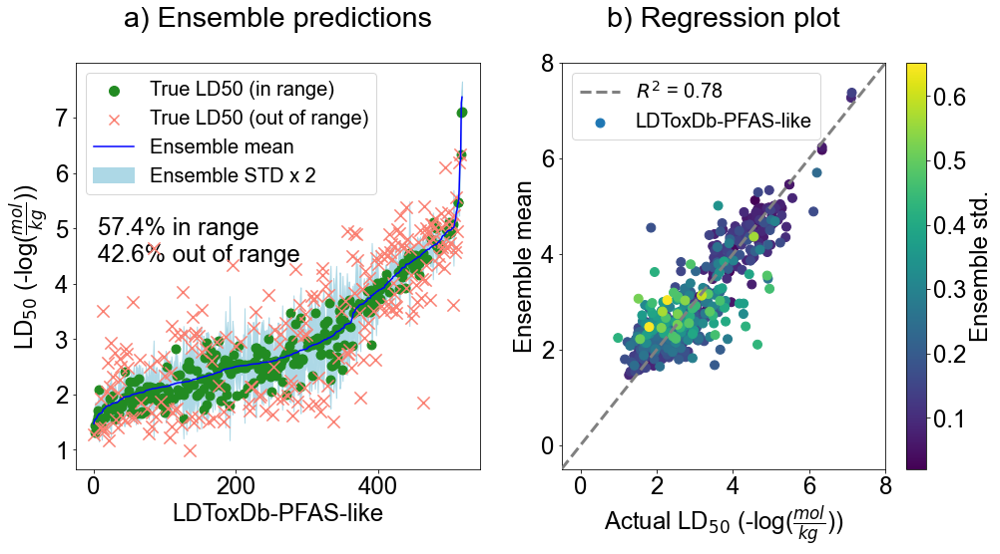

In [5]:
import matplotlib.pyplot as plt
import sklearn
from glob import iglob

def std(vals):
    return np.std(vals, ddof= 1)

def percentile_95(vals):
    return np.percentile(vals, 95)

def percentile_5(vals):
    return np.percentile(vals, 5)

results_slosh = pd.concat(map(pd.read_csv, iglob('../data/deep-ensemble/transfer-models/*_predictions.csv')))
result_pivot = results_slosh.pivot_table(index=['smiles'], aggfunc=[np.mean, std, percentile_95, percentile_5])

result_pivot['up'] = result_pivot['percentile_95']['prediction_neglogld50']
result_pivot['down'] = result_pivot['percentile_5']['prediction_neglogld50']

result_pivot['actual_neglogld50'] = result_pivot['mean']['actual_neglogld50']
result_pivot['mu'] = result_pivot['mean']['prediction_neglogld50']
result_pivot['mu_std'] = result_pivot['std']['prediction_neglogld50']

result_pivot['ub'] = result_pivot['mu'] + (2 * result_pivot['mu_std'])
result_pivot['lb'] = result_pivot['mu'] - (2 * result_pivot['mu_std'])

result_pivot['in_interval'] = (result_pivot['actual_neglogld50'] >= result_pivot['lb'])\
                                & (result_pivot['actual_neglogld50'] <= result_pivot['ub'])

result_pivot_sort = result_pivot.sort_values(by='mu')

indices = np.arange(len(result_pivot_sort.index))

fig, (ax,ax2) = plt.subplots(figsize=(16,7.5), dpi=72, facecolor='white',ncols=2, gridspec_kw={'width_ratios': [1, 1]})
plt.rc('font', weight='normal', size=24, family='Arial')
plt.rc('axes', labelsize=24)

ax.scatter(indices[result_pivot_sort.in_interval], result_pivot_sort['actual_neglogld50'].loc[result_pivot_sort.in_interval],
           s=80, color='forestgreen', zorder=5, label='True LD50 (in range)', marker='o')
ax.scatter(indices[~result_pivot_sort.in_interval], result_pivot_sort['actual_neglogld50'].loc[~result_pivot_sort.in_interval],
           s=150, color='salmon', zorder=5, label='True LD50 (out of range)', marker='x')
ax.plot(indices, result_pivot_sort['mu'], color='blue', zorder=6, label='Ensemble mean')
lwidth = ax.transData.transform((1,0))[0] - ax.transData.transform((0,0))[0]
ax.fill_between(indices, result_pivot_sort['lb'], result_pivot_sort['ub'], color='lightblue', zorder=-1, label='Ensemble STD x 2')
ax.set_title('a) Ensemble predictions\n')
ax.set_ylabel('LD$_{50}$ (-log($\\frac{mol}{kg}$))')
ax.set_xlabel('LDToxDb-PFAS-like')

pct_in = len(result_pivot_sort.loc[result_pivot_sort.in_interval]) / len(result_pivot_sort) * 100
pct_out = 100 - pct_in
ax.text(5, 4.4, '%2.1f%% in range\n%2.1f%% out of range' % (pct_in, pct_out))

handles, labels = ax.get_legend_handles_labels()
handles = [handles[1], handles[2], handles[0], handles[3]]
labels = [labels[1], labels[2], labels[0], labels[3]]

lgnd = ax.legend(handles,labels,loc=2, fontsize=20)
lgnd.legendHandles[0].set_sizes([100])
lgnd.legendHandles[1].set_sizes([100])
lgnd.legendHandles[3].set_linewidth(2)

rr = result_pivot_sort.sort_values(by='mu_std')
cb = ax2.scatter(rr['actual_neglogld50'], rr['mu'], s=80, label='LDToxDb-PFAS-like', c=rr['std']['prediction_neglogld50'], zorder=4)
ax2.plot([0,1],[0,1], transform=ax2.transAxes, zorder=10, color='grey', linewidth=3, linestyle='dashed', label='$R^2$ = %0.2f' % sklearn.metrics.r2_score(result_pivot_sort['actual_neglogld50'], result_pivot_sort['mu']))
ax2.set_ylabel('Ensemble mean')
ax2.set_xlabel('Actual LD$_{50}$ (-log($\\frac{mol}{kg}$))')
ax2.set_ylim((-0.5,8))
ax2.set_xlim((-0.5,8))
ax2.set_yticks([0,2,4,6,8])
ax2.set_xticks([0,2,4,6,8])
fig.colorbar(cb).set_label('Ensemble std.')
ax2.set_title('b) Regression plot\n')

lgnd = ax2.legend(loc='upper left', fontsize=20)

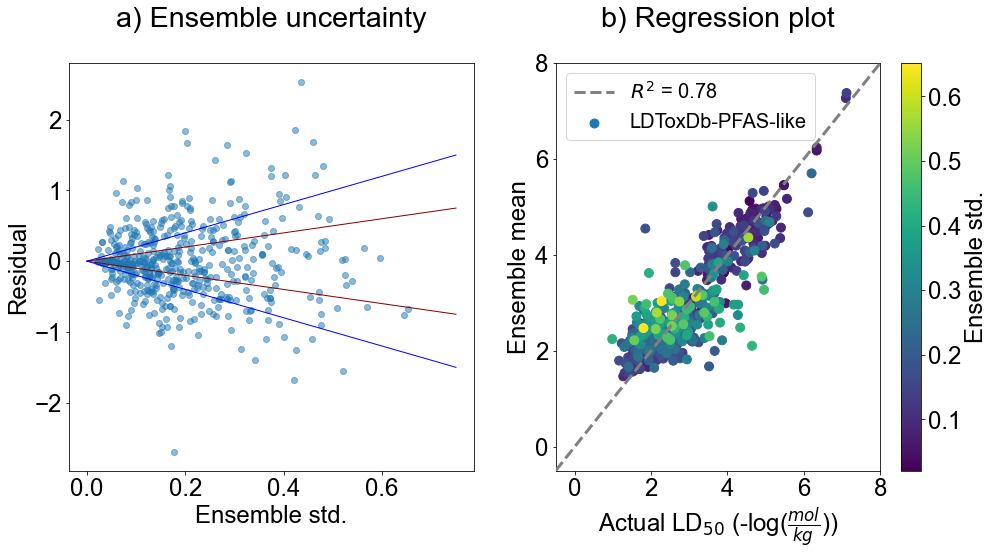

In [56]:
import matplotlib.pyplot as plt
import sklearn
from glob import iglob

def std(vals):
    return np.std(vals, ddof= 1)

results_slosh = pd.concat(map(pd.read_csv, iglob('../data/deep-ensemble/transfer-models/*_predictions.csv')))
result_pivot = results_slosh.pivot_table(index=['smiles'], aggfunc=[np.mean, std])

result_pivot['actual_neglogld50'] = result_pivot['mean']['actual_neglogld50']
result_pivot['mu'] = result_pivot['mean']['prediction_neglogld50']
result_pivot['mu_std'] = result_pivot['std']['prediction_neglogld50']
result_pivot['residual'] = result_pivot['actual_neglogld50']-result_pivot['mu']
result_pivot['residual_norm'] = result_pivot['residual'] / result_pivot['residual'].abs().max()

result_pivot['ub'] = result_pivot['mu'] + (2 * result_pivot['mu_std'])
result_pivot['lb'] = result_pivot['mu'] - (2 * result_pivot['mu_std'])

result_pivot['in_interval'] = (result_pivot['actual_neglogld50'] >= result_pivot['lb'])\
                                & (result_pivot['actual_neglogld50'] <= result_pivot['ub'])

result_pivot_sort = result_pivot.sort_values(by='mu')

indices = np.arange(len(result_pivot_sort.index))

plt.rc('font', weight='normal', size=24, family='Arial')
plt.rc('axes', labelsize=24)

fig, (ax,ax2) = plt.subplots(figsize=(16,7.5), dpi=72, facecolor='white',ncols=2, gridspec_kw={'width_ratios': [1, 1]})
ax.scatter(result_pivot['mu_std'], result_pivot['residual'], alpha=0.5)
ax.plot([0,0.75],[0,0.75], color='darkred', linewidth=1)
ax.plot([0,0.75],[0,-0.75], color='darkred', linewidth=1)
ax.plot([0,0.75],[0,1.5], color='blue', linewidth=1)
ax.plot([0,0.75],[0,-1.5], color='blue', linewidth=1)
ax.set_ylabel('Residual')
ax.set_xlabel('Ensemble std.')

ax.set_title('a) Ensemble uncertainty\n')

rr = result_pivot_sort.sort_values(by='mu_std')
cb = ax2.scatter(rr['actual_neglogld50'], rr['mu'], s=80, label='LDToxDb-PFAS-like', c=rr['std']['prediction_neglogld50'], zorder=4)
ax2.plot([0,1],[0,1], transform=ax2.transAxes, zorder=10, color='grey', linewidth=3, linestyle='dashed', label='$R^2$ = %0.2f' % sklearn.metrics.r2_score(result_pivot_sort['actual_neglogld50'], result_pivot_sort['mu']))
ax2.set_ylabel('Ensemble mean')
ax2.set_xlabel('Actual LD$_{50}$ (-log($\\frac{mol}{kg}$))')
ax2.set_ylim((-0.5,8))
ax2.set_xlim((-0.5,8))
ax2.set_yticks([0,2,4,6,8])
ax2.set_xticks([0,2,4,6,8])
fig.colorbar(cb).set_label('Ensemble std.')
ax2.set_title('b) Regression plot\n')

lgnd = ax2.legend(loc='upper left', fontsize=20)

# Latent Space

For the latent space method, we can directly use models saved from the transfer learning analysis. Latent space measures the latent distance of predicted compounds to the nearest compound in the training set. We will load a checkpoint model, remove the last layer, and collect the embeddings for every compound in that training fold.

In [35]:
import umap

def euclidean_dist(x1, y1, x2, y2):
    return np.sqrt((x2-x1)**2 + (y2-y1)**2)

def distances(target_space, point):
    x, y = point

    return [euclidean_dist(x,y,tx,ty) for tx,ty in target_space]

for fold_no, (train, test) in enumerate(kfold.get_folds('mordred', 'pfas_like')):
    x_train, y_train, smiles_train = train
    x_test, y_test, smiles_test = test

    y_train = experimental_setup.scaler.fit_transform(y_train)

    # Instantiate and load base model
    model = mordred()
    model.build(input_shape=x_train.shape)

    fn = 'transfer_dnn_mordred' + str(fold_no) + '_' + sampling_type + '_ensemble0' #use first DE model
    model_path = '../data/deep-ensemble/transfer-models/chkpt/%s.chkpt' % fn

    model.load_weights(model_path)
    model_latent = tf.keras.models.Sequential(model.layers[:-1])
    
    reducer = umap.UMAP(n_neighbors=50)
    
    train_latent = model_latent.predict(x_train)
    train_embedding = reducer.fit_transform(train_latent)
    
    test_latent = model_latent.predict(x_test)
    test_embedding = reducer.transform(test_latent)
    
    #Calculate distance from each test sample to nearest training point. This can take some time
    test_dist_matrix = np.array([distances(train_embedding, test_sample) for test_sample in test_embedding])
    test_distances = [np.median(dist[np.argpartition(dist, 1)[:1]]) for dist in test_dist_matrix]
    
    y_hat = experimental_setup.scaler.inverse_transform(model.predict(x_test))

    results = pd.DataFrame({
        'smiles': smiles_test.flatten(),
        'prediction_neglogld50': y_hat.flatten(),
        'prediction_mgkg': converter.convert_to_mgkg(y_hat, smiles_test),
        'prediction_epa': converter.convert_to_epa(y_hat, smiles_test),
        'actual_neglogld50': y_test.flatten(),
        'actual_mgkg': converter.convert_to_mgkg(y_test, smiles_test),
        'actual_epa': converter.convert_to_epa(y_test, smiles_test),
        
        'prediction_latent_dist': test_distances
    })
    
    results.to_csv('../data/latent-space/%s_predictions.csv' % fn)

Now load all results and plot basic analysis. Latent space, unlike Deep Ensemble, requires a calibration of latent distances to residual errors in order to translate distances to endogenous uncertainty intervals. To avoid  involved analysis, we take a different route. Uncertainty as a measurement is meant to inform where model accuracy may be low. Using this metric, we can plot prediction residual by latent distance and check if results meet this assumption.

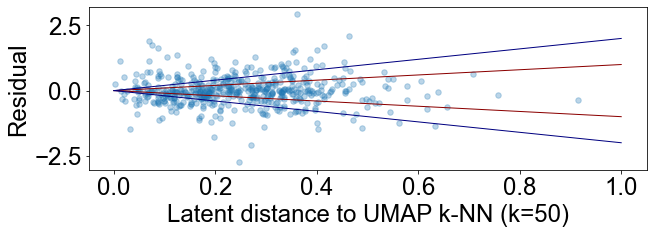

In [55]:
results_slosh = pd.concat(map(pd.read_csv, iglob('../data/latent-space/*_predictions.csv')))

plt.figure(figsize=(10,3))

residuals = results_slosh['actual_neglogld50'] - results_slosh['prediction_neglogld50']

plt.ylabel('Residual')
plt.xlabel('Latent distance to UMAP k-NN (k=50)')
plt.scatter(results_slosh['prediction_latent_dist'], residuals, s=30, alpha=0.3)
plt.plot([0,1],[0,1], color='darkred', linewidth=1)
plt.plot([0,1],[0,-1], color='darkred', linewidth=1)
plt.plot([0,1],[0,2], color='navy', linewidth=1)
plt.plot([0,1],[0,-2], color='navy', linewidth=1)

These results aren't entirely persuasive at first glance.

# Comparison
Let's compare Deep Ensemble to Latent Space. We do this by directly calculating Pearson correlation between the uncertainty metric and the prediction residual. For Deep Ensemble, the uncertainty metric is the variance of the ensemble prediction. For Latent Space, the latent distance. We group compounds by ClassyFire Superclass first.

In [114]:
results_ls = pd.concat(map(pd.read_csv, iglob('../data/latent-space/*_predictions.csv')))
results_de = pd.concat(map(pd.read_csv, iglob('../data/deep-ensemble/transfer-models/*_predictions.csv')))
results_de = results_de.pivot_table(index=['smiles'], aggfunc=[np.mean, std])

results_ls['abs_residual'] = np.abs(results_ls['actual_neglogld50'] - results_ls['prediction_neglogld50'])
results_de['abs_residual'] = np.abs(results_de['mean']['actual_neglogld50'] - results_de['mean']['prediction_neglogld50'])
results_de['prediction_std'] = results_de['std']['prediction_neglogld50']

class_ref = pd.read_csv('../data/ldtoxdb-classified.csv')

results_ls = results_ls.merge(class_ref, left_on='smiles', right_on='SMI')
results_de = results_de.merge(class_ref, left_on='smiles', right_on='SMI')

#Only grab superclasses with more than 10 substituents
counts = results_de['Superclass'].value_counts()
target_classes = counts[counts >= 10].keys()

results_ls = results_ls.loc[results_ls.Superclass.isin(target_classes)]
results_de = results_de.loc[results_de.Superclass.isin(target_classes)]

C:\Users\jfeinstein\Anaconda3\envs\molan\lib\site-packages\pandas\core\reshape\merge.py:643: UserWarning: merging between different levels can give an unintended result (2 levels on the left,1 on the right)
  warnings.warn(msg, UserWarning)


In [161]:
pd.DataFrame({
    'n': results_de.groupby('Superclass').size(),
    'Deep Ensemble': results_de.groupby('Superclass')[[('prediction_std',''), ('abs_residual', '')]].corr().iloc[0::2,-1].values,
    'Latent Space': results_ls.groupby('Superclass')['prediction_latent_dist', 'abs_residual'].corr().iloc[0::2,-1].values,
    'Singletons': (results_de.groupby('Superclass')['Subclass'].value_counts() == 1).groupby('Superclass').sum()
}).sort_values(by='n', ascending=False)

C:\Users\jfeinstein\Anaconda3\envs\molan\lib\site-packages\ipykernel_launcher.py:4: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  after removing the cwd from sys.path.


,n,Deep Ensemble,Latent Space,Singletons
Superclass,,,,
Organoheterocyclic compounds,214,0.343684,0.046942,17
Benzenoids,168,0.302352,0.077135,6
Organohalogen compounds,42,0.531449,0.010441,0
Lipids and lipid-like molecules,27,0.417568,-0.082504,0
Organic acids and derivatives,23,0.635386,0.373022,5
Organic oxygen compounds,23,0.416972,0.296646,2
Organic nitrogen compounds,10,0.345110,0.463231,0


Deep Ensemble has more strength in our dataset. Further analysis may examine a Deep Ensemble Latent Space approach where embedded distances are measured for every ensemble employed for prediction.